In [1]:
import localcider
from localcider.sequenceParameters import SequenceParameters
import protfasta
import glob
import pandas as pd
import numpy as np
import re
import scipy
from scipy import stats
import matplotlib.pyplot as plt
from collections import defaultdict 
from Bio.Seq import Seq
import Bio
import matplotlib.patches as mpatches
import seaborn as sns
import editdistance
import matplotlib
lightblue , darkblue, lightgreen, darkgreen, pink =  '#a6cee3','#1f78b4','#b2df8a','#33a02c','#fb9a99'
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
import YeastAnalysisfunctions as YAF

# plt.rcParams["font.family"] = "Helvetica"
plt.rcParams['pdf.fonttype'] = 42

# alignment distance vs activity difference 
from Bio import pairwise2
from Bio.pairwise2 import format_alignment
import time

In [2]:
# masterDF = pd.read_csv('../Data/Processed/SC_Glucose_Ratio_MasterDF_20210128_withSeqFeatures.csv')
# masterDF = pd.read_csv('../Data/Processed/SC_Glucose_Ratio_MasterDF_20220729_withSeqFeatures.csv')
# masterDF = pd.read_csv('../Data/Processed/SC_Glucose_Ratio_MasterDF_20230216_withSeqFeatures.csv')
masterDF = pd.read_csv('../Data/Processed/SC_Glucose_Ratio_MasterDF_20240930_withSeqFeatures.csv')

maxActivity = max(masterDF.Activity_SCglucose)
minActivity = min(masterDF[masterDF.Recovered].Activity_SCglucose)

Activity = 'Activity_SCglucose'
print('%i of %i Designed ADs recovered, %.1f percent'%(sum(masterDF['Recovered']),len(masterDF),100.0*sum(masterDF['Recovered'])/len(masterDF)))




#define WT
ScerWTactivity = np.mean(masterDF[masterDF.ADseq=='STDSTPMFEYENLEDNSKEWTSLFDNDIPVTTDDVSLADK'][Activity])
ScerWTactivity
ScerWTactivity_altCAD = np.mean(masterDF[masterDF.Name=='GCN4alt_0'][Activity])
ScerWT_DF = masterDF[masterDF.ADseq=='STDSTPMFEYENLEDNSKEWTSLFDNDIPVTTDDVSLADK']
ScerWT_DF['WF'] = ScerWT_DF.W +ScerWT_DF.F
masterDF['WFL']=masterDF.W +masterDF.F +masterDF.L
masterDF['WF']=masterDF.W +masterDF.F
# masterDF['Controls']

ActivityThresh = ScerWTactivity #15.21%
# HighActivityThresh = 157000 #7.64%
ActivityThresh=100000
HighActivityThresh=150000

ActivityThresh=45373 #new thresholds from Aaron's model June 2024
HighActivityThresh=45373*2

ActivityThresh=  94031 # 80th percentile 20241001

print('WT Gcn4 CAAD activity is %f'%ScerWTactivity)

allAAs = ['A', 'C', 'D', 'E', 'F', 'G', 'H','I', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'V', 'W', 'Y']
#len(allAAs)


18947 of 20731 Designed ADs recovered, 91.4 percent
WT Gcn4 CAAD activity is 137982.570130


/var/folders/5y/4h2cd5wd3xq5hrv4zvnq29gh0000gq/T/ipykernel_7644/4289536496.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ScerWT_DF['WF'] = ScerWT_DF.W +ScerWT_DF.F


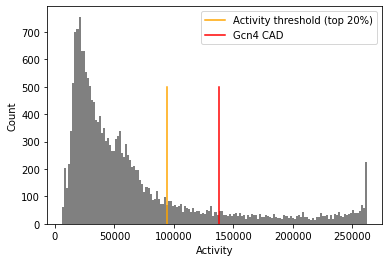

3790 active ADs
20.00 percent of tiles are active 
3961 strong ADs
20.91 percent of tiles are hihgly active
WT S. cer activity is 137982.570130


In [3]:
tempDF = masterDF[masterDF.Recovered]
def plotActivityHist(tempDF,name=''):
#     pd.DataFrame.hist(data=tempDF, column=Activity,bins=150)
    plt.hist(tempDF[Activity],150,color='gray')
    plt.plot([ActivityThresh,ActivityThresh],[0,500],c='orange',label='Activity threshold (top 20%)')
    plt.plot([ScerWTactivity,ScerWTactivity],[0,500],c='red',label='Gcn4 CAD')
#     plt.plot([ScerWTactivity_altCAD,ScerWTactivity_altCAD],[0,500],c='red',label ='Gcn4 altCAAD')
    plt.xlabel('Activity'),plt.ylabel('Count')
    plt.legend(loc='upper right')
    plt.savefig('Figures/PaperFigs/ActivityHistv6%s.pdf'%name)
    plt.show()
    masterDF.columns
    print('%i active ADs' %sum(masterDF[Activity]>ActivityThresh))
    print('%.2f percent of tiles are active ' %(100.0*sum(masterDF[Activity]>ActivityThresh)/sum(masterDF.Recovered)))
    print('%i strong ADs' %sum(masterDF[Activity]>HighActivityThresh))
    print('%.2f percent of tiles are hihgly active' %(100.0*sum(masterDF[Activity]>HighActivityThresh)/sum(masterDF.Recovered)))
#     plt.savefig('Figures/PaperFigs/ActivityHistv6.pdf')
plotActivityHist(tempDF)
print('WT S. cer activity is %f'%ScerWTactivity)


In [4]:

labelDict = {'Charge':'Net Charge','NCPR':'Net charge per residue','WFYL':'Count W,F,Y,L',
             'Aromatics':'Aromatics','HydrophobicityWW':'HydrophobicityWW',
             'WFYLM':'Count W,F,Y,L,M','WFL':'Count W,F,L','WF':'Count W,F',
            'D':'Count D', 'E':'Count E',
             'Charge_Phosphorylated':'Charge when Phosphorylated',
             'P':'Count P',
             'S':'Count S','Disorder':'Predicted Disorder',
             'W': 'Count W',
             'F':'Count F', 'Y':'Count Y',
             'L':'Count L', 'M':'Count M',
            }


In [5]:
masterDF[Activity].quantile(80/100.0)

94031.10168895355

# Count Motifs

W..LF
151944.0 (n=1890) with vs 56587.4 without (17057)

Ttest_indResult(statistic=49.14475199782783, pvalue=0.0)


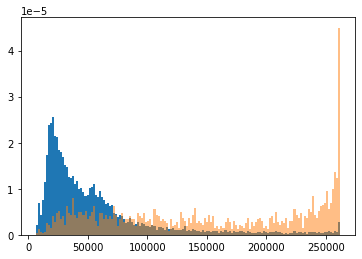

[WFYL]..[WFYL][WFYL]
126295.8 (n=2945) with vs 55020.9 without (16002)

Ttest_indResult(statistic=44.016210135794765, pvalue=0.0)


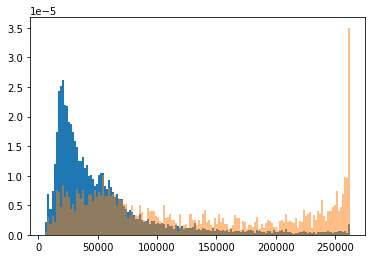

[WFL]..[WFL][WFL]
131515.5 (n=2744) with vs 55021.1 without (16203)

Ttest_indResult(statistic=45.612459905347876, pvalue=0.0)


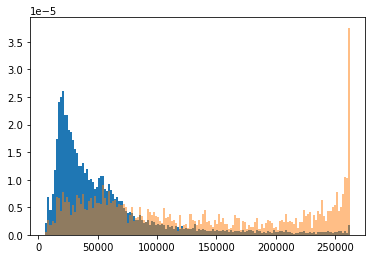

[DE][WFY]
98575.9 (n=6040) with vs 50901.6 without (12907)

Ttest_indResult(statistic=44.87261773575079, pvalue=0.0)


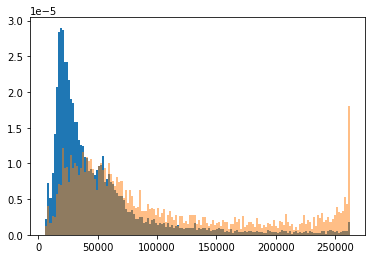

[DE][WF]
101996.3 (n=5379) with vs 51868.2 without (13568)

Ttest_indResult(statistic=44.511966829006454, pvalue=0.0)


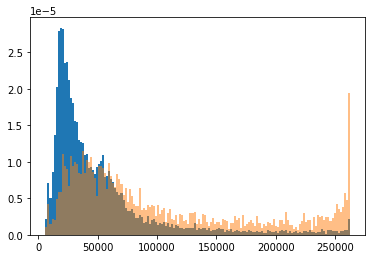

[DE][L]
83709.8 (n=7540) with vs 54459.0 without (11407)

Ttest_indResult(statistic=30.657355004258715, pvalue=4.0363348848912854e-199)


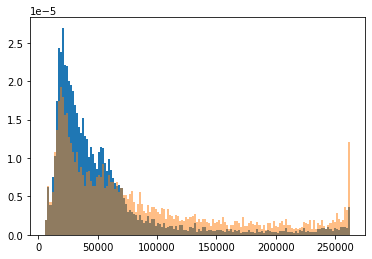

[DE].[WFY]
105767.9 (n=6340) with vs 46150.3 without (12607)

Ttest_indResult(statistic=58.1379891998487, pvalue=0.0)


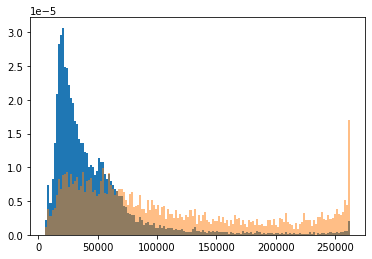

[DE]..[WFY]
110401.1 (n=4164) with vs 53620.7 without (14783)

Ttest_indResult(statistic=42.8246581131116, pvalue=0.0)


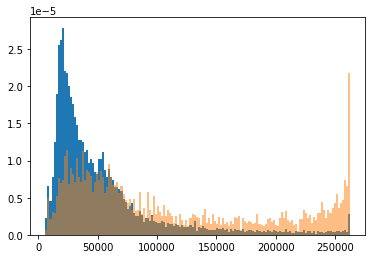

FF
111077.0 (n=671) with vs 64448.1 without (18276)

Ttest_indResult(statistic=15.052225436922212, pvalue=1.476074714885122e-44)


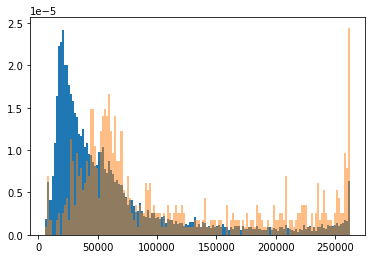

F.F
109625.5 (n=766) with vs 64265.6 without (18181)

Ttest_indResult(statistic=16.21938347868185, pvalue=2.0683978293213505e-51)


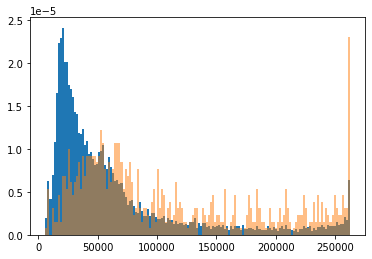

F..F
94233.7 (n=2747) with vs 61328.7 without (16200)

Ttest_indResult(statistic=22.721203216543632, pvalue=1.672619065820492e-106)


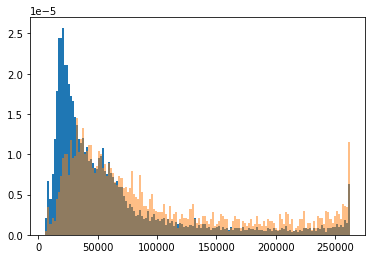

[FY].....[FY]DF
205182.3 (n=35) with vs 65842.0 without (18912)

Ttest_indResult(statistic=15.042828595212853, pvalue=1.2383545870645437e-16)


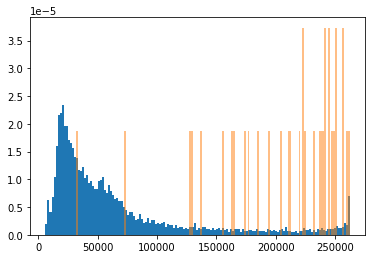

D.F
115058.3 (n=2623) with vs 58232.5 without (16324)

Ttest_indResult(statistic=37.45924072027867, pvalue=7.893532070379326e-254)


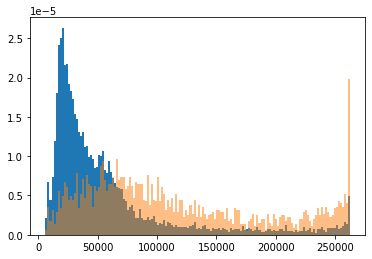

D..F
121890.9 (n=1793) with vs 60267.9 without (17154)

Ttest_indResult(statistic=30.54854225374722, pvalue=4.941110702061259e-168)


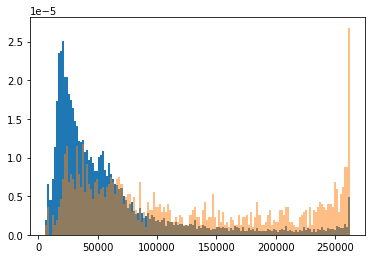

FD
109485.1 (n=4336) with vs 53224.1 without (14611)

Ttest_indResult(statistic=43.96867711931385, pvalue=0.0)


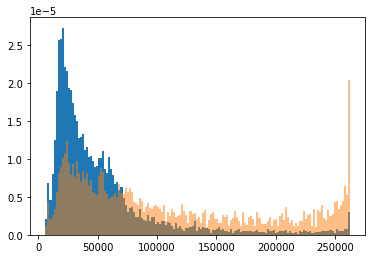

F.D
120733.9 (n=2443) with vs 58012.2 without (16504)

Ttest_indResult(statistic=38.68239413242962, pvalue=6.390647382941908e-263)


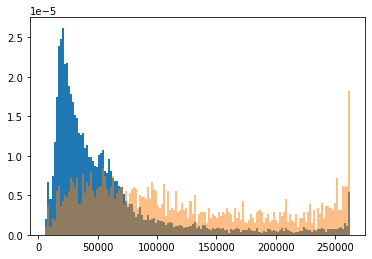

F..D
112520.7 (n=2674) with vs 58471.4 without (16273)

Ttest_indResult(statistic=33.680597155926684, pvalue=3.5629259526175256e-212)


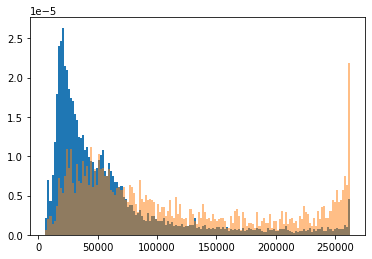

MF.Y..L
171521.3 (n=45) with vs 65848.4 without (18902)

Ttest_indResult(statistic=10.424457553184915, pvalue=1.7406788450728473e-13)


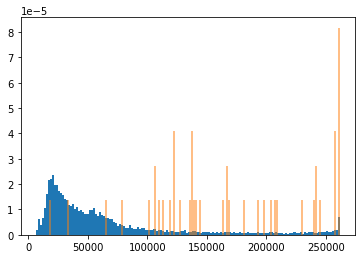

M..Y..L
170656.0 (n=48) with vs 65833.9 without (18899)

Ttest_indResult(statistic=10.305130743932645, pvalue=1.1490782384704886e-13)


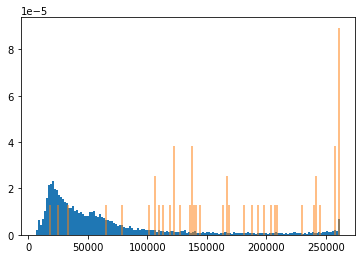

SP
73722.9 (n=10672) with vs 56267.6 without (8275)

Ttest_indResult(statistic=19.996864558480983, pvalue=4.756516985368322e-88)


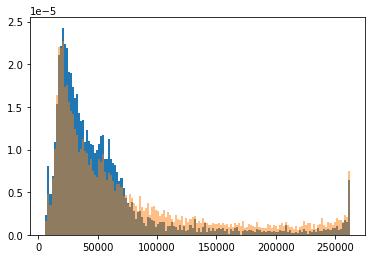

[WFYL]...[WFYL][WFYL]
82323.5 (n=1058) with vs 65139.9 without (17889)

Ttest_indResult(statistic=8.130054291725667, pvalue=1.08922944019246e-15)


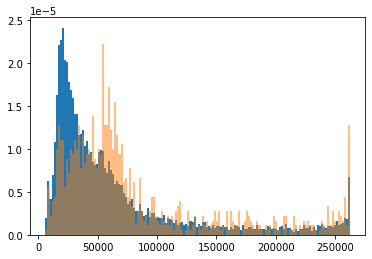

[MDENQSTYG][ADEFILMNQSTVWY][ILVFWM][ADEFILMNQSTVWY][ADEFHIKLMNQRSTVWY][ADEFHIKLMNQRSTVWY][ADEFILMNQSTVWY][ILVFWM][ILVFWMAY][ADEFGILMNPQSTVWY]
85900.8 (n=770) with vs 65260.6 without (18177)

Ttest_indResult(statistic=8.530333904037718, pvalue=6.90826909905809e-17)


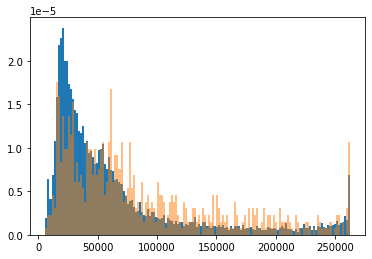

In [6]:
# Do tiles with Scer motifs have higher activity?
# 
def CountMotifs(currentDF, motiflist,column='ADseq',printstats =True, plothist=True):
    for motif in motiflist:
        tempcol = []
        for seq in currentDF[column]:
            hits = re.search(motif,seq)
            if hits:
                matches = re.findall(motif,seq)
                tempcol.append(len(matches))
            else:
                tempcol.append(0)
        currentDF[motif]=tempcol
        if  printstats :
#             plt.hist(currentDF[Activity],150) #Blue hist includes not detected ADs
            indx = (currentDF[motif]>0)&(currentDF.Recovered)
            tempDF  =  currentDF[indx]
            notindx = (currentDF[motif]==0)&(currentDF.Recovered)
            notDF = currentDF[notindx]
            # stats does not use non detected ADs
            test = stats.ttest_ind(tempDF[Activity],notDF[Activity], equal_var=False)
            print(motif)
            print('%.1f (n=%i) with vs %.1f without (%i)\n'%(np.mean(tempDF[Activity]),sum(indx),np.mean(notDF[Activity]),sum((currentDF[motif]==0)&(currentDF.Recovered))))
            print(test)
        if plothist:
            #Blue hist does not use non detected ADs
            plt.hist(notDF[Activity],150,density=True) 
            # orange hist does not use non detected ADs
            plt.hist(tempDF[Activity],150,alpha=.5,density=True)
            plt.savefig('Figures/CompareActivitywMotif_%s.pdf'%motif)
            plt.show()
    return currentDF
motiflist = ['W..LF',
             '[WFYL]..[WFYL][WFYL]',
             '[WFL]..[WFL][WFL]',
             '[DE][WFY]',
             '[DE][WF]',
#              '[DE][LM]','[DE][M]',# not as strong
             '[DE][L]',
             '[DE].[WFY]',
             '[DE]..[WFY]',
             'FF','F.F','F..F',
             '[FY].....[FY]'
#              '[WFYL][WFYL]','[WFYL].[WFYL]','[WFYL]..[WFYL]',
             'DF','D.F','D..F','FD','F.D','F..D',
             'MF.Y..L', 
             'M..Y..L', 
#              '[DE]...[DE]',
#              '[DE]....[DE]',
#              '[DE].....[DE]',
             'SP',
             '[WFYL]...[WFYL][WFYL]',#kix binding motif
#              '[FWYL].[FWYL]..[FWYL]'
#              ACDEFGHIKLMNPQRSTVWY              
             '[MDENQSTYG][ADEFILMNQSTVWY][ILVFWM][ADEFILMNQSTVWY][ADEFHIKLMNQRSTVWY][ADEFHIKLMNQRSTVWY][ADEFILMNQSTVWY][ILVFWM][ILVFWMAY][ADEFGILMNPQSTVWY]'#(9aaTAD)
            ]
motiflist_publication = ['W..LF',
             '[WFYL]..[WFYL][WFYL]',
             '[DE][WFY]',
             'FF','F.F','F..F',
                         'MF.Y..L',
            ]

# tempDF2 = CountMotifs(tempDF,motiflist)
masterDF = CountMotifs(masterDF,motiflist)


# Tiles with saturated Activity (max activity)

In [7]:
# how many very high activity ADs--saturating activity
indx = (masterDF[Activity] >=( (max(masterDF[Activity]))) )
print('There are %i ADs with saturated max activity'%sum(indx))
MaxSat = masterDF[indx]
# how many very high activity ADs--saturating activity
indx = (masterDF[Activity] <=( (min(masterDF[Activity]))) )
print('There are %i ADs with saturated min activity'%sum(indx))
MaxSat[['Activity_BioRepA_BYS4','Activity_BioRepB_BYS4', 'TotalReads_BioRepB_BYS4','TotalReads_BioRepA_BYS4']]

There are 47 ADs with saturated max activity
There are 23 ADs with saturated min activity


,Activity_BioRepA_BYS4,Activity_BioRepB_BYS4,TotalReads_BioRepB_BYS4,TotalReads_BioRepA_BYS4
196,NaN,262143.0,1493.0,NaN
1682,NaN,262143.0,41.0,NaN
1987,NaN,262143.0,1787.0,NaN
2396,262143.0,NaN,NaN,1119.0
2644,NaN,262143.0,436.0,NaN
3299,262143.0,NaN,NaN,444.0
3588,262143.0,NaN,NaN,572.0
5419,262143.0,NaN,NaN,494.0
5461,262143.0,NaN,NaN,2715.0
5502,262143.0,NaN,NaN,1297.0


# reproducible low activity tiles for Melivin

225


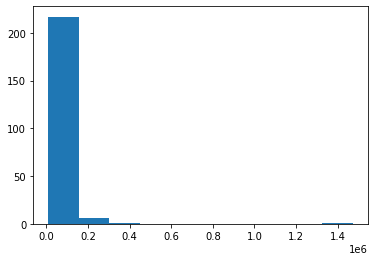

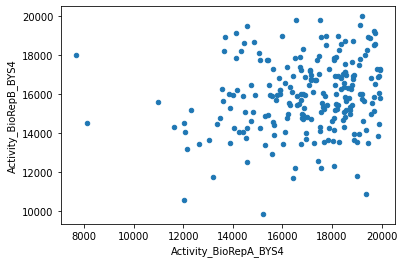

In [8]:
# tiles with many reads and a low activity measurement in both replicates.
tempreadthresh = 10000
tempActThresh = 20000
indx1 = (masterDF.TotalReads_BioRepA_BYS4 >tempreadthresh)&(masterDF.TotalReads_BioRepB_BYS4 >tempreadthresh)
indx2 = (masterDF.Activity_BioRepA_BYS4 <tempActThresh)&(masterDF.Activity_BioRepB_BYS4<tempActThresh)
indx = indx1&indx2
print(sum(indx))
tempDF = masterDF[indx]
plt.hist(tempDF.TotalReads_BioRepA_BYS4)
tempDF.plot.scatter('Activity_BioRepA_BYS4', 'Activity_BioRepB_BYS4')
tempDF.to_csv('ExportedSeqLists/NegativeControlsForMelvin_20231023.csv')

# reproducible high activity tiles for Joseph

40


,ADseq,Activity_BioRepA_BYS4,Activity_BioRepB_BYS4,TotalReads_BioRepB_BYS4,TotalReads_BioRepA_BYS4
675,LTALTSPSLYESPDFGYDVSPGFGSNDFDTGSNQWFSLFP,261564.191229,261769.391733,16447.0,32536.0
912,NESPEYKDNFDVSPFIGNGDLDHALAGDPWYPLFPQEELV,261845.951490,260729.311520,36573.0,24939.0
1210,IWDDEWALVSEFFPNGAEYSPQLGHEIASCATVSPSEVFP,261222.698981,262006.407565,12180.0,48008.0
2714,LFQTQTNPVDLPDLFDFSTDQFGADFDLSMLSPQQIPTGI,261376.358936,261761.195390,15416.0,50739.0
2756,MMSTPNMAHDLPDLFDFSTDQFGADFDLSMLSPQQIPTGI,261106.776377,261346.821538,76173.0,33502.0
2757,NMAHDLPDLFDFSTDQFGADFDLSMLSPQQIPTGIMAPKE,260469.129052,261887.770359,10312.0,42512.0
5598,LTTPSNYGESPEFDSYEFSPNFGDLDATSTENWFPLFPES,260074.271283,261912.966387,32055.0,11705.0
6046,NLTSPDIDASPFINDSFETSPMFQGEPMLNSSNDWFSLFP,260165.259642,261383.245941,169645.0,47436.0
6674,DGSPDFDTFDISPSFGHSDLDNPDSWFSLFPDANPLPQAQ,261972.677921,261981.225529,20567.0,12554.0
6675,FDTFDISPSFGHSDLDNPDSWFSLFPDANPLPQAQTQTQA,261974.214863,260610.311954,50379.0,30720.0


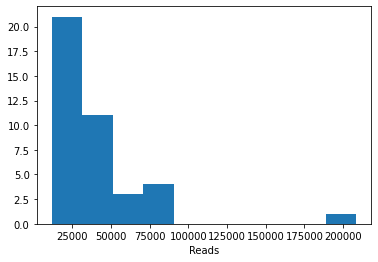

In [9]:
# tiles with many reads and a very high activity measurement in both replicates.
tempreadthresh = 10000
tempActThresh = 260000
indx1 = (masterDF.TotalReads_BioRepA_BYS4 >tempreadthresh)&(masterDF.TotalReads_BioRepB_BYS4 >tempreadthresh)
indx2 = (masterDF.Activity_BioRepA_BYS4 >= tempActThresh)&(masterDF.Activity_BioRepB_BYS4 >= tempActThresh)
indx = indx1&indx2
print(sum(indx))
tempDF = masterDF[indx]
plt.hist(tempDF.TotalReads_BioRepA_BYS4), plt.xlabel('Reads')
tempDF.to_csv('ExportedSeqLists/VeryStrongADs_20241002.csv')
tempDF[['ADseq','Activity_BioRepA_BYS4','Activity_BioRepB_BYS4', 'TotalReads_BioRepB_BYS4','TotalReads_BioRepA_BYS4']]

# Build Table 1

In [10]:
#total number of high activity seqs in the dataset
deminator= sum(masterDF[Activity]>ActivityThresh)
print('%i Tiles have high activity in full dataset'%deminator)

# high WFYL and high acidity
def printForThresh( chargethresh = -3,hydrothresh = 3):
    indx = masterDF.Recovered & (masterDF.WFYL >hydrothresh)&(masterDF.Charge<chargethresh)
    print('There are %i sequences with the composition features of high activity(WFYL >%i and Charge<%i)'%(sum(indx),hydrothresh,chargethresh))
    count = sum(indx&(masterDF[Activity]>ActivityThresh))
    print('%i have high activity %.3f percent of all high activity seqs'%(count,count/deminator))
    print('%.3f percent of seqs in this region have high activity'%(1.0*count/sum(indx)))
printForThresh( chargethresh = -3,hydrothresh = 3)
printForThresh( chargethresh = -5,hydrothresh = 6)
printForThresh( chargethresh = -4,hydrothresh = 4)

3790 Tiles have high activity in full dataset
There are 5217 sequences with the composition features of high activity(WFYL >3 and Charge<-3)
2866 have high activity 0.756 percent of all high activity seqs
0.549 percent of seqs in this region have high activity
There are 2219 sequences with the composition features of high activity(WFYL >6 and Charge<-5)
1650 have high activity 0.435 percent of all high activity seqs
0.744 percent of seqs in this region have high activity
There are 3951 sequences with the composition features of high activity(WFYL >4 and Charge<-4)
2402 have high activity 0.634 percent of all high activity seqs
0.608 percent of seqs in this region have high activity


# Make DFs for AcidBlob ADs and non-acid blob strong tiles

There are 3951 sequences with the composition features of high activity(WFYL >4 and Charge<-4)
2402 have  activity
2453 have high activity
1549 have low activity
There are 2947 sequences with the composition features of high activity(Aromatics >3 and Charge<-4)
2066 have  activity
2103 have high activity
881 have low activity
There are 2157 sequences with the composition features of high activity(W+F >3 and Charge<-4)
1721 have  activity
1744 have high activity
436 have low activity

3790 Tiles have high activity in full dataset
                       Kappa     Omega  OmegaWFY_DE  OmegaWFYL_DE  Disorder  \
Kappa               1.000000  0.418196     0.259376      0.070832  0.056202   
Omega               0.418196  1.000000    -0.119702     -0.135809  0.024909   
OmegaWFY_DE         0.259376 -0.119702     1.000000      0.712439  0.011720   
OmegaWFYL_DE        0.070832 -0.135809     0.712439      1.000000  0.043072   
Disorder            0.056202  0.024909     0.011720      0.043072  1.0

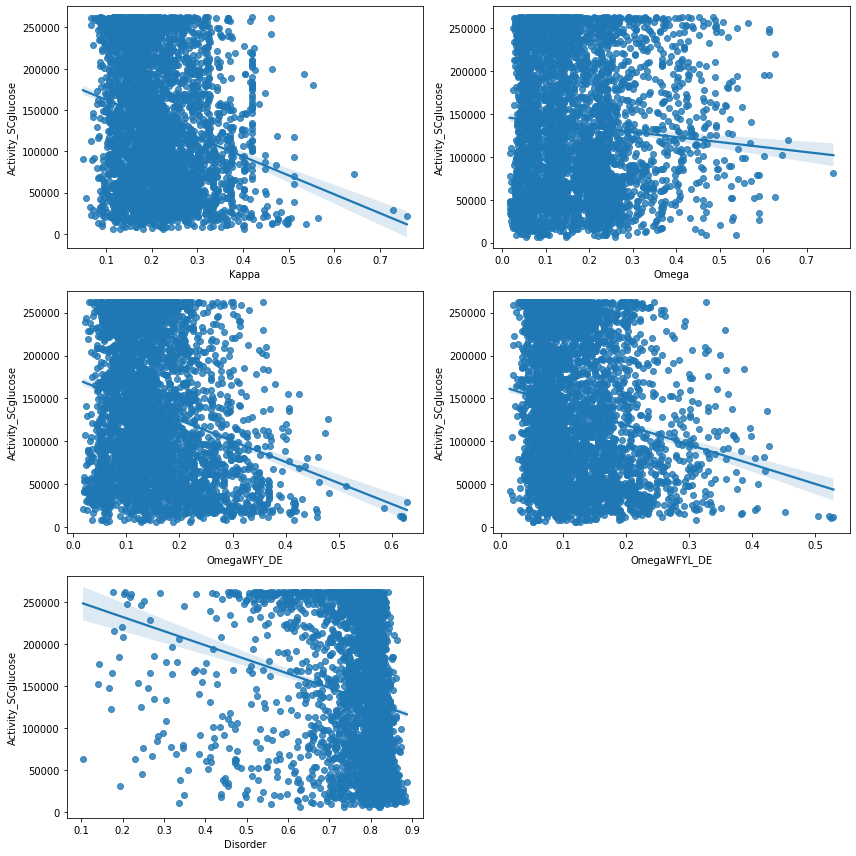

In [11]:
# high WFYL and high acidity
chargethresh = -4
WFYLthresh = 4
indx = masterDF.Recovered & (masterDF.WFYL > WFYLthresh)&(masterDF.Charge<chargethresh)
AcidBlobs_WFYL = masterDF[indx]
print('There are %i sequences with the composition features of high activity(WFYL >%i and Charge<%i)'%(sum(indx), WFYLthresh, chargethresh))
print('%i have  activity'%sum(indx&(masterDF[Activity]>ActivityThresh)))
print('%i have high activity'%sum(indx&(masterDF[Activity]>HighActivityThresh)))
print('%i have low activity'%sum(indx&(masterDF[Activity]<ActivityThresh)))

# high Aromatic and high acidity
aromaticthresh = 3
indx = masterDF.Recovered & (masterDF.Aromatics > aromaticthresh)&(masterDF.Charge<chargethresh)
AcidBlobs_Aromatics = masterDF[indx]
print('There are %i sequences with the composition features of high activity(Aromatics >%i and Charge<%i)'%(sum(indx), aromaticthresh, chargethresh))
print('%i have  activity'%sum(indx&(masterDF[Activity]>ActivityThresh)))
print('%i have high activity'%sum(indx&(masterDF[Activity]>HighActivityThresh)))
print('%i have low activity'%sum(indx&(masterDF[Activity]<ActivityThresh)))

# high WF and high acidity
masterDF['WF'] = masterDF.F +masterDF.W
indx = masterDF.Recovered & (masterDF.WF > 3)&(masterDF.Charge<chargethresh)
AcidBlobs_WF = masterDF[indx]
print('There are %i sequences with the composition features of high activity(W+F >%i and Charge<%i)'%(sum(indx), aromaticthresh, chargethresh))
print('%i have  activity'%sum(indx&(masterDF[Activity]>ActivityThresh)))
print('%i have high activity'%sum(indx&(masterDF[Activity]>HighActivityThresh)))
print('%i have low activity'%sum(indx&(masterDF[Activity]<ActivityThresh)))

#total number of high activity seqs in the dataset
print('\n%i Tiles have high activity in full dataset'%sum(masterDF[Activity]>ActivityThresh))


# check other properties of this set:
def CheckProperties(tempDF):
    PropertySet = ['Kappa', 'Omega','OmegaWFY_DE', 'OmegaWFYL_DE', 'Disorder']
    fig,axes  = plt.subplots( figsize=(12,12))
    for i, prop in enumerate(PropertySet):
        plt.subplot(3,2,1+i)
        sns.regplot(x=prop,y=Activity,data=tempDF, fit_reg=True)
    plt.tight_layout()
    PropertySet.append(Activity)
    print(tempDF[PropertySet].corr())

CheckProperties(AcidBlobs_WFYL)
plt.savefig('Figures/PaperFigs/Supp/ZoomChargeWFCorner_properties.pdf')





In [12]:
#total number of high activity seqs in the dataset
TileDF = masterDF[:-52]

deminator= sum(masterDF[Activity]>ActivityThresh)
print('%i Tiles have high activity in full dataset'%deminator)

# high WFYL and high acidity
printForThresh( chargethresh = -4,hydrothresh = 4)
Sets = ['All','Acid blobs','WxxLF motif', 'Acid blobs with WxxLF']
chargethresh , hydrothresh = -4,4,
AcidBlobs = TileDF.Recovered & (TileDF.WFYL >hydrothresh)&(TileDF.Charge<chargethresh)
AcidBlobsZero = TileDF.Recovered & (TileDF.WFYL >hydrothresh)&(TileDF.Charge<0)
AcidBlobs_WFtemp = TileDF.Recovered & (TileDF.WF >3)&(TileDF.Charge<chargethresh)
Active = (TileDF.Recovered & (TileDF[Activity] > ActivityThresh))
HighlyActive = (TileDF.Recovered & (TileDF[Activity] > HighActivityThresh))
PositivelyCharged = TileDF.Recovered & (TileDF.Charge > 1)

# MimicPhos_WFYL = TileDF.Recovered & (TileDF.WFYL >hydrothresh)&(TileDF.Charge_Phosphorylated <chargethresh)
# MimicPhos_WF = TileDF.Recovered & (TileDF.WF >2)&(TileDF.Charge_Phosphorylated <chargethresh)

Denominator     = sum(Active)
DenominatorHigh = sum(HighlyActive)

Table1 = pd.DataFrame(columns=['Set','Total','Active','Percent Active','Percent of all Active','Highly Active','Percent Highly Active','Percent of all Highly Active'])
Table1 = Table1.append({"Set":'All Tiles','Total':sum(TileDF.Recovered),'Active':Denominator,
                        'Percent Active':np.round(100.0*Denominator/sum(TileDF.Recovered),decimals=1),'Percent of all Active':100.0,
                        'Highly Active':DenominatorHigh, 'Percent Highly Active':np.round(100.0*DenominatorHigh/sum(TileDF.Recovered)),
                        'Percent of all Highly Active':100.0},ignore_index=True)# [sum(TileDF.Recovered),Denominator, 100.0, DenominatorHigh, 100.0]

def AddlinetoDF(Set,indx,Table):
    Numerator1 = sum(indx&Active)
    Fraction1 =np.round(100.0*Numerator1/Denominator,decimals=1)
    percentActive = np.round(100.0*Numerator1/sum(indx),decimals=1)
    Numerator2 = sum(indx&HighlyActive)
    Fraction2 = np.round(100.0*Numerator2/DenominatorHigh,decimals=1)
    percentHighlyActive = np.round(100.0*Numerator2/sum(indx),decimals=1)
    ReturnTable = Table.append({"Set":Set,'Total':sum(indx),'Active':Numerator1,
                                'Percent Active':percentActive ,'Percent of all Active':Fraction1,
                            'Highly Active':Numerator2,'Percent Highly Active':percentHighlyActive,
                                'Percent of all Highly Active':Fraction2},ignore_index=True)# [sum(TileDF.Recovered),Denominator, 100.0, DenominatorHigh, 100.0]
    return ReturnTable
Table1 =AddlinetoDF('Acidic+WFYL',AcidBlobs,Table1)
Table1 =AddlinetoDF('Contains WxxLF Motif',TileDF['W..LF'],Table1)
indx = TileDF['W..LF']&AcidBlobs
Table1 =AddlinetoDF('Acidic+WFYL with WxxLF Motif',indx,Table1)
indx = (~TileDF['W..LF'])&AcidBlobs
Table1 =AddlinetoDF('Acidic+WFYL without WxxLF Motif',indx,Table1)
Table1 =AddlinetoDF('Not Acidic+WFYL',~AcidBlobs,Table1)
Table1 =AddlinetoDF('Acidic+WF>3',AcidBlobs_WFtemp,Table1)
Table1 =AddlinetoDF('WFYL>4, Net Charge < 0',AcidBlobsZero,Table1)
Table1 =AddlinetoDF('Positively Charged',PositivelyCharged,Table1)

# Table1 =AddlinetoDF('Phosphorylated+WFYL',MimicPhos_WFYL,Table1)
# Table1 =AddlinetoDF('Phosphorylated+WF',MimicPhos_WF,Table1)

Table1[['Set', 'Total', 'Active', 'Percent Active', 'Percent of all Active']]
Table1
# {"Set":'All Tiles','Total':sum(TileDF.Recovered), 'Total Active':Denominator,}

3790 Tiles have high activity in full dataset
There are 3951 sequences with the composition features of high activity(WFYL >4 and Charge<-4)
2402 have high activity 0.634 percent of all high activity seqs
0.608 percent of seqs in this region have high activity


/var/folders/5y/4h2cd5wd3xq5hrv4zvnq29gh0000gq/T/ipykernel_7644/1457331789.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Table1 = Table1.append({"Set":'All Tiles','Total':sum(TileDF.Recovered),'Active':Denominator,
/var/folders/5y/4h2cd5wd3xq5hrv4zvnq29gh0000gq/T/ipykernel_7644/1457331789.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ReturnTable = Table.append({"Set":Set,'Total':sum(indx),'Active':Numerator1,
/var/folders/5y/4h2cd5wd3xq5hrv4zvnq29gh0000gq/T/ipykernel_7644/1457331789.py:37: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  ReturnTable = Table.append({"Set":Set,'Total':sum(indx),'Active':Numerator1,
/var/folders/5y/4h2cd5wd3xq5hrv4zvnq29gh0000gq/T/ipykernel_7644/1457331789.py:37: FutureWarning: The 

,Set,Total,Active,Percent Active,Percent of all Active,Highly Active,Percent Highly Active,Percent of all Highly Active
0,All Tiles,18895,3761,19.9,100.0,3932,21.0,100.0
1,Acidic+WFYL,3913,2375,60.7,63.1,2426,62.0,61.7
2,Contains WxxLF Motif,2005,1267,63.2,33.7,1292,64.4,32.9
3,Acidic+WFYL with WxxLF Motif,1593,1181,74.1,31.4,1200,75.3,30.5
4,Acidic+WFYL without WxxLF Motif,2320,1194,51.5,31.7,1226,52.8,31.2
5,Not Acidic+WFYL,16766,1386,8.3,36.9,1506,9.0,38.3
6,Acidic+WF>3,2142,1708,79.7,45.4,1731,80.8,44.0
7,"WFYL>4, Net Charge < 0",8208,3582,43.6,95.2,3721,45.3,94.6
8,Positively Charged,6589,45,0.7,1.2,55,0.8,1.4


In [13]:
def checkPropertyRelationships(masterDF,savefigs =False,Exportplot=False,ExplortPlotName=''):
    PropertySet=[ 'Aromatics','WFYL','D','E','W','F','Y','L','M','P','K','R','Q','G','S']
    # fig,axes  = plt.subplots( figsize=(12,12))
    # for i, prop in enumerate(PropertySet):
    #     plt.subplot(5,4,1+i)
    #     sns.boxplot(x=prop,y=Activity,data=AcidBlobs_WFYL)
    # plt.tight_layout()
    # plt.savefig('Figures/Boxplot_properties.pdf')
    # plt.show()
    fig,axes  = plt.subplots( figsize=(10,8))
    plt.subplot(2,1,1)
    sns.boxplot(x='Charge',y=Activity,data=masterDF, color = lightblue)
    plt.ylabel('Activity')
    plt.subplot(2,1,2)
    sns.stripplot(x='Charge',y=Activity,data=masterDF, color = 'forestgreen')
    plt.ylabel('Activity')
    if savefigs:
        plt.savefig('Figures/Boxplot_Charge.pdf')


    PropertySet=[ 'W','F','Y','Aromatics','L','M','D','E']
    fig,axes  = plt.subplots( figsize=(8,3.8))
    for i, prop in enumerate(PropertySet):
        plt.subplot(2,4,1+i)
        if prop in  ['D','E','Charge']:
            sns.boxplot(x=prop,y=Activity,data=masterDF,color = lightblue)
            sns.stripplot(x=prop,y=Activity,data=masterDF,color = 'k',size=2)
        else:    
            sns.boxplot(x=prop,y=Activity,data=masterDF,color = darkgreen)
            sns.stripplot(x=prop,y=Activity,data=masterDF,color = 'k',size=2)
            plt.ylim([minActivity,maxActivity])
        if i in [1,2,3,5,6,7]:
            plt.ylabel('')
            plt.yticks([])
        else:
            plt.ylabel('Activity')
        plt.ylim([0,maxActivity*1.1])

    plt.tight_layout()
    if savefigs:
        plt.savefig('Figures/Boxplot_Hydroset.pdf')
        plt.show()
    if Exportplot:
        plt.savefig('Figures/PaperFigs/Supp/PropertyRelationships%s.pdf'% ExplortPlotName)


    PropertySet=[ 'W','F','D','E']
    fig,axes  = plt.subplots( figsize=(12,3))
    for i, prop in enumerate(PropertySet):
        plt.subplot(1,4,1+i)
        if i <2:
            sns.boxplot(x=prop,y=Activity,data=masterDF,color = darkgreen)
        else:
            sns.boxplot(x=prop,y=Activity,data=masterDF,color = lightblue)
    plt.tight_layout()
    if savefigs:
        plt.savefig('Figures/Boxplot_Grant.pdf')
        plt.show()

    PropertySet=[ 'Aromatics','Charge']
    fig,axes  = plt.subplots( figsize=(8,3))
    for i, prop in enumerate(PropertySet):
        plt.subplot(1,2,1+i)
        if i <1:
            sns.boxplot(x=prop,y=Activity,data=masterDF,color = darkgreen)
        else:
            sns.boxplot(x=prop,y=Activity,data=masterDF,color = lightblue)
    plt.tight_layout()
    if savefigs:
        plt.savefig('Figures/Boxplot_Grant.pdf')
        plt.show()






    fig,axes  = plt.subplots( figsize=(12,12))
    for i, prop in enumerate(PropertySet):
        plt.subplot(5,4,1+i)
        sns.regplot(x=prop,y=Activity,data=masterDF, fit_reg=True)

    plt.tight_layout()
    plt.savefig('Figures/Regression_properties')
    plt.show()
    fig,axes  = plt.subplots( figsize=(12,12))
    for i, prop in enumerate(PropertySet):
        plt.subplot(5,4,1+i)
        sns.histplot(x=prop,data=masterDF)
    #     bins =np.arange(np.floor(min(masterDF[prop]))-.5,np.ceil(max(masterDF[prop])+2.5))
    #     plt.hist(masterDF[prop],bins)
    plt.tight_layout()
    if savefigs:
        plt.savefig('Figures/Histograms_properties')
        plt.show()


# checkPropertyRelationships(masterDF)

There are 2685 tiles with WFYL = 7


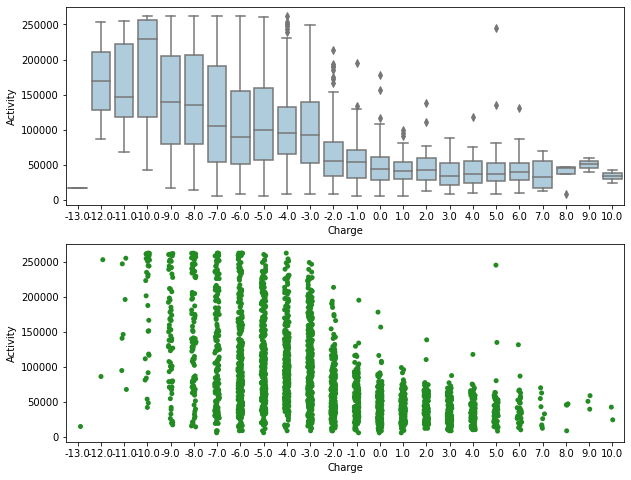

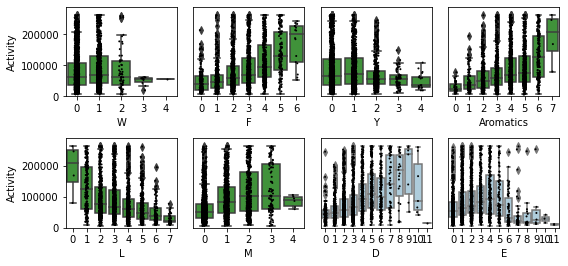

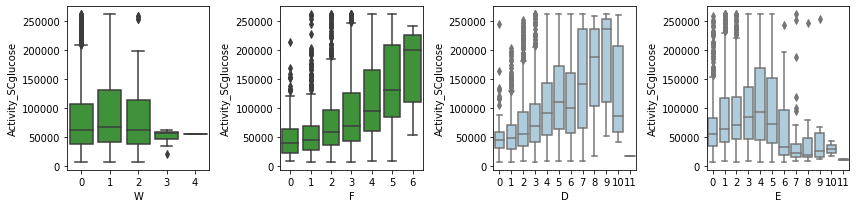

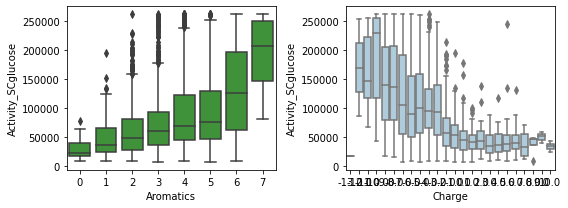

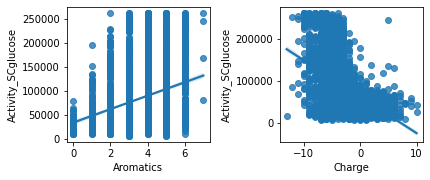

There are 1076 tiles with Charge = -6


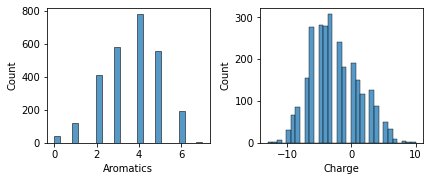

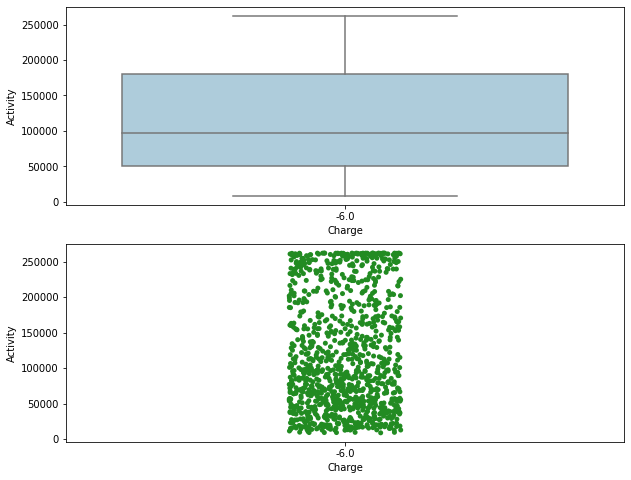

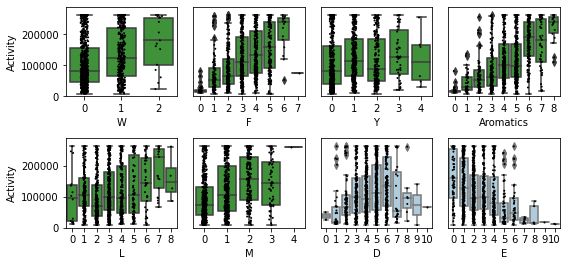

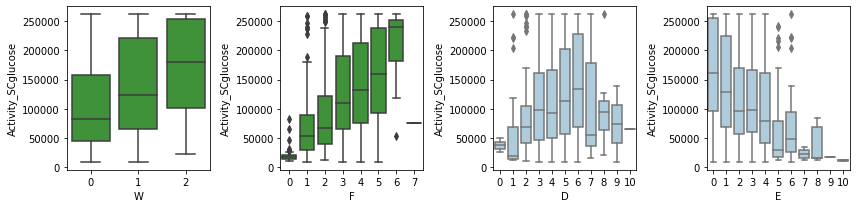

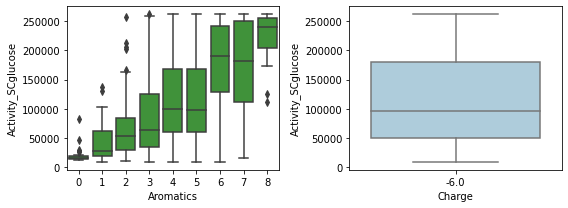

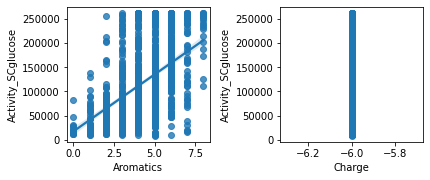

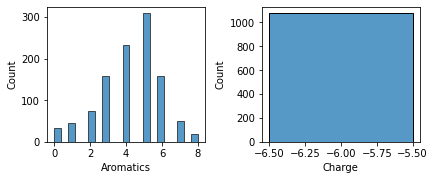

In [14]:
querry = 'WFYL'
count = 7
filenamestring = querry+str(count)
indx = masterDF.Recovered &(masterDF[querry]==count)
tempDF = masterDF[indx]
print('There are %i tiles with %s = %i'%(sum(indx),querry,count))
checkPropertyRelationships(tempDF,Exportplot=True,ExplortPlotName=filenamestring)

querry = 'Charge'
count = -6
filenamestring = querry+str(count)
indx = masterDF.Recovered &(masterDF[querry]==count)
tempDF = masterDF[indx]
print('There are %i tiles with %s = %i'%(sum(indx),querry,count))
checkPropertyRelationships(tempDF,Exportplot=True,ExplortPlotName=filenamestring)


# checkPropertyRelationships(masterDF[masterDF.Recovered],Exportplot=True,ExplortPlotName='All_Data')

There are 2685 tiles with WFYL = 7


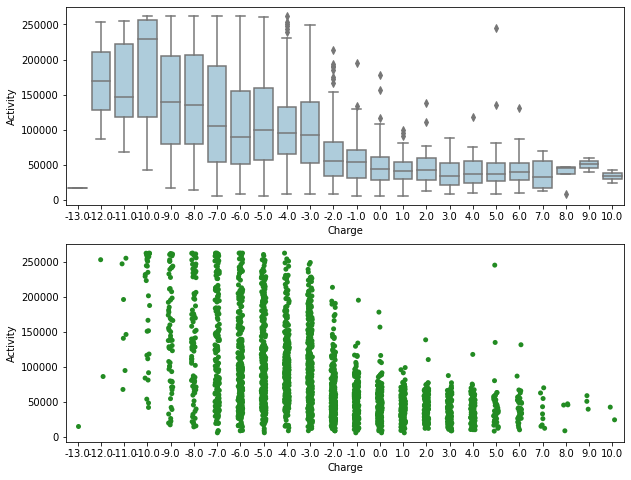

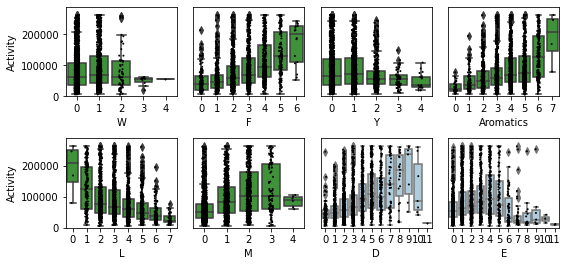

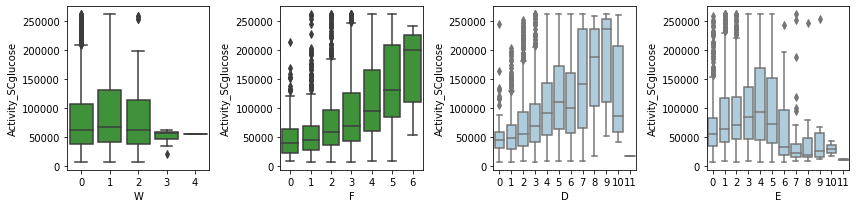

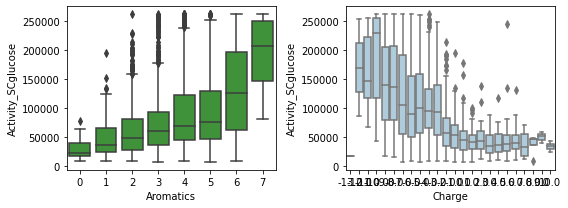

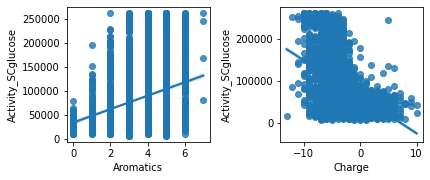

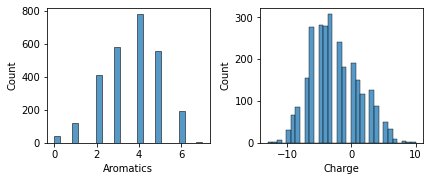

In [15]:
querry = 'WFYL'
count = 7
filenamestring = querry+str(count)
indx = masterDF.Recovered &(masterDF[querry]==count)
tempDF = masterDF[indx]
print('There are %i tiles with %s = %i'%(sum(indx),querry,count))

checkPropertyRelationships(tempDF,Exportplot=True,ExplortPlotName=filenamestring)

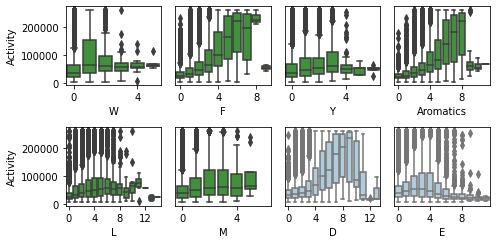

In [17]:
PropertySet=[ 'W','F','Y','Aromatics','L','M','D','E']
fig,axes  = plt.subplots( figsize=(7,3.5))
for i, prop in enumerate(PropertySet):
    plt.subplot(2,4,1+i)
    if prop in ['D','E']:
        sns.boxplot(x=prop,y=Activity,data=masterDF,color = lightblue)
    else:
        sns.boxplot(x=prop,y=Activity,data=masterDF,color = darkgreen)
    if (i ==0) or (i==4):
        plt.ylabel('Activity')
    else:
        plt.yticks([])
        plt.ylabel('')
    if prop in ['L','D']:
        plt.xticks([0,4,8,12])
    if prop in ['E','Aromatics','F']:
        plt.xticks([0,4,8])
    if prop in ['W','Y','M']:
        plt.xticks([0,4])
plt.tight_layout()
plt.savefig('Figures/PaperFigs/AA_Boxplots.pdf')
plt.show()

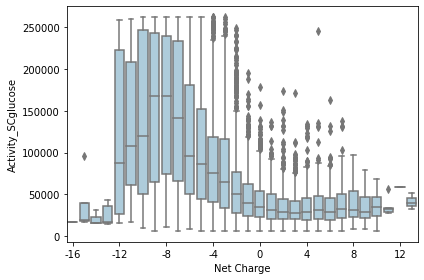

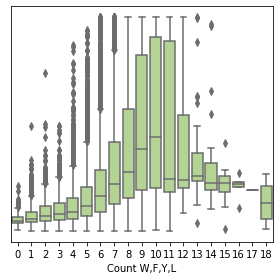

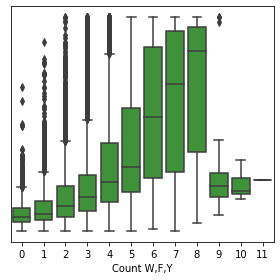

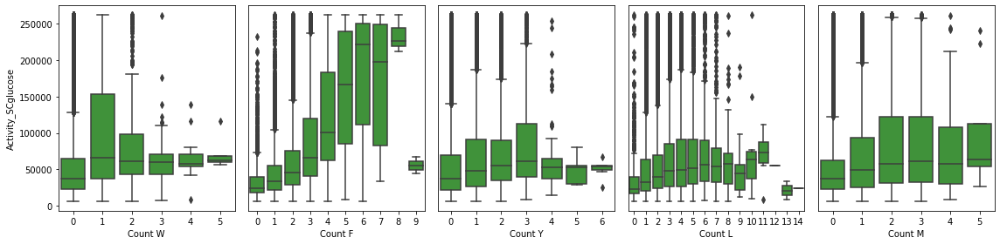

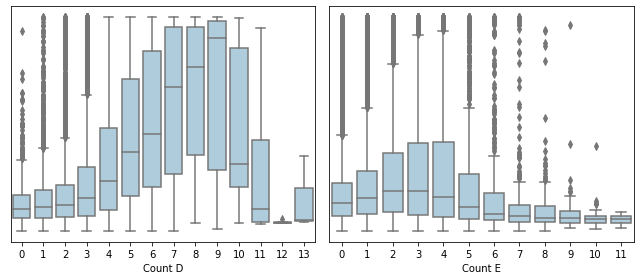

In [19]:
Runthiscell = True
if Runthiscell:
    tempDF = masterDF[masterDF.Recovered]
    fig,axes  = plt.subplots( figsize=(6,4))
    sns.boxplot(x='Charge',y=Activity,data=tempDF,color=lightblue)
    plt.xticks([0,4,8,12,16,20,24,28],[-16,-12,-8,-4,0,4,8,12])
    plt.xlabel('Net Charge')
    plt.tight_layout()
    plt.savefig('Figures/Boxplot_Charge.pdf')

    fig,axes  = plt.subplots( figsize=(4,4))
    tempDF = masterDF[masterDF.Recovered]
    sns.boxplot(x='WFYL',y=Activity,data=tempDF,color=lightgreen)
    plt.xlabel('Count W,F,Y,L')
    plt.yticks([]),plt.ylabel('')
    plt.tight_layout()
    plt.savefig('Figures/Boxplot_WFYL.pdf')
    fig,axes  = plt.subplots( figsize=(4,4))
    sns.boxplot(x='Aromatics',y=Activity,data=tempDF,color=darkgreen)
    plt.xlabel('Count W,F,Y')
    plt.yticks([]),plt.ylabel('')
    plt.tight_layout()
    plt.savefig('Figures/Boxplot_Aromatics.pdf')

    PropertySet=[ 'W','F','Y','L','M']
    fig,axes  = plt.subplots( figsize=(16,4))
    for i, prop in enumerate(PropertySet):
        plt.subplot(1,5,1+i)
        sns.boxplot(x=prop,y=Activity,data=tempDF,color = darkgreen)
        plt.xlabel(labelDict[prop])
        if i >0:
            plt.yticks([]),plt.ylabel('')
    plt.tight_layout()
    plt.savefig('Figures/Boxplot_Hydroset_2.pdf')
    plt.show()

    PropertySet=['D','E']
    fig,axes  = plt.subplots( figsize=(9,4))
    for i, prop in enumerate(PropertySet):
        plt.subplot(1,2,1+i)
        sns.boxplot(x=prop,y=Activity,data=tempDF,color = lightblue)
        plt.xlabel(labelDict[prop])
    #     if i >0:
        plt.yticks([]),plt.ylabel('')
    plt.tight_layout()
    plt.savefig('Figures/Boxplot_ChargeSet.pdf')
    plt.show()

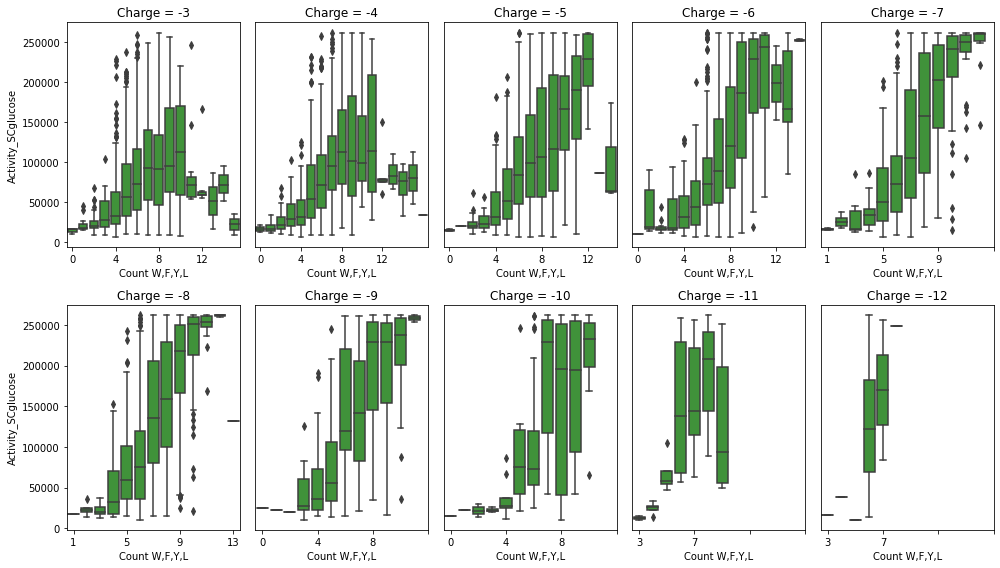

In [29]:
Runthiscell = True
if Runthiscell:
    fig,axes  = plt.subplots( figsize=(14,8))
    prop = 'WFYL'
    for i, charge in enumerate([-3,-4,-5,-6,-7,-8,-9,-10,-11,-12]):
        plt.subplot(2,5,1+i)
        indx = masterDF.Recovered &(masterDF.Charge==charge)
        tempDF = masterDF[indx]
        sns.boxplot(x=prop,y=Activity,data=tempDF,color = darkgreen)
        plt.xlabel(labelDict[prop])
        plt.title('Charge = %i'%charge)
        plt.xticks([0,4,8,12])
        if not((i ==0) or(i==5)):
            plt.yticks([]),plt.ylabel('')

    plt.tight_layout()
    plt.savefig('Figures/Boxplot_Hydroset_atChargelevels.pdf')
    plt.show()


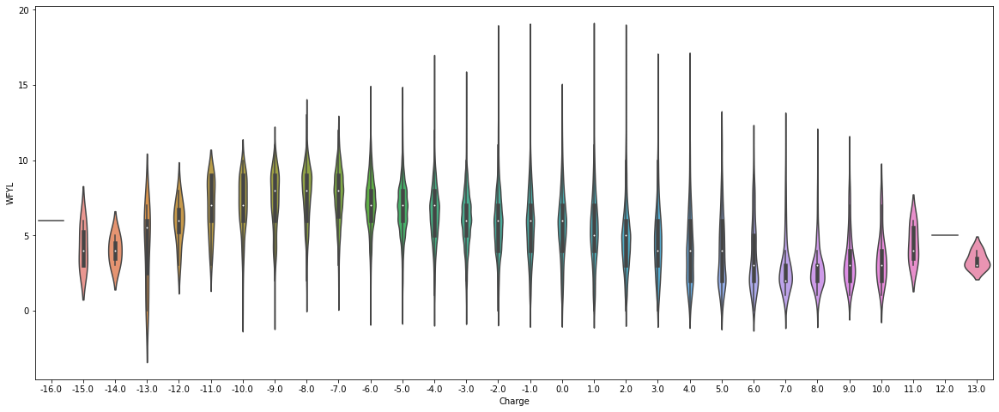

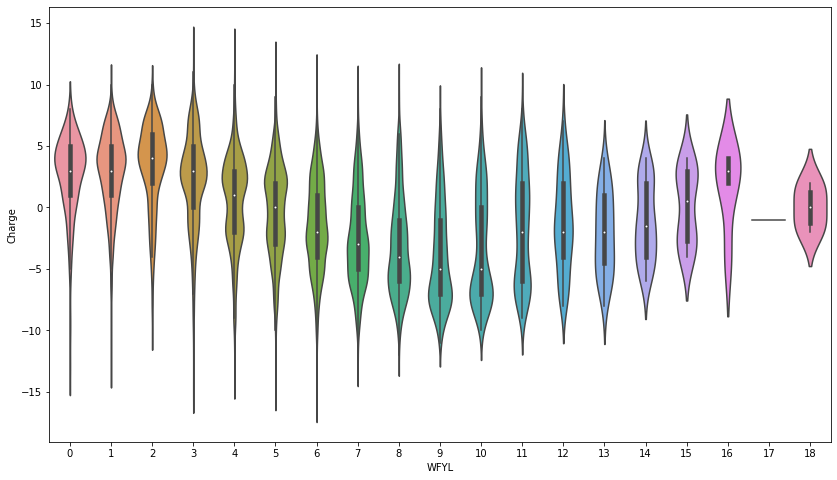

In [30]:
Runthiscell = True
if Runthiscell:
    fig = plt.figure(figsize=(20,8))
    # sns.violinplot(x='WFYL',y='Charge',data=masterDF)
    sns.violinplot(y='WFYL',x='Charge',data=masterDF)
    plt.savefig('Figures/WLYL_Charge_Violin_2.pdf')

    plt.show()
    fig = plt.figure(figsize=(14,8))
    sns.violinplot(x='WFYL',y='Charge',data=masterDF)
    plt.savefig('Figures/WLYL_Charge_Violin.pdf')

    plt.show()

In [31]:
Runthiscell = False
if Runthiscell:
    #Sparrow analysis
    import sparrow
    tempRGs, tempEnd2EndDist, temp_scaling_exponent,temp_asphericity = [],[],[],[]
    for i, line in masterDF.iterrows():
        P = sparrow.Protein(line.ADseq)
        tempRGs.append(P.predictor.radius_of_gyration())
        tempEnd2EndDist.append(P.predictor.end_to_end_distance(use_scaled=False))
        temp_scaling_exponent.append(P.predictor.scaling_exponent())
        temp_asphericity.append(P.predictor.asphericity())

    masterDF['Spacer_Rg'] = tempRGs
    masterDF['Spacer_End2EndDist'] = tempEnd2EndDist
    masterDF['Spacer_ScalingExp'] = temp_scaling_exponent
    masterDF['Spacer_asphericity'] = temp_asphericity

    nBins = 50
    plt.subplot(2,2,1)
    plt.hist(masterDF.Spacer_Rg,nBins)
    plt.xlabel('Tile radius of gyration')
    plt.subplot(2,2,2)
    plt.hist(masterDF.Spacer_End2EndDist,nBins)
    plt.xlabel('Tile end to end distance')
    plt.subplot(2,2,3)
    plt.hist(masterDF.Spacer_ScalingExp,nBins)
    plt.xlabel('Tile ScalingExp')
    plt.subplot(2,2,4)
    plt.hist(masterDF.Spacer_asphericity,nBins)
    plt.xlabel('Tile asphericity')
    plt.tight_layout()
    plt.show()

# 2D plots

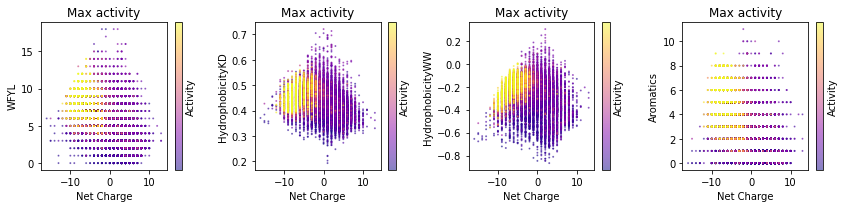

In [32]:
masterDF['WFYLM']=masterDF.WFYL+ masterDF.M
PropertySets =[['Charge','WFYL'],['Charge','HydrophobicityKD'],['Charge','HydrophobicityWW'],['Charge','Aromatics']]


def plot2ProperitesColorBar(PropertySets):
    
    fig,axes  = plt.subplots( figsize=(12,3))

    # data subset
    indx = masterDF.Recovered
    tempDF = masterDF[indx]
    tempDF=tempDF.sort_values(by=Activity,ascending=True)

    for i, propset in enumerate(PropertySets):
        plt.subplot(1,4,i+1)
        plt.xlabel(labelDict[propset[0]]),plt.ylabel(propset[1])
    
        x= tempDF[propset[0]]
        y= tempDF[propset[1]]
        sc = plt.scatter(x,y,c=tempDF[Activity],s=1,cmap='plasma',label='',alpha=0.5)
        # make color bar same for all plots
        cbar = plt.colorbar(sc,shrink=1, aspect=20,label= 'Activity',ticks=[-1.5,0,1.5])
        plt.title('Max activity')
#         cbar.set_clim(minActivity,maxActivity)
        #plot WT
#         for j,ad in enumerate(ADlist):      
#             tempWTDF = WTDF[WTDF[ad]]
#             plt.scatter(tempWTDF[propset[0]],tempWTDF[propset[1]],c=ADcolorDict[ad],marker='+',
#                         s=100,label=TitleDict[ad],alpha=1)

#     plt.legend(fontsize=7)
    plt.tight_layout()
    plt.savefig('Figures/PaperFigs/Supp/HydrophobicityTables_2Dplot_maxActivity_v2.pdf')
plot2ProperitesColorBar(PropertySets)
    

    


In [33]:
# # "unusual" high activity sequences
# cols = ['Name','ADseq',Activity,'L','SCglucose_TotalReads']
# indx = (masterDF[Activity]>100000)&(masterDF.Aromatics==0)
# tempDF = masterDF[indx]
# print ('No aromatics')
# (tempDF[cols])
# for i,aa in enumerate(['A','V','L','I','M','G','S']):
#     plt.subplot(4,4,i+1)
#     plt.hist(tempDF[aa])
#     plt.xlabel(aa)
# plt.show()

# exportfilename = 'ExportedSeqLists/HighActivity_NoAromatics_100K.fasta'
# tempDict = dict(zip(tempDF.Name,tempDF.ADseq))
# protfasta.write_fasta(tempDict,exportfilename)
# tempDF.shape

,HydrophobicityKD,HydrophobicityWW,Activity_SCglucose
HydrophobicityKD,1.000000,0.688099,0.338270
HydrophobicityWW,0.688099,1.000000,0.349775
Activity_SCglucose,0.338270,0.349775,1.000000


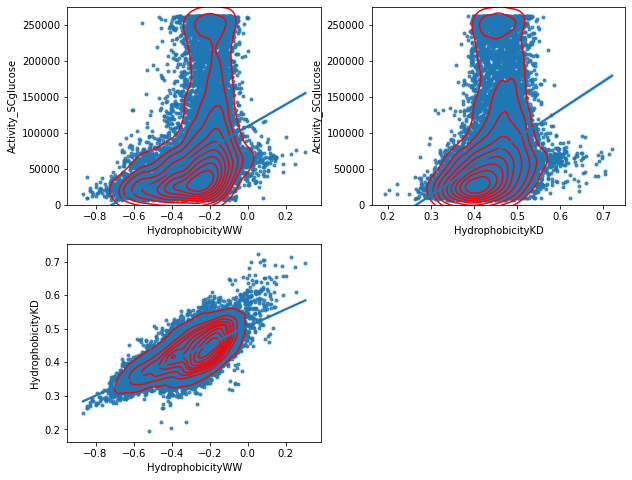

In [34]:
indx = masterDF.Recovered
tempDF = masterDF[indx]
fig,axes  = plt.subplots( figsize=(10,8))
plt.subplot(2,2,1)
sns.regplot(x='HydrophobicityWW',y=Activity,data=tempDF,marker='.')
sns.kdeplot(x='HydrophobicityWW',y=Activity,data=tempDF,color='red')
plt.ylim(0,maxActivity*1.05)

plt.subplot(2,2,2)
sns.regplot(x='HydrophobicityKD',y=Activity,data=tempDF,marker='.')
sns.kdeplot(x='HydrophobicityKD',y=Activity,data=tempDF,color='red')
plt.ylim(0,maxActivity*1.05)

plt.subplot(2,2,3)
sns.regplot(x='HydrophobicityWW',y='HydrophobicityKD',data=tempDF,marker='.')
sns.kdeplot(x='HydrophobicityWW',y='HydrophobicityKD',data=tempDF,color='red')
plt.savefig('Figures/Sx_Corr_hydrophobicity_Activity')
# # masterDF.HydrophobicityKD
tempDF = tempDF[['HydrophobicityKD','HydrophobicityWW',Activity]]
tempDF.corr()

In [35]:
def plot2ProperitesSpacePoints_blocks(CurrentDF,PropertySet):
    fig = plt.figure(figsize=(18,14))
    
    SortedDF=CurrentDF.sort_values(by=Activity,ascending=True)
    minXprop, maxXprop = min(SortedDF[PropertySet[0]]),max(SortedDF[PropertySet[0]])
    minYprop, maxYprop = min(SortedDF[PropertySet[1]]),max(SortedDF[PropertySet[1]])
    minXprop, maxXprop = min(SortedDF[PropertySet[0]]),-5
    minYprop, maxYprop = 5,max(SortedDF[PropertySet[1]])

    Xs,Ys,activities,medians,medX,medY = [],[],[],[],[],[]
    print( '%i %i %i %i' %(minXprop, maxXprop,    minYprop, maxYprop))
    counts = []
    for i in  np.arange(maxXprop+1,minXprop,-1):
        for j in np.arange(minYprop,maxYprop+1,1):
            indx = (SortedDF[PropertySet[0]]==i)&((SortedDF[PropertySet[1]]==j))
            if sum(indx)>0:
                counts.append(sum(indx))
                tempDF = SortedDF[indx]
                if sum(indx)==1:
                    Xs.append(tempDF[PropertySet[0]])
                    Ys.append(tempDF[PropertySet[1]])
                    activities.append(tempDF[Activity])
                    medians.append(np.median(tempDF[Activity]))
                    medX.append(tempDF[PropertySet[0]])
                    medY.append(tempDF[PropertySet[1]])
                else:
                    currentlen = np.ceil(np.sqrt(sum(indx)))
                    tempint = 0
                    spacer = 0.05
                    center =(0.5*spacer*(currentlen-1))
                    medians.append(np.median(tempDF[Activity]))
                    medX.append(np.median(tempDF[PropertySet[0]]))
                    medY.append(np.median(tempDF[PropertySet[1]]))
                    for k, row in tempDF.iterrows():
                        xjitter = spacer*(tempint%currentlen)-center
                        yjitter=  spacer*np.floor(tempint/currentlen)-center #use this line for a square grid
#                         yjitter=  spacer*(tempint/currentlen)-(0.4*spacer*currentlen) #use this line for a diagonal grid
                        Xs.append(i+xjitter)
                        Ys.append(j+yjitter)
                        activities.append(row[Activity])
                        tempint+=1
    print( max(counts))
    plt.scatter(Xs,Ys,c=activities,s=4,cmap='plasma',marker='s',vmin=minActivity, vmax=maxActivity)
    cbar =plt.colorbar()
    cbar.set_label('Activity')
    plt.xlabel(labelDict[PropertySet[0]]),plt.ylabel(labelDict[PropertySet[1]])
    plt.yticks([5,10])
    #plot WT
#     plotWT()
    plt.savefig('Figures/New2dplot_wgrid_zoom2.pdf')
    plt.show()
    
    #medians
    fig = plt.figure(figsize=(7.6,3.5))
    plt.scatter(medX,medY,c=medians,s=70,cmap='plasma',marker='s',vmin=minActivity, vmax=maxActivity)
    plt.xlabel(labelDict[PropertySet[0]]),plt.ylabel(labelDict[PropertySet[1]])
    #plot WT
    cbar =plt.colorbar()
    cbar.set_label('Activity')
#     cbar.set_clim(minActivity,maxActivity)
#     plotWT()
    plt.legend(frameon=False,fontsize=8)
    plt.savefig('Figures/New2dplot_Medians.pdf')
    plt.show()
# tempADlist = ADlist[:3]
# indx = np.zeros_like(masterDF[Activity])
# for ad in tempADlist:
#     indx = indx + (masterDF[ad]==True)
# indx = indx >0
# CurrentDF = masterDF[indx]
# plot2ProperitesSpacePoints_blocks(masterDF[masterDF.Recovered],PropertySets[0])    

-16 13 0 18


No handles with labels found to put in legend.


1
353


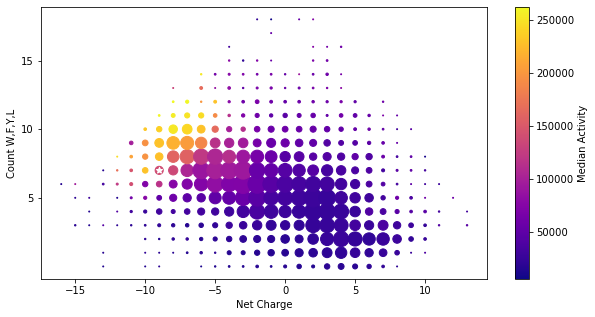

-16 13 0 18


No handles with labels found to put in legend.


1
353


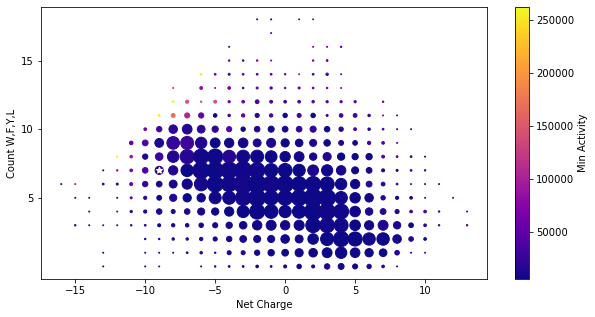

-16 13 0 18


No handles with labels found to put in legend.


1
353


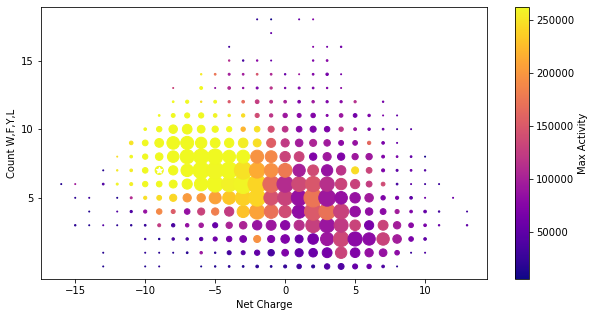

-16 13 0 18


No handles with labels found to put in legend.


1
353


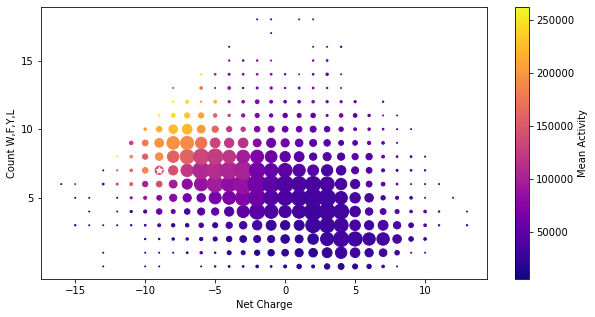

In [95]:
# Plot 2 properties and change the marker size to match the number of variants at each position. 
# Color is median, min or max activity
def plotWT(PropertySet):
    X = ScerWT_DF[PropertySet[0]]
    Y = ScerWT_DF[PropertySet[1]]
    plt.scatter(X,Y,c='w',marker='*')
    
def plot2ProperitesSpacePoints(CurrentDF,PropertySet,DotColor='Median'):
    fig = plt.figure(figsize=(10,5))
    
    SortedDF=CurrentDF.sort_values(by=Activity,ascending=True)
    minXprop, maxXprop = min(SortedDF[PropertySet[0]]),max(SortedDF[PropertySet[0]])
    minYprop, maxYprop = min(SortedDF[PropertySet[1]]),max(SortedDF[PropertySet[1]])
    
    Xs,Ys,activities,Dotcolors,medX,medY = [],[],[],[],[],[]
    print( '%i %i %i %i' %(minXprop, maxXprop,    minYprop, maxYprop))
    counts,markersizes = [],[]
    #systematically step through the grid of property space.
    for i in  np.arange(minXprop,maxXprop+1,1):
        for j in np.arange(minYprop,maxYprop+1,1):
            indx = (SortedDF[PropertySet[0]]==i)&((SortedDF[PropertySet[1]]==j))
            if sum(indx)>0:
                counts.append(sum(indx))
#                 markersizes.append(np.sqrt(sum(indx))*5)
                markersizes.append((sum(indx)))

                tempDF = SortedDF[indx]
                # make lists for plotting
                Xs.append(i) 
                Ys.append(j)
                activities.append(tempDF[Activity])
                if DotColor=='Median':
                    Dotcolors.append(np.median(tempDF[Activity])) #hold medians for plotting.
                elif DotColor=='Min':
                    Dotcolors.append(np.min(tempDF[Activity])) #hold medians for plotting.
                elif DotColor=='Max':
                    Dotcolors.append(np.max(tempDF[Activity])) #hold medians for plotting.
                elif DotColor=='Mean':
                    Dotcolors.append(np.mean(tempDF[Activity])) #hold medians for plotting.    
                

    print(min(markersizes))
    print( max(markersizes))
    plt.scatter(Xs,Ys,c=Dotcolors,s=markersizes,cmap='plasma',marker='o',vmin=minActivity, vmax=maxActivity) # marker size represents #of points
#     plt.scatter(medX,medY,c=medians,s=70,cmap='plasma',marker='s')# constant marker size.
    cbar =plt.colorbar()
    cbar.set_label(DotColor+' Activity')
    plt.xlabel(labelDict[PropertySet[0]]),plt.ylabel(labelDict[PropertySet[1]])
    plt.yticks([5,10,15])  

    plotWT(PropertySet)
    plt.legend(frameon=False,fontsize=8)
    plt.savefig('Figures/PaperFigs/New2dplot_'+DotColor+'_'+labelDict[PropertySet[1]]+'.pdf')
    plt.show()

PropertySets =[['Charge','WFYL'],['Charge','WFYLM'],['Charge','WFL'],['Charge','Aromatics']]
   
plot2ProperitesSpacePoints(masterDF[masterDF.Recovered],PropertySets[0],DotColor='Median')
plot2ProperitesSpacePoints(masterDF[masterDF.Recovered],PropertySets[0],DotColor='Min')
plot2ProperitesSpacePoints(masterDF[masterDF.Recovered],PropertySets[0],DotColor='Max')        
plot2ProperitesSpacePoints(masterDF[masterDF.Recovered],PropertySets[0],DotColor='Mean')        



# plot2ProperitesSpacePoints(masterDF[masterDF.Recovered],PropertySets[1])    
# plot2ProperitesSpacePoints(masterDF[masterDF.Recovered],PropertySets[2])    
# plot2ProperitesSpacePoints(masterDF[masterDF.Recovered],PropertySets[3])    
# plot2ProperitesSpacePoints(masterDF[masterDF.Recovered],PropertySets[4])    






In [37]:
Runthiscell = False
if Runthiscell:
    
    plot2ProperitesSpacePoints(masterDF[masterDF.Recovered],['Charge','Aromatics'],DotColor='Median')
    plot2ProperitesSpacePoints(masterDF[masterDF.Recovered],['D','Aromatics'],DotColor='Median')



    plot2ProperitesSpacePoints(masterDF[masterDF.Recovered],['Charge','WF'],DotColor='Median')
    # plot2ProperitesSpacePoints(masterDF[masterDF.Recovered],['D','WF'],DotColor='Median')




In [38]:
Runthiscell = False
if Runthiscell:
    indx = masterDF[Activity]>ActivityThresh
    tempDF = masterDF[indx]
    plot2ProperitesSpacePoints(tempDF,['Charge','WF'])        



In [39]:
# check if adding phos sites helps with AD predictions.

Runthiscell = False
if Runthiscell:
    Phoscharge =[]
    for line in masterDF.ADseq: # This analysis includes the leading 'M' from the start codon
        seq =  SequenceParameters(line)
        a = seq.get_all_phosphorylatable_sites()
        seq.set_phosphosites(a)
        Phosseq = seq.get_phosphosequence()
        seq2 =  SequenceParameters(Phosseq)
        Phoscharge.append(seq2.get_NCPR()*len(seq2))
    masterDF['Charge_Phosphorylated']=Phoscharge
    Phoscharge =[]
    for line in ScerWT_DF.ADseq: # This analysis includes the leading 'M' from the start codon
        seq =  SequenceParameters(line)
        a = seq.get_all_phosphorylatable_sites()
        seq.set_phosphosites(a)
        print(line)
        Phosseq = seq.get_phosphosequence()
        print(seq.get_phosphosequence())
        seq2 =  SequenceParameters(Phosseq)
        Phoscharge.append(seq2.get_NCPR()*len(seq2))
    ScerWT_DF['Charge_Phosphorylated']=Phoscharge
    ScerWT_DF[['Charge','Charge_Phosphorylated']]

In [40]:
# plot2ProperitesSpacePoints(masterDF[masterDF.Recovered],['Charge_Phosphorylated','WF'],DotColor='Median')
# plot2ProperitesSpacePoints(masterDF[masterDF.Recovered],['Charge_Phosphorylated','WFYL'],DotColor='Median')
# plot2ProperitesSpacePoints(masterDF[masterDF.Recovered],['Charge','WFYL'],DotColor='Median')

In [41]:
# plot2ProperitesSpacePoints(masterDF[masterDF.Recovered],['P','WFYL'],DotColor='Median')
# plot2ProperitesSpacePoints(masterDF[masterDF.Recovered],['S','WFYL'],DotColor='Median')
# plot2ProperitesSpacePoints(masterDF[masterDF.Recovered],['Disorder','WFYL'],DotColor='Median')
# masterDF.plot.hist('Disorder')

In [42]:
# masterDF.plot.hist('Disorder')

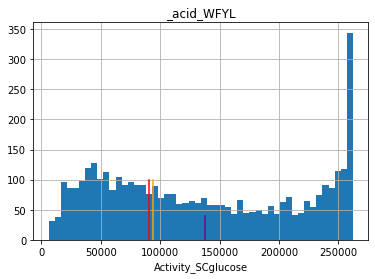

3951 tiles in this set
2402 active ADs
60.79 percent of tiles are active 
2453 strong ADs
62.09 percent of tiles are highly active


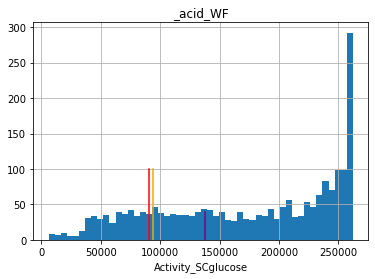

2157 tiles in this set
1721 active ADs
79.79 percent of tiles are active 
1744 strong ADs
80.85 percent of tiles are highly active


In [43]:
def plotActivityHist2(tempDF,name=''):
    pd.DataFrame.hist(data=tempDF, column=Activity,bins=50)
    plt.plot([ActivityThresh,ActivityThresh],[0,100],c='orange')
    plt.plot([ScerWTactivity,ScerWTactivity],[0,40],c='purple')
    plt.plot([HighActivityThresh,HighActivityThresh],[0,100],c='red')
    plt.xlabel(Activity),plt.title(name)
    plt.savefig('Figures/PaperFigs/ActivityHistv4%s.pdf'%name)
    plt.show()
    masterDF.columns
    print('%i tiles in this set'%len(tempDF))
    print('%i active ADs' %sum(tempDF[Activity]>ActivityThresh))
    print('%.2f percent of tiles are active ' %(100.0*sum(tempDF[Activity]>ActivityThresh)/len(tempDF)))
    print('%i strong ADs' %sum(tempDF[Activity]>HighActivityThresh))
    print('%.2f percent of tiles are highly active' %(100.0*sum(tempDF[Activity]>HighActivityThresh)/len(tempDF)))
plotActivityHist2(AcidBlobs_WFYL,'_acid_WFYL')
plotActivityHist2(AcidBlobs_WF,'_acid_WF')

There are 3860 sequences with the composition features of high activity(W+F >=2 and Charge<-4)
2388 have high activity
1472 have low activity

3790 Tiles have high activity in full dataset


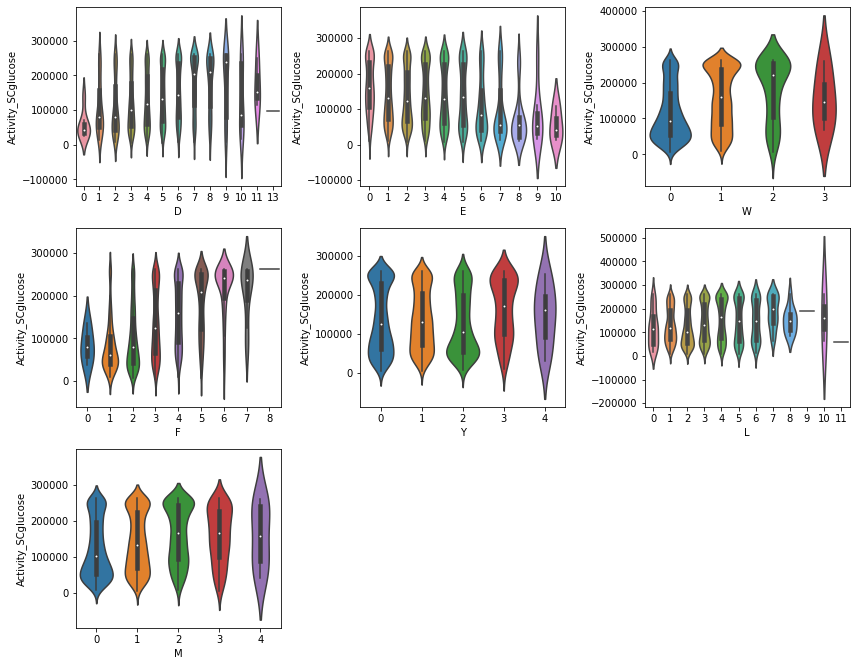

There are 3234 sequences with the composition features of high activity(W+F >=3 and Charge<-4)
2228 have high activity
1006 have low activity

3790 Tiles have high activity in full dataset


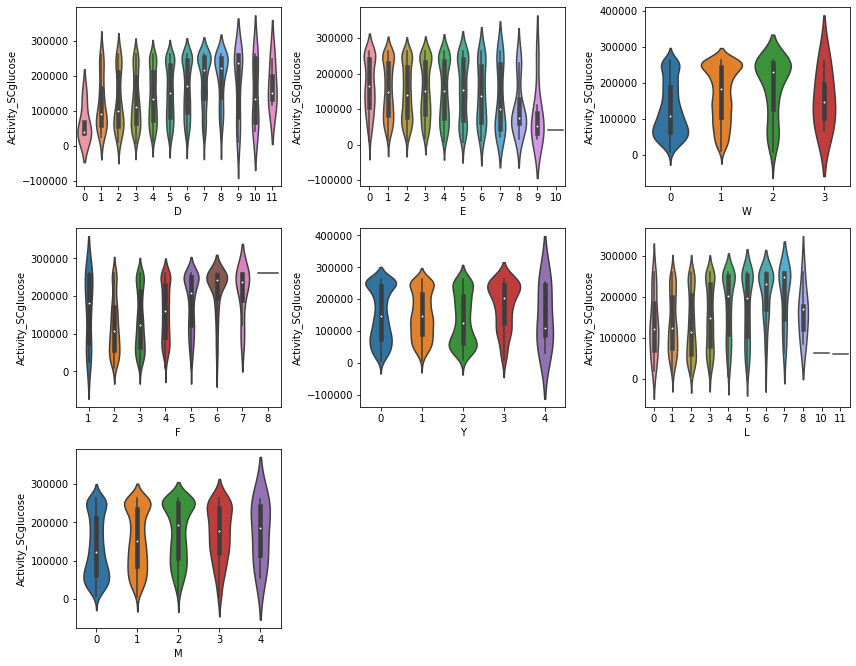

There are 2157 sequences with the composition features of high activity(W+F >=4 and Charge<-4)
1721 have high activity
436 have low activity

3790 Tiles have high activity in full dataset


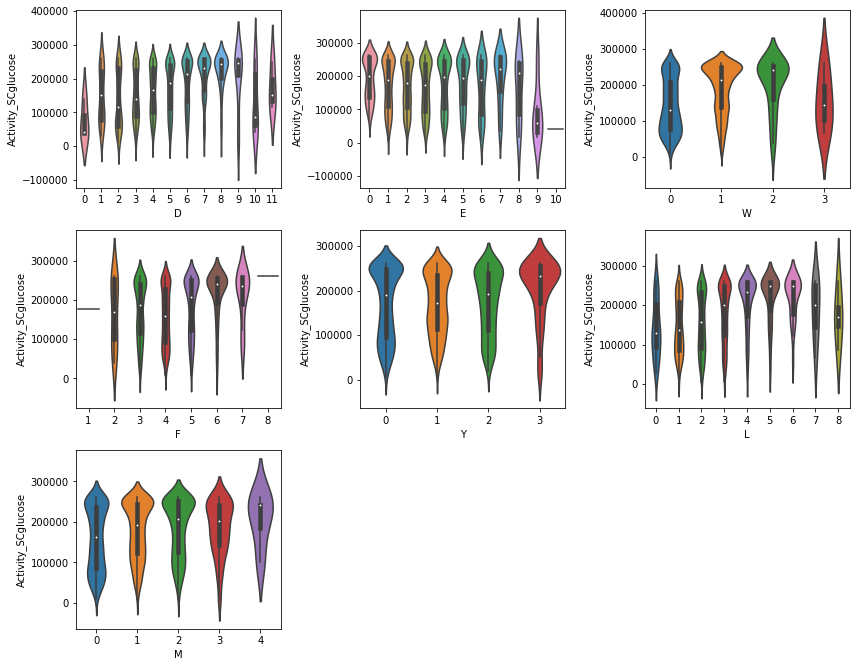

In [44]:
# high WF and high acidity
for WFthresh in [2,3,4]:
    masterDF['WF'] = masterDF.F +masterDF.W
    indx = masterDF.Recovered & (masterDF.WF >=WFthresh)&(masterDF.Charge<chargethresh)
    AcidBlobs_WFtemp = masterDF[indx]
    print('There are %i sequences with the composition features of high activity(W+F >=%i and Charge<%i)'%(sum(indx),WFthresh,chargethresh))
    print('%i have high activity'%sum(indx&(masterDF[Activity]>ActivityThresh)))
    print('%i have low activity'%sum(indx&(masterDF[Activity]<ActivityThresh)))

    #total number of high activity seqs in the dataset
    print('\n%i Tiles have high activity in full dataset'%sum(masterDF[Activity]>ActivityThresh))

    PropertySet=[ 'Aromatics','WFYL','D','E','W','F','Y','L','M','S','T','P']
    PropertySet=[ 'D','E','W','F','Y','L','M','P','K','R','G','S','T','Q','N','C']
    TempAASet=[ 'D','E','W','F','Y','L','M']
    def CheckAAs(tempDF,PropertySet):
        fig,axes  = plt.subplots( figsize=(12,12))
        for i, prop in enumerate(PropertySet):
            plt.subplot(int(np.ceil(np.sqrt(len(PropertySet)))+1),int(np.ceil(np.sqrt(len(PropertySet)))),1+i)
            if len(tempDF)>100:
                sns.violinplot(x=prop,y=Activity,data=tempDF)
            else:
                sns.boxplot(x=prop,y=Activity,data=tempDF)
                sns.stripplot(x=prop,y=Activity,data=tempDF)
        plt.tight_layout()
    CheckAAs(AcidBlobs_WFtemp,TempAASet)
    plt.savefig('Figures/ZoomChargeWFCorner_composition_%iWF.pdf'%WFthresh)
    plt.show()

In [45]:
# export seqs for legacy Kmer analysis
sortedDF = AcidBlobs_WFYL.sort_values(by=Activity,ascending=False)
outputseqs = sortedDF['ADseq'][:200]
outputfilename = 'ExportedSeqLists/KmerAnalysis/Acid_WFYL_200top.txt'
target = open(outputfilename,'w')
for seq in outputseqs:
    target.write(seq)
    target.write('\n')
target.close()
sortedDF = AcidBlobs_WFYL.sort_values(by=Activity,ascending=True)
outputseqs = sortedDF['ADseq'][:200]
outputfilename = 'ExportedSeqLists/KmerAnalysis/Acid_WFYL_200bottom.txt'
target = open(outputfilename,'w')
for seq in outputseqs:
    target.write(seq)
    target.write('\n')
target.close()
outputfilename = 'ExportedSeqLists/KmerAnalysis/Acid_WFYL_Fullset_Background.txt'
target = open(outputfilename,'w')
outputseqs = sortedDF['ADseq']
for seq in outputseqs:
    target.write(seq)
    target.write('\n')
target.close()

In [46]:
#export sequences for Simulations
AcidBlobs_WFYL


N = 100

tempDF = AcidBlobs_WFYL
tempDF =tempDF.sort_values(by=Activity,ascending=True,ignore_index=True)
bot =tempDF.loc[0:N-1,:] 
tempDF =tempDF.sort_values(by=Activity,ascending=False,ignore_index=True)
top =tempDF.loc[0:N-1,:]
exportfilename = 'ExportedSeqLists/ForSims/New_AcidBlobs_WFYL_bottom%i.fasta'%N
tempDict = dict(zip(bot.Name,bot.ADseq))
protfasta.write_fasta(tempDict,exportfilename)
exportfilename = 'ExportedSeqLists/ForSims/New_AcidBlobs_WFYL_top%i.fasta'%N
tempDict = dict(zip(top.Name,top.ADseq))
protfasta.write_fasta(tempDict,exportfilename)


There are 17057 tiles without the WxxLF motif


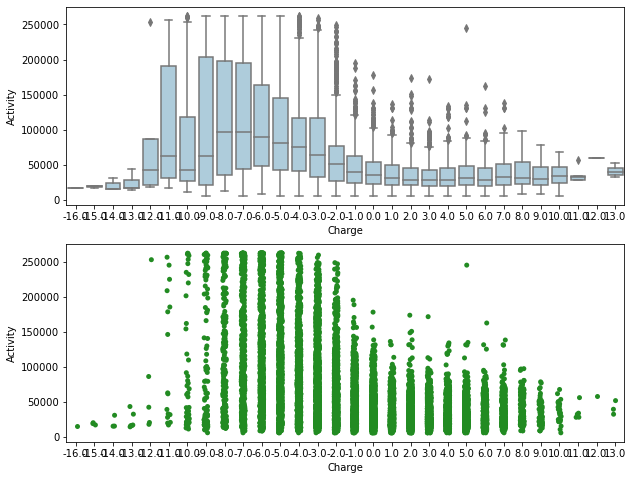

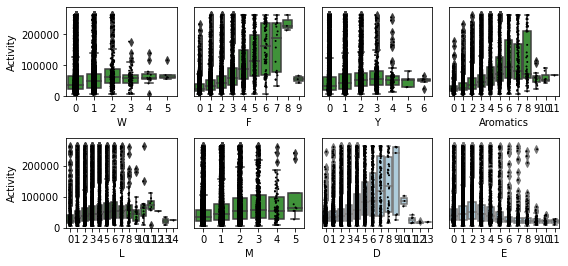

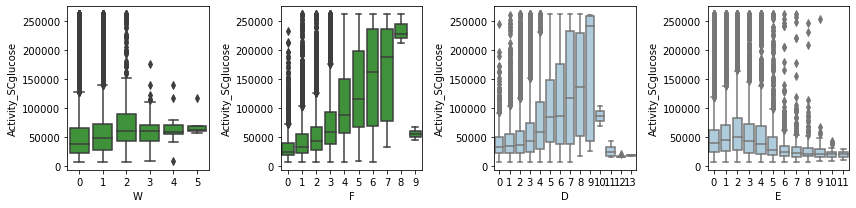

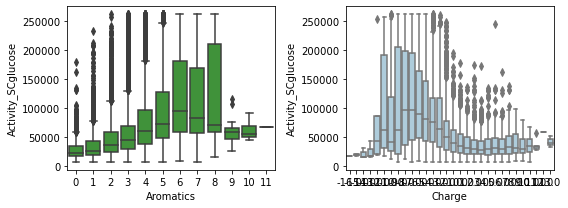

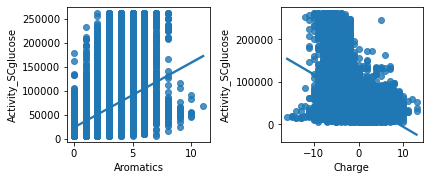

There are 1890 tiles with the WxxLF motif


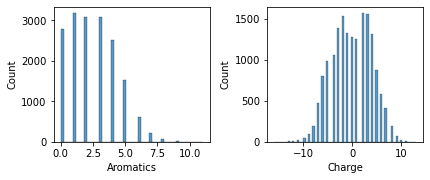

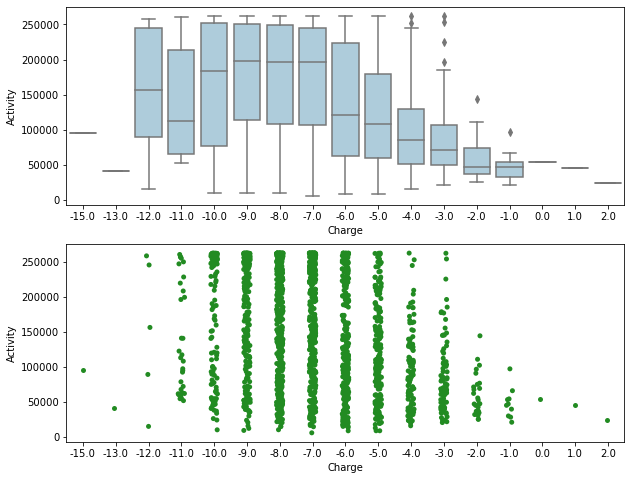

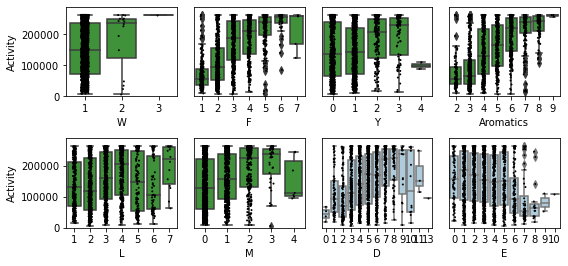

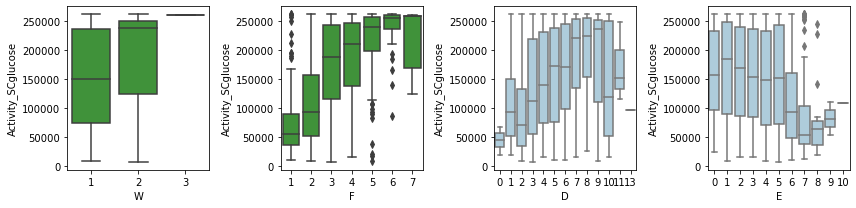

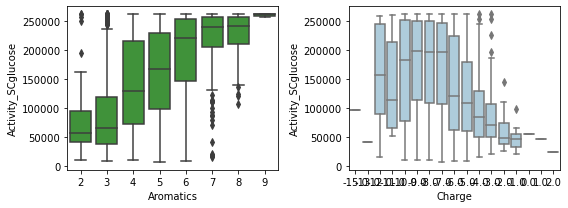

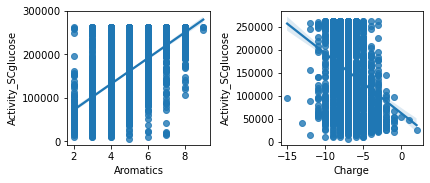

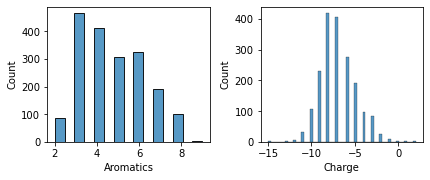

In [47]:
#Replot data based on Ryan Freidman question June 24
indx = masterDF.Recovered &(masterDF['W..LF']==0)
tempDF = masterDF[indx]
print('There are %i tiles without the WxxLF motif'%sum(indx))
checkPropertyRelationships(tempDF,Exportplot=True,ExplortPlotName='NoWxxLFMotif')




indx = masterDF.Recovered &(masterDF['W..LF']==1)
tempDF = masterDF[indx]
print('There are %i tiles with the WxxLF motif'%sum(indx))
checkPropertyRelationships(tempDF)


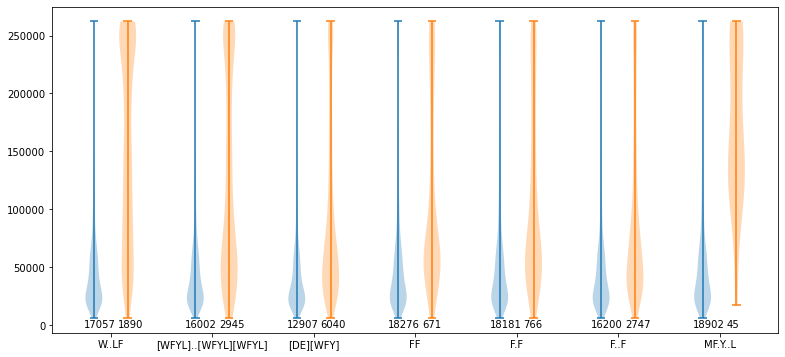

In [113]:
# violin plots for motif counts. 
labels,Xs,X2s,Ys,Y2s,labellocations,Ns,Npos = [],[],[],[],[],[],[],[]
X =1
fig = plt.figure(figsize=(13,6))
for motif in motiflist_publication:
    indx = masterDF.Recovered &(masterDF[motif]==0)
    withoutMotif = masterDF[indx]
    Ns.append(sum(indx))
    indx = masterDF.Recovered &(masterDF[motif]>0)
    withMotif = masterDF[indx]
    Ns.append(sum(indx))
    label1 = motif
    labels.append(label1)
    labellocations.append(X+.5)
    Ys.append(withoutMotif[Activity].values)
    Xs.append(X)
    Npos.append(X)
    Y2s.append(withMotif[Activity].values)
    X2s.append(X+1)
    Npos.append(X+1)
    X+=3

plt.violinplot(Ys,Xs)
plt.violinplot(Y2s,X2s)
plt.xticks(labellocations,labels=labels)
for i,x in enumerate(Npos):
    plt.text(x-.3,-2000,Ns[i])
plt.savefig('Figures/PaperFigs/MotifViolinPlot.pdf')
plt.show()
# plt.xlabels()
#         tempcol = []
#         for seq in currentDF[column]:
#             hits = re.search(motif,seq)
#             if hits:
#                 matches = re.findall(motif,seq)
#                 tempcol.append(len(matches))
#             else:
#                 tempcol.append(0)

In [54]:
# Tiles with many H's
indx = (masterDF['W..LF'] ==1 ) & (masterDF.H>2)
tempDF = masterDF[indx]
tempDF.Name[3992]
# names =['Blastocladiomycota_jgi|Catan2|1506241|gm1.11555_g_86','Blastocladiomycota_jgi|Catan2|1466814|fgenesh1_pg.199_#_9']
# for name in names:
#     tempDF = masterDF[masterDF.Name==name]
#    print()
# tempDF.Name[4071]
tempDF[['Name','ADseq',Activity]]

,Name,ADseq,Activity_SCglucose
2786,Saccharomycotina_jgi|Babin1|9317|gm1.4150_g_141,MFGDFSFMHESVESDDKHWNSLFKEERTSSVAAMEPPVHV,157830.659811
2787,Saccharomycotina_jgi|Babin1|9317|gm1.4150_g_146,SFMHESVESDDKHWNSLFKEERTSSVAAMEPPVHVKLETI,32175.611208
3988,Blastocladiomycota_jgi|Catan2|1506241|gm1.1155...,HLNVASSPPPASIATPSPPLAAAQHVPAADGQWLALFPHP,47202.558155
3991,Blastocladiomycota_jgi|Catan2|1506241|gm1.1155...,PSPPLAAAQHVPAADGQWLALFPHPSSIDFDFNSFHQSFS,178576.542212
3992,Blastocladiomycota_jgi|Catan2|1506241|gm1.1155...,AAAQHVPAADGQWLALFPHPSSIDFDFNSFHQSFSSPPPH,145444.204209
3993,Blastocladiomycota_jgi|Catan2|1506241|gm1.1155...,VPAADGQWLALFPHPSSIDFDFNSFHQSFSSPPPHQPPTQ,144882.531735
3994,Blastocladiomycota_jgi|Catan2|1506241|gm1.1155...,GQWLALFPHPSSIDFDFNSFHQSFSSPPPHQPPTQLVAPP,144337.204523
4071,Blastocladiomycota_jgi|Catan2|1466814|fgenesh1...,EHLNVASSPPPASIATPSPPLAAAQHVPAADGQWLALFPH,47596.560138
4074,Blastocladiomycota_jgi|Catan2|1466814|fgenesh1...,TPSPPLAAAQHVPAADGQWLALFPHPSSIDFDFNSFHQSF,177361.381321
4075,Blastocladiomycota_jgi|Catan2|1466814|fgenesh1...,LAAAQHVPAADGQWLALFPHPSSIDFDFNSFHQSFSSPPP,145425.689126


In [120]:
sum(~np.isnan(masterDF.TotalReads_SCglucose))
temp = masterDF[masterDF.TotalReads_SCglucose>0]
sum(temp.TotalReads_SCglucose)

642653438.0

# Plot location of WxxLF motif (and others) in the tile

In [55]:
# align seqs where the WxxLF motif is at position 24
def FindMotifLocations(currentDF, motiflist,column='ADseq'):
    for motif in motiflist:
        tempcol= []
        for seq in currentDF[column]:
            hits = re.search(motif,seq)
            if hits:
                for m in re.finditer(motif,seq):
#                 Xs.append(m.start())
#                 Ys.append(row[Activity])
# #                 matches = re.findall(motif,seq)
                    tempcol.append((m.start()))
            else:
                tempcol.append('-1')
        currentDF[motif+'_loc']=tempcol
FindMotifLocations(masterDF,['W..LF'])
# plt.hist(masterDF['W..LF_loc'].values)

highThresh = 200000
for pos in range(20,30):
    indx =( masterDF['W..LF_loc'] == pos)&masterDF.Recovered &(masterDF[Activity]<ActivityThresh)
    tempDF = masterDF[indx]
    exportfilename = 'ExportedSeqLists/WxxLF_fixLocation/LowActivity_WxxLF_at_pos+%i.fasta'%pos
    tempDict = dict(zip(tempDF.Name,tempDF.ADseq))
    protfasta.write_fasta(tempDict,exportfilename)
for pos in range(20,30):
    indx =( masterDF['W..LF_loc'] == pos)&masterDF.Recovered
    tempDF = masterDF[indx]
    exportfilename = 'ExportedSeqLists/WxxLF_fixLocation/WxxLF_at_pos+%i.fasta'%pos
    print('Position %i n = %i'%(pos,len(tempDF)))
    tempDict = dict(zip(tempDF.Name,tempDF.ADseq))
    protfasta.write_fasta(tempDict,exportfilename)

Position 20 n = 47
Position 21 n = 51
Position 22 n = 46
Position 23 n = 51
Position 24 n = 60
Position 25 n = 45
Position 26 n = 55
Position 27 n = 44
Position 28 n = 57
Position 29 n = 61


In [56]:
# indx=((masterDF['[WFYL]..[WFYL][WFYL]']) -(masterDF['W..LF']))
# indx = indx 
 
# temp = masterDF[indx]
masterDF['ComparePhiMotif'] = (masterDF['[WFYL]..[WFYL][WFYL]']) -(masterDF['W..LF'])
# sum(masterDF['ComparePhiMotif'])
# # print(sum(masterDF['[WFYL]..[WFYL][WFYL]']))
# # sum(masterDF['[WFYL]..[WFYL][WFYL]']>0)
# max(masterDF['[WFYL]..[WFYL][WFYL]'])
# print(len(temp))
masterDF.shape


(20731, 82)

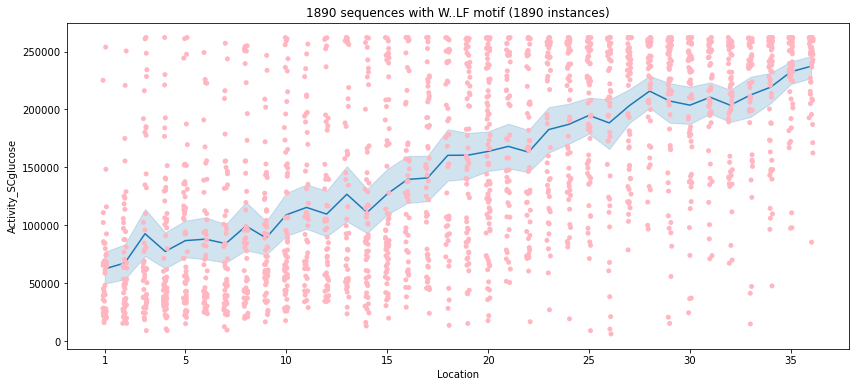

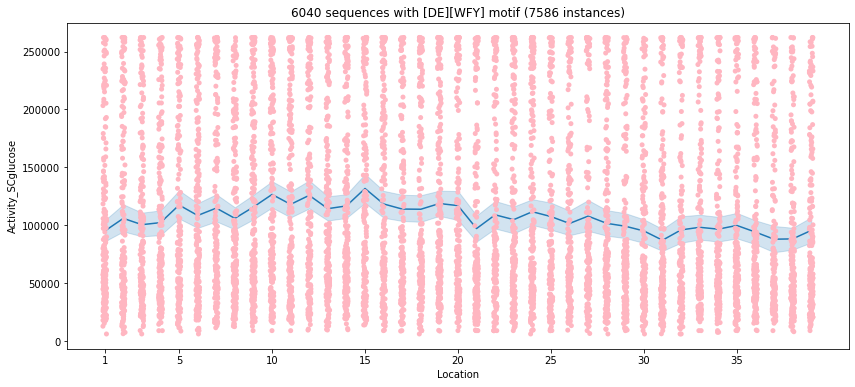

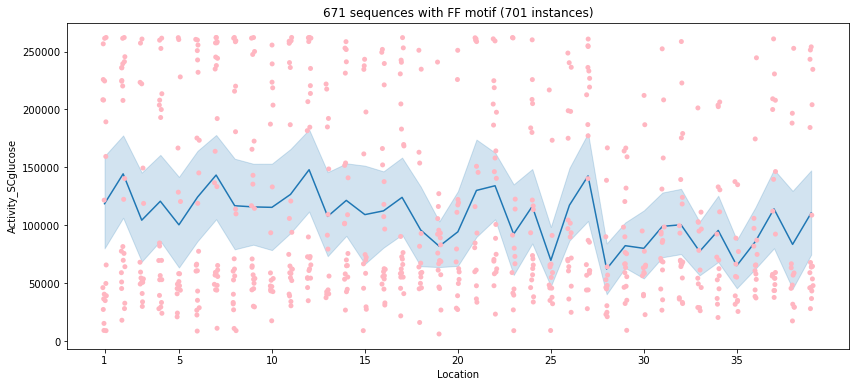

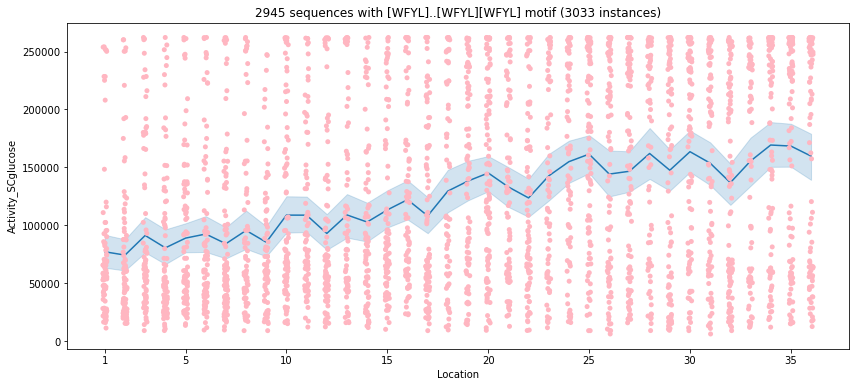

In [57]:

def plotMotifLocation(motif,DF,title='AllData',returnDF = False,returnNewtempDF=False):
    indx = (DF[motif]>0)#improved on 20220613 to count all instances of a motif, not just first instance
    tempDF = DF[indx]
    Xs =[]
    Ys =[]
    Seqs,Names=[],[]
    for i, row in tempDF.iterrows():
        print 
        match = re.search(motif,row.ADseq)
        if (match): #improved on 20220613 to count all instances of a motif, not just first instance
            for m in re.finditer(motif,row.ADseq):
                Xs.append(m.start())
                Ys.append(row[Activity])
                Seqs.append(row.ADseq)
                Names.append(row.Name)
    newColname = motif+'_location'
    newtempDF=pd.DataFrame({'Location':Xs,Activity:Ys,'ADseq':Seqs,'Name':Names})
    fig = plt.figure(figsize=(14,6))
#     sns.boxplot(x=newColname,y=Activity,data=tempDF)
    sns.stripplot(x='Location',y=Activity,data=newtempDF,color='lightpink')
    sns.lineplot(x='Location',y=Activity,data=newtempDF)
    plt.title('%i sequences with %s motif (%i instances)'%(sum(indx),motif,len(Xs)))
    plt.xticks([0,4,9,14,19,24,29,34],['1','5','10','15','20','25','30','35'])
    plt.savefig('Figures/%s_MotifLocation_vs_activity_%s.pdf'%(title,motif))
    if returnDF:
        return tempDF
    if returnNewtempDF:
        return newtempDF
for motif in ['W..LF', '[DE][WFY]','FF','[WFYL]..[WFYL][WFYL]']:
    plotMotifLocation(motif,masterDF[masterDF.Recovered])
#     plotMotifLocation(motif,AcidBlobs_WFYL)



No handles with labels found to put in legend.


There are 21 seqs that are Cterm and weak
There are 515 seqs that are Cterm and strong
There are 342 seqs that are Nterm and weak
There are 189 seqs that are Nterm and strong


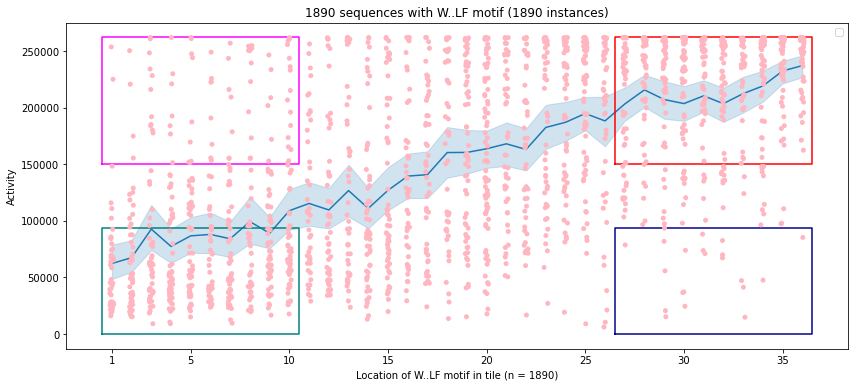

In [59]:
# pull out regions of the plot 
motif = 'W..LF'
WxxLFLocDF = plotMotifLocation(motif,masterDF[masterDF.Recovered],returnDF=True)

indx = WxxLFLocDF.Recovered&(WxxLFLocDF[motif]>0)&(WxxLFLocDF[motif+'_loc']>25)&(WxxLFLocDF[Activity]<ActivityThresh)
CtermWxxLF_weak = WxxLFLocDF[indx]
print('There are %i seqs that are Cterm and weak'%sum(indx))
tempDict = dict(zip(CtermWxxLF_weak.Name,CtermWxxLF_weak.ADseq))
protfasta.write_fasta(tempDict,'ExportedSeqLists/WxxLF_Location/CtermWxxLF_weak.fasta')

indx = WxxLFLocDF.Recovered&(WxxLFLocDF[motif]>0)&(WxxLFLocDF[motif+'_loc']>25)&(WxxLFLocDF[Activity]>HighActivityThresh)
CtermWxxLF_strong = WxxLFLocDF[indx]
print('There are %i seqs that are Cterm and strong'%sum(indx))
tempDict = dict(zip(CtermWxxLF_strong.Name,CtermWxxLF_strong.ADseq))
protfasta.write_fasta(tempDict,'ExportedSeqLists/WxxLF_Location/CtermWxxLF_strong.fasta')

indx = WxxLFLocDF.Recovered&(WxxLFLocDF[motif]>0)&(WxxLFLocDF[motif+'_loc']<10)&(WxxLFLocDF[Activity]<ActivityThresh)
NtermWxxLF_weak = WxxLFLocDF[indx]
print('There are %i seqs that are Nterm and weak'%sum(indx))
tempDict = dict(zip(NtermWxxLF_weak.Name,NtermWxxLF_weak.ADseq))
protfasta.write_fasta(tempDict,'ExportedSeqLists/WxxLF_Location/NtermWxxLF_weak.fasta')

indx = WxxLFLocDF.Recovered&(WxxLFLocDF[motif]>0)&(WxxLFLocDF[motif+'_loc']<10)&(WxxLFLocDF[Activity]>HighActivityThresh)
NtermWxxLF_strong = WxxLFLocDF[indx]
print('There are %i seqs that are Nterm and strong'%sum(indx))
tempDict = dict(zip(NtermWxxLF_strong.Name,NtermWxxLF_strong.ADseq))
protfasta.write_fasta(tempDict,'ExportedSeqLists/WxxLF_Location/NtermWxxLF_strong.fasta')

color1 = 'red'
color2='magenta'
color3='darkblue'
color4='teal'
plt.xticks([0,4,9,14,19,24,29,34],['1','5','10','15','20','25','30','35'])
# plt.scatter(CtermWxxLF_weak[motif+'_loc'],CtermWxxLF_weak[Activity],label='CtermWxxLF_weak',c=color3)
# plt.scatter(CtermWxxLF_strong[motif+'_loc'],CtermWxxLF_strong[Activity],label='CtermWxxLF_strong',c=color1)
# plt.scatter(NtermWxxLF_weak[motif+'_loc'],NtermWxxLF_weak[Activity],label='NtermWxxLF_weak',c=color4)
# plt.scatter(NtermWxxLF_strong[motif+'_loc'],NtermWxxLF_strong[Activity],label='NtermWxxLF_strong',c=color2)

HighActivityThresh = 150000
x1,x2,y1,y2 = 25.5,35.5,HighActivityThresh,maxActivity
plt.plot([x1,x2,x2,x1,x1],[y1,y1,y2,y2,y1],c=color1)
x1,x2,y1,y2 = -0.5,9.5,HighActivityThresh,maxActivity
plt.plot([x1,x2,x2,x1,x1],[y1,y1,y2,y2,y1],c=color2)
x1,x2,y1,y2 = 25.5,35.5,0,ActivityThresh
plt.plot([x1,x2,x2,x1,x1],[y1,y1,y2,y2,y1],c=color3)
x1,x2,y1,y2 = -0.5,9.5,0,ActivityThresh
plt.plot([x1,x2,x2,x1,x1],[y1,y1,y2,y2,y1],c=color4)
plt.ylabel('Activity')
plt.xlabel('Location of %s motif in tile (n = %i)'%(motif, len(WxxLFLocDF)))
# plt.plot([24.5,35.5,35.5,24.5,24.5],[HighActivityThresh,HighActivityThresh,maxActivity,maxActivity,HighActivityThresh],c=color1)
# plt.plot([24.5,35.5,35.5,24.5,24.5],[0,0,ActivityThresh,ActivityThresh,0],c=color3)

plt.legend()

plt.savefig('ExportedSeqLists/WxxLF_Location/WxxLF_locations.pdf')
# masterDF.WxxLF
# CtermWxxLF_weak

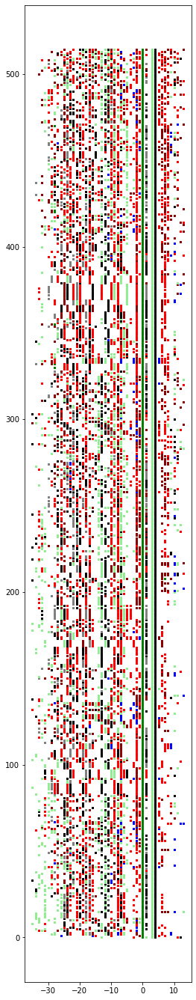

In [60]:
#visualize the subsets 
from matplotlib.font_manager import FontProperties
MyColorDict = {'D':'r','E':'darkred','F':'black','Y':'gray','K':'b','R':'b','W':'g','L':'lightgreen','M':'lightgreen'}
def visualizeSeqSet(tempDF):
    tempDF = tempDF.sort_values(by='Charge',ascending=False)
    tempDF = tempDF.reset_index()
    for i, line in tempDF.iterrows():
        tempSeq = line.ADseq
        Fcount = line['F']
        Lcount = line['L']
        Charge = line['Charge']
        motif = 'W..LF'
        match = re.search(motif,tempSeq)
        if (match): #improved on 20220613 to count all instances of a motif, not just first instance
            WxxLF_loc = match.start()
        for j, aa in enumerate(tempSeq):
            if aa in MyColorDict.keys():
                plt.scatter(j-WxxLF_loc,i,c=MyColorDict[aa],s=2,marker='s')
#         font = FontProperties()
#         font.set_size('xx-small')
#         font.set_family('monospace')
#         plt.text(15,i,'%i    %i    %.0f'%(Fcount,Lcount,Charge),fontproperties=font)
#     plt.text(15,i+1,'Fs   Ls   Charge',fontproperties=font)
fig = plt.figure(figsize=(4,24))
visualizeSeqSet(CtermWxxLF_strong)
plt.savefig('ExportedSeqLists/WxxLF_Location/VizualizedSets_Cterm_Strong.pdf')
plt.show()


In [61]:
NtermWxxLF_strong.name = 'NtermWxxLF_strong'
NtermWxxLF_weak.name = 'NtermWxxLF_weak'
CtermWxxLF_strong.name = 'CtermWxxLF_strong'
CtermWxxLF_weak.name = 'CtermWxxLF_weak'


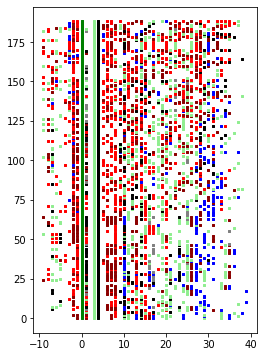

In [62]:
# fig = plt.figure(figsize=(4,6))
# visualizeSeqSet(CtermWxxLF_weak)
# plt.savefig('ExportedSeqLists/WxxLF_Location/VizualizedSets_Cterm_Weak.pdf')
# fig = plt.figure(figsize=(4,24))
# visualizeSeqSet(NtermWxxLF_weak)
# plt.savefig('ExportedSeqLists/WxxLF_Location/VizualizedSets_Nterm_Weak.pdf')
fig = plt.figure(figsize=(4,6))
visualizeSeqSet(NtermWxxLF_strong)
plt.savefig('ExportedSeqLists/WxxLF_Location/VizualizedSets_Nterm_Strong.pdf')


Nterm


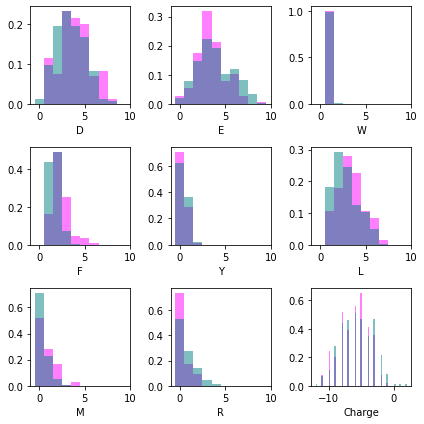

Cterm


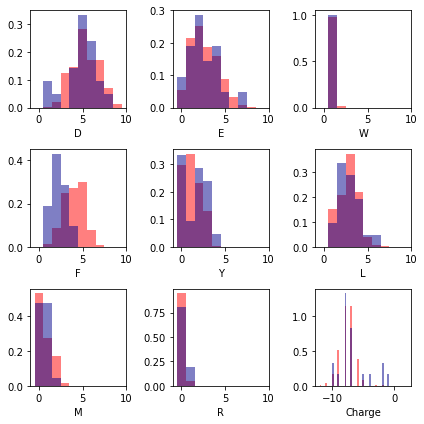

Strong


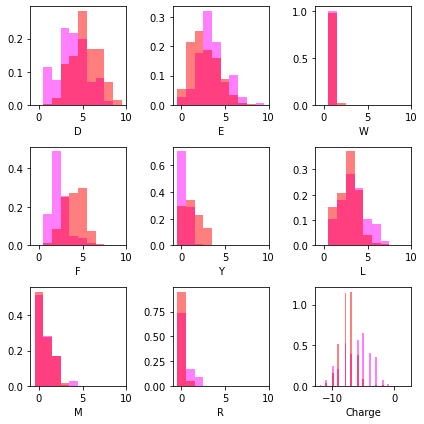

Weak


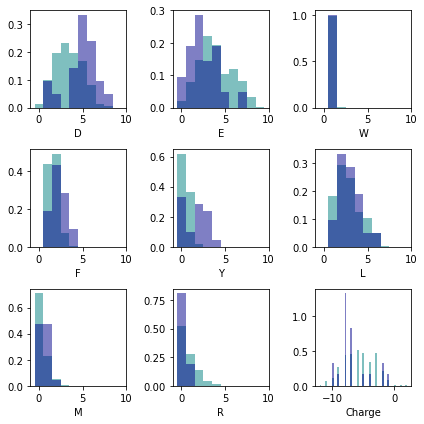

In [63]:
TempAASet=[ 'D','E','W','F','Y','L','M','R','Charge']
# for tempDF in [NtermWxxLF_strong, NtermWxxLF_weak,CtermWxxLF_strong,CtermWxxLF_weak]:
#     print(len(tempDF))
#     CheckAAs(tempDF,TempAASet)
bins = [-.5,.5,1.5,2.5,3.5,4.5,5.5,6.5,7.5,8.5,9.5]
Nterm = [NtermWxxLF_strong, NtermWxxLF_weak]
Cterm = [CtermWxxLF_strong,CtermWxxLF_weak]
Strong = [NtermWxxLF_strong, CtermWxxLF_strong,]
Weak  = [ NtermWxxLF_weak,CtermWxxLF_weak]
labels =['Nterm', 'Cterm','Strong', 'Weak']
Colors = {'NtermWxxLF_strong':color2, 'NtermWxxLF_weak':color4,
          'CtermWxxLF_strong':color1,'CtermWxxLF_weak':color3}

for j, DFset in enumerate( [Nterm, Cterm,Strong, Weak]):
    fig = plt.figure(figsize=(6,6))
    print(labels[j])
    for i, AA in enumerate(TempAASet):
        plt.subplot(3,3,i+1)
        for tempDF in DFset:
            if AA =='Charge':
                plt.hist(tempDF[AA],np.linspace(-12,2),alpha=.5,density=True,color=Colors[tempDF.name])
            else:
                plt.hist(tempDF[AA],bins,alpha=.5,density=True,color=Colors[tempDF.name])
            plt.xlabel(AA)
    plt.tight_layout()
    plt.savefig('ExportedSeqLists/WxxLF_Location/VizualizedSets_Hists%s.pdf'%labels[j])

    plt.show()

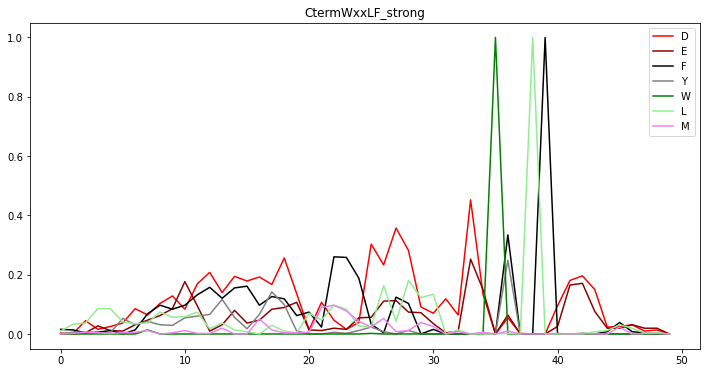

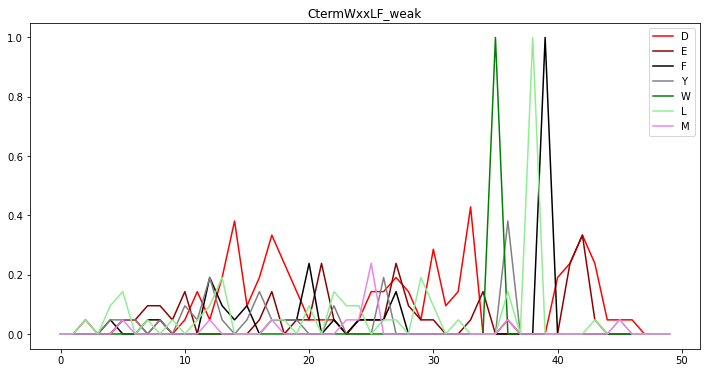

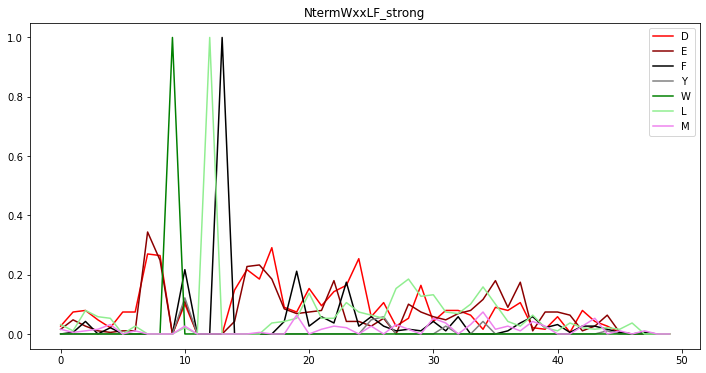

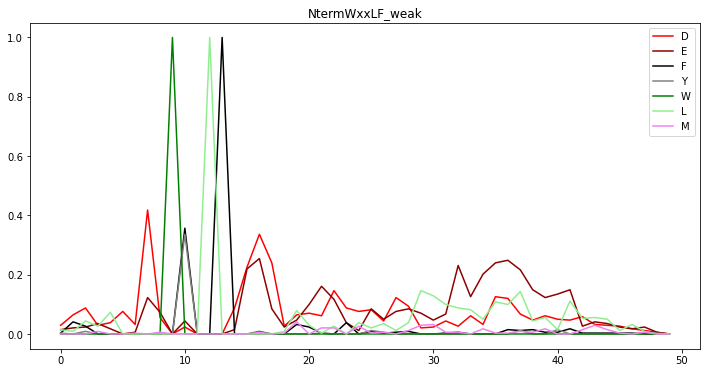

In [64]:
MyColorDict = {'D':'r','E':'darkred','F':'black','Y':'gray',
#                'P':'purple','S':'violet',
               'W':'g',
               'L':'lightgreen','M':'violet'}

def visualizeSeqSetSummary(tempDF):
    fig = plt.figure(figsize=(12,6))
    tempDF = tempDF.sort_values(by='Charge',ascending=False)
    tempDF = tempDF.reset_index()
    AAset = MyColorDict.keys()
    N =len(tempDF)
    locCorrection = max(tempDF['W..LF_loc'])
    maxtrixwidth =41+max(tempDF['W..LF_loc'])-min(tempDF['W..LF_loc']) 
    for AA in AAset:
        tempAAmatrix = np.zeros((N,maxtrixwidth))
        for i, line in tempDF.iterrows():
            tempSeq = line.ADseq
            WxxLF_loc = line['W..LF_loc']

            for j, aa in enumerate(tempSeq):
                if aa ==AA:
                    tempAAmatrix[i,locCorrection+j-WxxLF_loc]+=1
            
#                 plt.scatter(j-WxxLF_loc,i,c=MyColorDict[aa],s=2,marker='s')
        NormSum = np.sum(tempAAmatrix,axis=0)/N
        plt.plot(NormSum,MyColorDict[AA],label=AA)
    plt.legend()

visualizeSeqSetSummary(CtermWxxLF_strong)
plt.title(CtermWxxLF_strong.name)
plt.savefig('ExportedSeqLists/WxxLF_Location/VizualizedSetsSummary_Cterm_Strong.pdf')
plt.show()
visualizeSeqSetSummary(CtermWxxLF_weak)
plt.title(CtermWxxLF_weak.name)
plt.savefig('ExportedSeqLists/WxxLF_Location/VizualizedSetsSummary_Cterm_Weak.pdf')
plt.show()
visualizeSeqSetSummary(NtermWxxLF_strong)
plt.title(NtermWxxLF_strong.name)
plt.savefig('ExportedSeqLists/WxxLF_Location/VizualizedSetsSummary_Nterm_Strong.pdf')
plt.show()
visualizeSeqSetSummary(NtermWxxLF_weak)
plt.title(NtermWxxLF_weak.name)
plt.savefig('ExportedSeqLists/WxxLF_Location/VizualizedSetsSummary_Nterm_Weak.pdf')
plt.show()

In [ ]:
# pull out regions of the plot 
motif = 'FF'
FFLocDF = plotMotifLocation(motif,masterDF[masterDF.Recovered],returnNewtempDF=True)
print(FFLocDF.shape)
indx = (FFLocDF['Location']>28)&(FFLocDF[Activity]<ActivityThresh)
CtermFF_weak = FFLocDF[indx]
print('There are %i seqs that are Cterm and weak'%sum(indx))
tempDict = dict(zip(CtermFF_weak.Name,CtermFF_weak.ADseq))
protfasta.write_fasta(tempDict,'ExportedSeqLists/FF_Location/CtermFF_weak.fasta')

indx = (FFLocDF['Location']>28)&(FFLocDF[Activity]>HighActivityThresh)
CtermFF_strong = FFLocDF[indx]
print('There are %i seqs that are Cterm and strong'%sum(indx))
tempDict = dict(zip(CtermFF_strong.Name,CtermFF_strong.ADseq))
protfasta.write_fasta(tempDict,'ExportedSeqLists/FF_Location/CtermFF_strong.fasta')

indx = (FFLocDF['Location']<10)&(FFLocDF[Activity]<ActivityThresh)
NtermFF_weak = FFLocDF[indx]
print('There are %i seqs that are Nterm and weak'%sum(indx))
tempDict = dict(zip(NtermFF_weak.Name,NtermFF_weak.ADseq))
protfasta.write_fasta(tempDict,'ExportedSeqLists/FF_Location/NtermFF_weak.fasta')

indx = (FFLocDF['Location']<10)&(FFLocDF[Activity]>HighActivityThresh)
NtermFF_strong = FFLocDF[indx]
print('There are %i seqs that are Nterm and strong'%sum(indx))
tempDict = dict(zip(NtermFF_strong.Name,NtermFF_strong.ADseq))
protfasta.write_fasta(tempDict,'ExportedSeqLists/FF_Location/NtermFF_strong.fasta')

color1 = 'red'
color2='magenta'
color3='darkblue'
color4='teal'
plt.scatter(CtermFF_weak['Location'],CtermFF_weak[Activity],label='CtermFF_weak',c=color3)
plt.scatter(CtermFF_strong['Location'],CtermFF_strong[Activity],label='CtermFF_strong',c=color1)
plt.scatter(NtermFF_weak['Location'],NtermFF_weak[Activity],label='NtermFF_weak',c=color4)
plt.scatter(NtermFF_strong['Location'],NtermFF_strong[Activity],label='NtermFF_strong',c=color2)

x1,x2,y1,y2 = 28.5,38.5,HighActivityThresh,maxActivity
plt.plot([x1,x2,x2,x1,x1],[y1,y1,y2,y2,y1],c=color1)
x1,x2,y1,y2 = -0.5,9.5,HighActivityThresh,maxActivity
plt.plot([x1,x2,x2,x1,x1],[y1,y1,y2,y2,y1],c=color2)
x1,x2,y1,y2 = 28.5,38.5,0,ActivityThresh
plt.plot([x1,x2,x2,x1,x1],[y1,y1,y2,y2,y1],c=color3)
x1,x2,y1,y2 = -0.5,9.5,0,ActivityThresh
plt.plot([x1,x2,x2,x1,x1],[y1,y1,y2,y2,y1],c=color4)

# plt.plot([24.5,35.5,35.5,24.5,24.5],[HighActivityThresh,HighActivityThresh,maxActivity,maxActivity,HighActivityThresh],c=color1)
# plt.plot([24.5,35.5,35.5,24.5,24.5],[0,0,ActivityThresh,ActivityThresh,0],c=color3)

plt.legend()

plt.savefig('ExportedSeqLists/FF_Location/FF_locations.pdf')
# masterDF.FF
# CtermFF_weak

In [ ]:
print(CtermWxxLF_strong.shape)
temp = CtermWxxLF_strong.drop_duplicates(subset='ADseq')
print(temp.shape)

# top and bottom WxxLF tiles

There are 1311 very strong ADs with WxxLF motif
There are 604 inactive tiles with WxxLF motif
6.487538116630276e-22


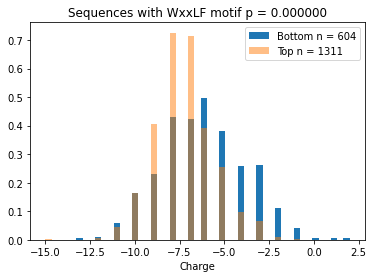

1.1496091769613433e-63


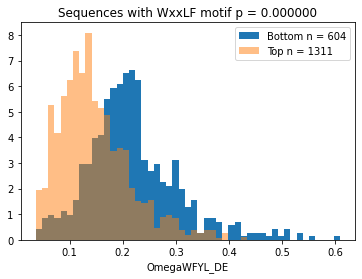

1.3150151540809311e-110


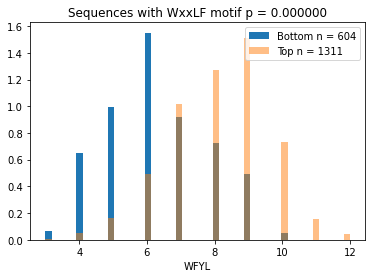

1.1858017607016623e-129


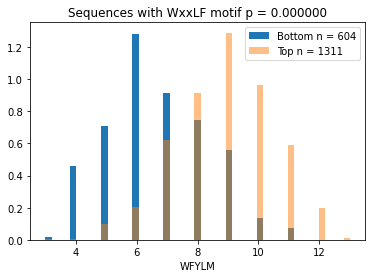

1.577894856795566e-137


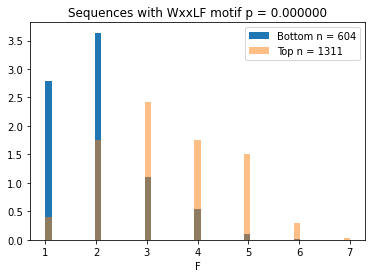

0.02666762682660895


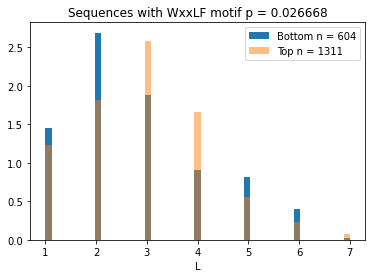

4.112211374792428e-14


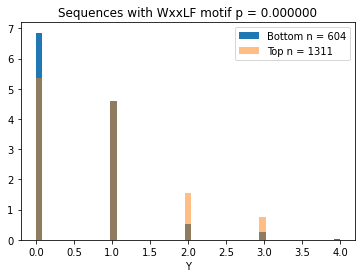

In [28]:
indx = (masterDF[Activity]>HighActivityThresh)&(masterDF['W..LF']>0)
tempDF = masterDF[indx]
top = masterDF[indx]
print('There are %i very strong ADs with WxxLF motif'%sum(indx))
tempDict = dict(zip(tempDF.Name,tempDF.ADseq))
protfasta.write_fasta(tempDict,'ExportedSeqLists/WxxLF_TopBot/AllStrongADsWithWxxLF.fasta')
# plot2ProperitesSpacePoints_blocks(tempDF,PropertySets[0])
# plot2ProperitesSpacePoints(tempDF,PropertySets[0],DotColor='Median')

indx = (masterDF[Activity]<ActivityThresh)&(masterDF['W..LF']>0)
tempDF = masterDF[indx]
bot = masterDF[indx]
print('There are %i inactive tiles with WxxLF motif'%sum(indx))
tempDict = dict(zip(tempDF.Name,tempDF.ADseq))
protfasta.write_fasta(tempDict,'ExportedSeqLists/WxxLF_TopBot/AllInactiveTilesWithWxxLF.fasta')
# plot2ProperitesSpacePoints_blocks(tempDF,PropertySets[0])
# plot2ProperitesSpacePoints(tempDF,PropertySets[0],DotColor='Median')

for prop in ['Charge','OmegaWFYL_DE','WFYL','WFYLM','F','L','Y']:
#     sns.histplot(data=bot, x=prop)
#     sns.histplot(data=bot, x=prop)
    minval = min([min(bot[prop]),min(top[prop])])
    maxval = max([max(bot[prop]),max(top[prop])])
    bins = np.linspace(minval,maxval)
    plt.hist(bot[prop],bins,label='Bottom n = %i'%len(bot),density=True)
    plt.hist(top[prop],bins,label='Top n = %i'%len(top),alpha =.5,density=True)
    test = stats.ttest_ind(bot[prop],top[prop], equal_var=False)
    print(test[1])
    plt.xlabel(prop)
    plt.title('Sequences with WxxLF motif p = %f'%test[1])
    plt.legend()
    plt.savefig('Figures/TopBot_WxxLFMotif_%s.pdf'%prop)
    plt.show()

# fig = plt.figure(figsize=(6,24))
# visualizeSeqSet(top)
# plt.savefig('ExportedSeqLists/WxxLF_TopBot/Vizualized_Top.pdf')
# fig = plt.figure(figsize=(6,24))
# visualizeSeqSet(bot)
# plt.savefig('ExportedSeqLists/WxxLF_TopBot/Vizualized_Bot.pdf')


4.34612084627004e-34


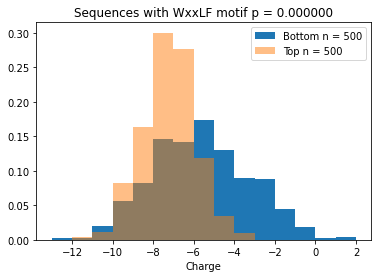

1.940577267957417e-137


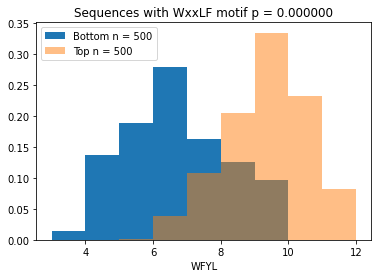

2.711164747591373e-89


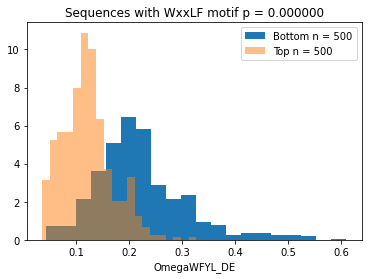

In [45]:
# Seqs with WxxLF motif--top and bottom

N = 500
indx = (masterDF['W..LF']>0)&(masterDF.Recovered)
tempDF = masterDF[indx]
tempDF =tempDF.sort_values(by=Activity,ascending=True,ignore_index=True)
bot =tempDF.loc[0:N-1,:] 
tempDF =tempDF.sort_values(by=Activity,ascending=False,ignore_index=True)
top =tempDF.loc[0:N-1,:]
exportfilename = 'ExportedSeqLists/WxxLF_TopBot/WxxLF_bottom%i.fasta'%N
tempDict = dict(zip(bot.Name,bot.ADseq))
protfasta.write_fasta(tempDict,exportfilename)
exportfilename = 'ExportedSeqLists/WxxLF_TopBot/WxxLF_top%i.fasta'%N
tempDict = dict(zip(top.Name,top.ADseq))
protfasta.write_fasta(tempDict,exportfilename)


for prop in ['Charge','WFYL','OmegaWFYL_DE',]:
#     sns.histplot(data=bot, x=prop)
#     sns.histplot(data=bot, x=prop)
#     minval = min(,min(top[prop])])
#     maxval = max([max(bot[prop]),max(top[prop])])
#     bins = int(maxval-minval)
    if prop =='OmegaWFYL_DE':
        plt.hist(bot[prop],20,label='Bottom n = %i'%len(bot),density=True)
        plt.hist(top[prop],20,label='Top n = %i'%len(top),alpha =.5,density=True)
    else:
        plt.hist(bot[prop],int(max(bot[prop])-min(bot[prop])),label='Bottom n = %i'%len(bot),density=True)
        plt.hist(top[prop],int(max(top[prop])-min(top[prop])),label='Top n = %i'%len(top),alpha =.5,density=True)
    test = stats.ttest_ind(bot[prop],top[prop], equal_var=False)
    print(test[1])
    plt.xlabel(prop)
    plt.title('Sequences with WxxLF motif p = %f'%test[1])
    plt.legend()
    plt.savefig('Figures/TopBot_WxxLFMotif_%s.pdf'%prop)
    plt.show()




# Grammar: Omega signal is correlated with activity

                    Activity_SCglucose  OmegaWFYL_DE
Activity_SCglucose            1.000000     -0.334393
OmegaWFYL_DE                 -0.334393      1.000000


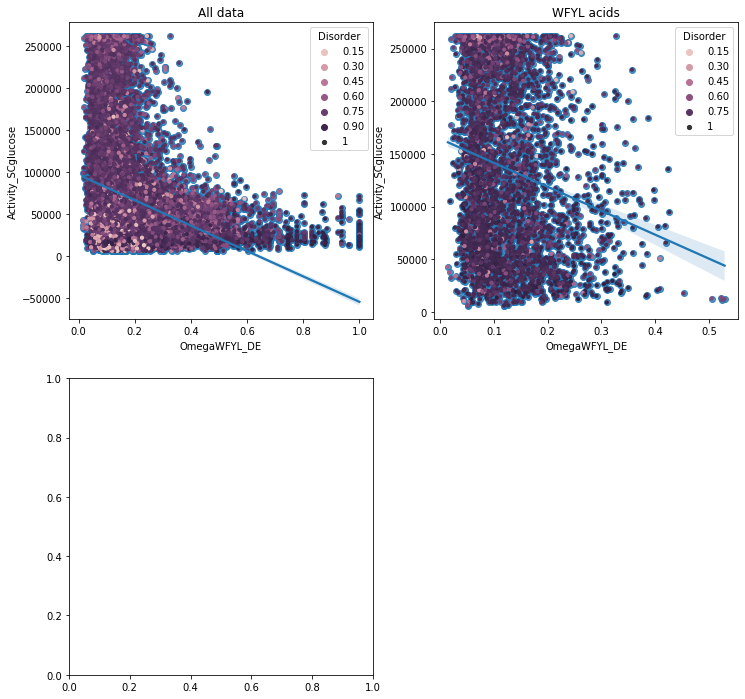

                    Activity_SCglucose  OmegaWFYL_DE
Activity_SCglucose            1.000000     -0.188727
OmegaWFYL_DE                 -0.188727      1.000000


In [46]:
fig,axes  = plt.subplots( figsize=(12,12))


prop ='OmegaWFYL_DE'#'Disorder'
tempDF = masterDF[masterDF.Recovered &(masterDF[prop]>0)]
plt.subplot(2,2,1)
sns.regplot(x= prop,y=Activity,data=tempDF)
sns.scatterplot(x= prop,y=Activity,hue='Disorder',data=tempDF,linewidth=0,size=1)
plt.title('All data')
tempDF2 = tempDF[[Activity,prop]]
print(tempDF2.corr())

plt.subplot(2,2,2)
tempDF = AcidBlobs_WFYL
sns.regplot(x= prop,y=Activity,data=tempDF)
sns.scatterplot(x= prop,y=Activity,hue='Disorder',data=tempDF,linewidth=0,size=1)
plt.title('WFYL acids')
plt.subplot(2,2,3)
# tempDF = AcidBlobs_WF
# sns.regplot(x= prop,y=Activity,data=tempDF)
# sns.scatterplot(x= prop,y=Activity,hue='Disorder',data=tempDF,linewidth=0,size=1)
# plt.title('WF acids')
plt.savefig('Figures/PaperFigs/Supp/OmegaVariations.pdf')
plt.show()

tempDF2 = tempDF[[Activity,prop]]
print(tempDF2.corr())


# Grammar: Distance from aromatic to acidic residue

For all Recovered Data


/var/folders/5y/4h2cd5wd3xq5hrv4zvnq29gh0000gq/T/ipykernel_7644/3920830329.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tempDF['ED2WFLmean']= tempSeries.map(avgDistDict)


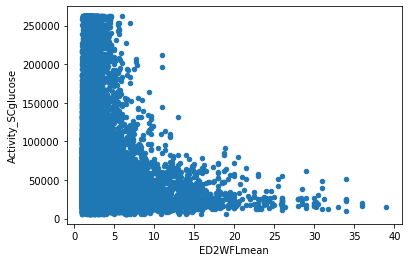

                    Activity_SCglucose  ED2WFLmean
Activity_SCglucose            1.000000   -0.260039
ED2WFLmean                   -0.260039    1.000000
For Acid Blobs WFYL


/var/folders/5y/4h2cd5wd3xq5hrv4zvnq29gh0000gq/T/ipykernel_7644/3920830329.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tempDF['ED2WFLmean']= tempSeries.map(avgDistDict)


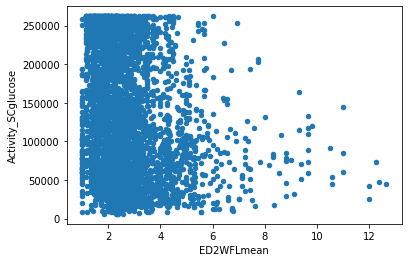

                    Activity_SCglucose  ED2WFLmean
Activity_SCglucose            1.000000   -0.249665
ED2WFLmean                   -0.249665    1.000000
For Acid Blobs WF


/var/folders/5y/4h2cd5wd3xq5hrv4zvnq29gh0000gq/T/ipykernel_7644/3920830329.py:34: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tempDF['ED2WFLmean']= tempSeries.map(avgDistDict)


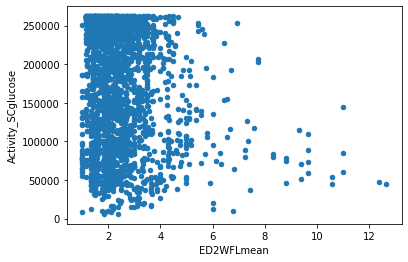

                    Activity_SCglucose  ED2WFLmean
Activity_SCglucose            1.000000   -0.176828
ED2WFLmean                   -0.176828    1.000000


In [43]:
#for each ADseq
def CalcDists2Sets(tempDF,AASet1,AASet2,usemean=True):
    DistList = []
    avgDistDict = {}
    for seq in tempDF.ADseq:
        holddists =[]
        if (re.search(AASet1,seq)):
            if re.search(AASet2,seq):
                for loc1 in re.finditer(AASet1,seq):
                    tempdists = []
                    for loc2 in re.finditer(AASet2,seq):
                        #find distance to every AA in AASet2
                        tempdists.append(np.abs(loc1.start()-loc2.start()))
                    holddists.append(min(tempdists)) # take min dist
        #         print holddists
                DistList.append(holddists)
                if usemean:
                    avgDistDict[seq]=np.mean(holddists)# dictionary of avg distances
                else:
                    avgDistDict[seq]=np.min(holddists)# dictionary of avg distances
                
            else:
                DistList.append(np.nan)
    return DistList,avgDistDict

AASet1 = 'E|D' #acidic residues
AASet2 = 'W|F|L' #hydro residues

def runDists(tempDF,title):
    print(title)

    dists, avgDistDict = CalcDists2Sets(tempDF,AASet1,AASet2)
    tempSeries = tempDF.ADseq
    tempDF['ED2WFLmean']= tempSeries.map(avgDistDict)
    cols = [Activity, 'ED2WFLmean']
    temp2 = tempDF[cols]
    tempDF.plot.scatter(x='ED2WFLmean',y=Activity)
    plt.show()
    a =temp2.corr()
    print( a)

indx = masterDF.Recovered
tempDF = masterDF[indx]# [1:3]
runDists(tempDF,'For all Recovered Data')

tempDF = AcidBlobs_WFYL
runDists(tempDF,'For Acid Blobs WFYL')

tempDF = AcidBlobs_WF
runDists(tempDF,'For Acid Blobs WF')

In [44]:
AcidBlobs_WF


,Unnamed: 0,ADseq,Name,ArrayDNA,Activity_BioRepA_BYS4,Activity_BioRepB_BYS4,TotalReads_BioRepA_BYS4,TotalReads_BioRepB_BYS4,BioRep_A_GFP_TotalReads,BioRep_A_GFP,...,MF.Y..L,M..Y..L,SP,[WFYL]...[WFYL][WFYL],WFL,WFYLM,WF,TotalReads_SCglucose,[MDENQSTYG][ADEFILMNQSTVWY][ILVFWM][ADEFILMNQSTVWY][ADEFHIKLMNQRSTVWY][ADEFHIKLMNQRSTVWY][ADEFILMNQSTVWY][ILVFWM][ILVFWMAY][ADEFGILMNPQSTVWY],ED2WFLmean
194,194,TALTALTSPSLYESPDFGYDVSPGFGSNDFDTGSNQWFSL,Sordariomycetes_jgi|Acral2|2019554|gm1.4974_g_971,ACTGCTTTGACTGCTTTGACTTCTCCATCTTTGTATGAATCTCCAG...,233944.016927,177620.582541,82336.0,30135.0,11810.0,6740.821254,...,0,0,3,0,9,11,5,112471.0,0,1.600000
195,195,LTSPSLYESPDFGYDVSPGFGSNDFDTGSNQWFSLFPDQS,Sordariomycetes_jgi|Acral2|2019554|gm1.4974_g_976,TTGACTTCTCCATCTTTGTATGAATCTCCAGACTTTGGTTATGATG...,258207.674080,250114.778591,2432.0,79158.0,281.0,7983.131267,...,0,0,3,0,9,11,6,81590.0,0,1.666667
196,196,LYESPDFGYDVSPGFGSNDFDTGSNQWFSLFPDQSTTPDA,Sordariomycetes_jgi|Acral2|2019554|gm1.4974_g_981,TTGTATGAATCTCCAGACTTTGGTTATGATGTTTCTCCAGGATTTG...,NaN,262143.000000,NaN,1493.0,NaN,NaN,...,0,0,2,0,8,10,6,NaN,0,2.571429
197,197,DFGYDVSPGFGSNDFDTGSNQWFSLFPDQSTTPDAPAPQP,Sordariomycetes_jgi|Acral2|2019554|gm1.4974_g_986,GACTTTGGTTATGATGTTTCTCCAGGATTTGGTTCTAATGACTTTG...,NaN,219939.454175,NaN,22909.0,NaN,NaN,...,0,0,1,0,7,8,6,NaN,0,2.666667
199,199,GSNDFDTGSNQWFSLFPDQSTTPDAPAPQPSPVQKPVETE,Sordariomycetes_jgi|Acral2|2019554|gm1.4974_g_996,GGTTCTAATGACTTTGATACTGGTTCTAATCAATGGTTCTCTTTGT...,68279.903869,49506.000000,15914.0,90.0,564.0,2556.977495,...,0,0,1,0,5,5,4,16004.0,0,9.666667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20707,20707,TDFIDEEVIMSIVIEMGIDRIKEIPEIWIGQNEFDFMTDF,CITED2_L2I_0,ACTGACTTTATTGATGAAGAAGTTATTATGTCTATTGTTATTGAAA...,125211.413280,206692.749688,43706.0,818.0,1207.0,2961.099365,...,0,0,0,0,5,8,5,44524.0,1,3.727273
20708,20708,TDFIDEEVAMSAVIEMGADRIKEAPEAWAGQNEFDFMTDF,CITED2_L2A_0,ACTGACTTTATTGATGAAGAAGTTGCTATGTCTGCTGTTATTGAAA...,254751.956584,236248.781508,4473.0,24555.0,746.0,4446.033070,...,0,0,0,0,5,8,5,29028.0,1,3.727273
20724,20724,LTALTSPSLFDGSPDFDTFDISPNFGHSDLENPDTWFSLF,Gnc4Lib_ChopOrthologs_HIGH_0,TTGACTGCTTTGACTTCTCCATCTTTGTTTGATGGTTCTCCAGACT...,259409.862979,261668.881021,38911.0,385354.0,5311.0,8730.167172,...,0,0,3,0,12,12,7,424265.0,0,1.142857
20727,20727,STDYTPMFEYETYEDNFKEWTSLFDNDIPVTTDDVSLADR,Gnc4Lib_Disorder_HIGH_0,TCTACTGATTATACTCCAATGTTTGAATATGAAACTTATGAAGATA...,261606.121575,261215.289071,3225.0,23456.0,414.0,8782.000000,...,0,0,0,0,6,10,4,26681.0,0,2.545455


# Look for grammar in the 'Acid Blob' region 

/var/folders/rc/pd8xzhm53gv2fky47bfzkc440000gn/T/ipykernel_13349/6295841.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  currentDF[motif]=tempcol
/var/folders/rc/pd8xzhm53gv2fky47bfzkc440000gn/T/ipykernel_13349/6295841.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  currentDF[motif]=tempcol
/var/folders/rc/pd8xzhm53gv2fky47bfzkc440000gn/T/ipykernel_13349/6295841.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer

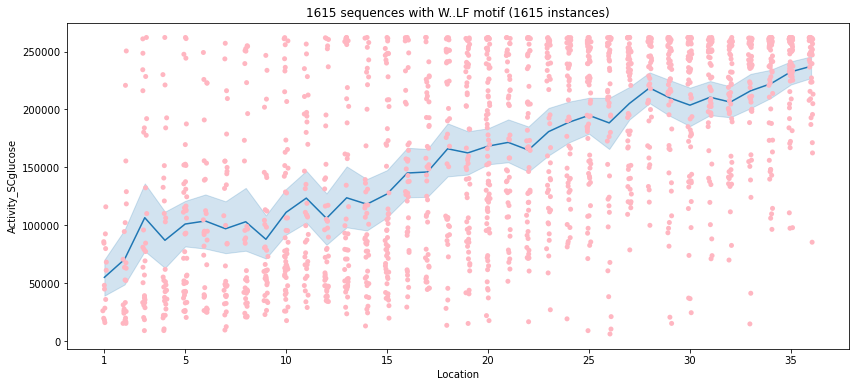

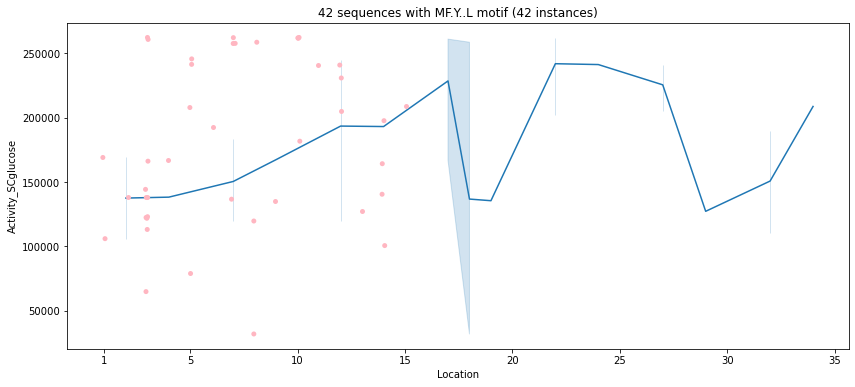

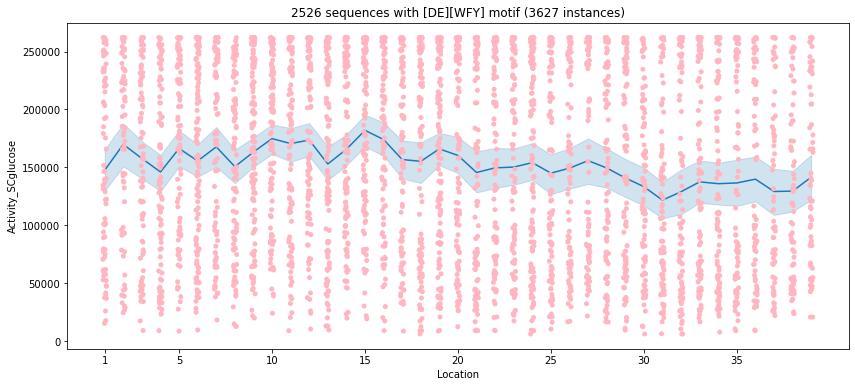

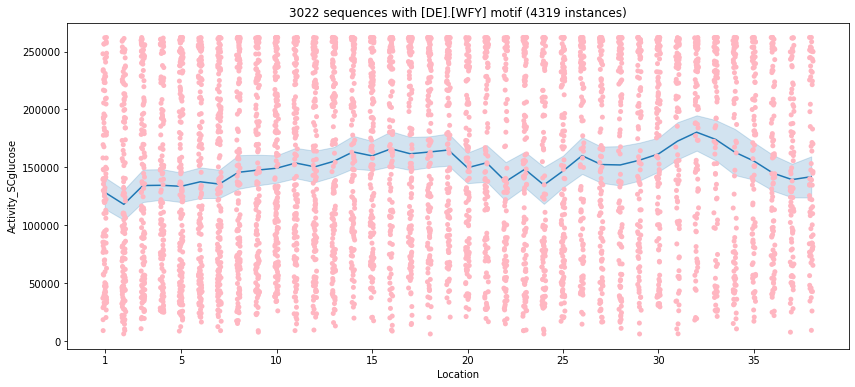

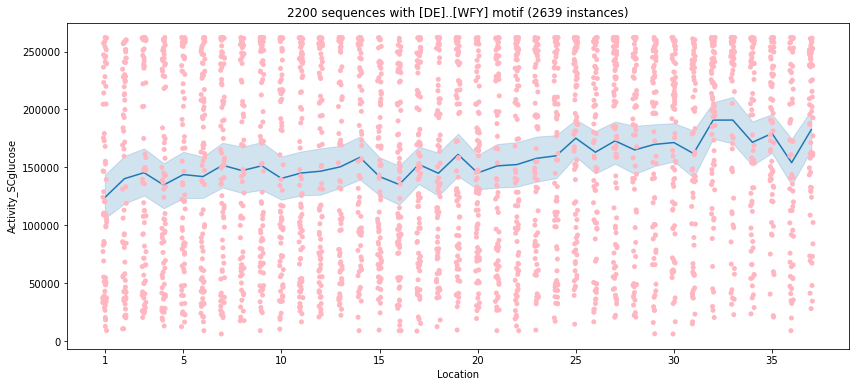

...

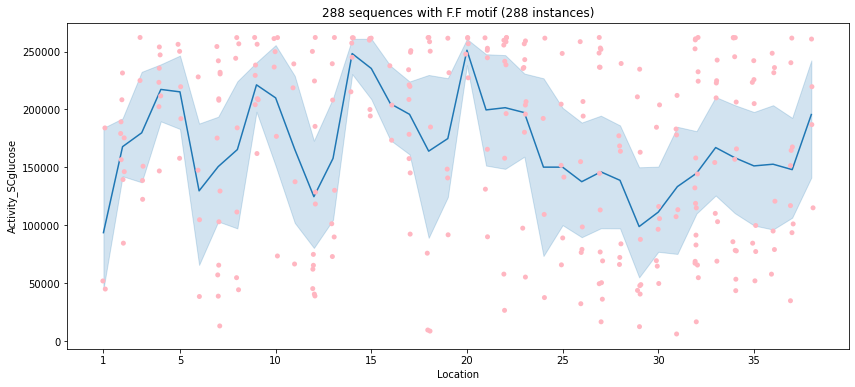

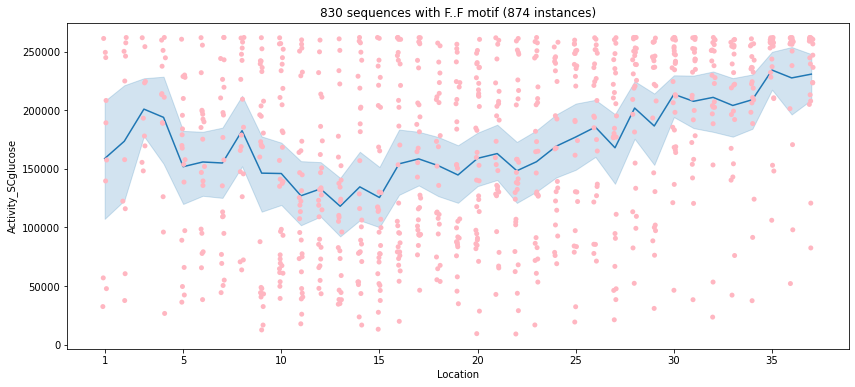

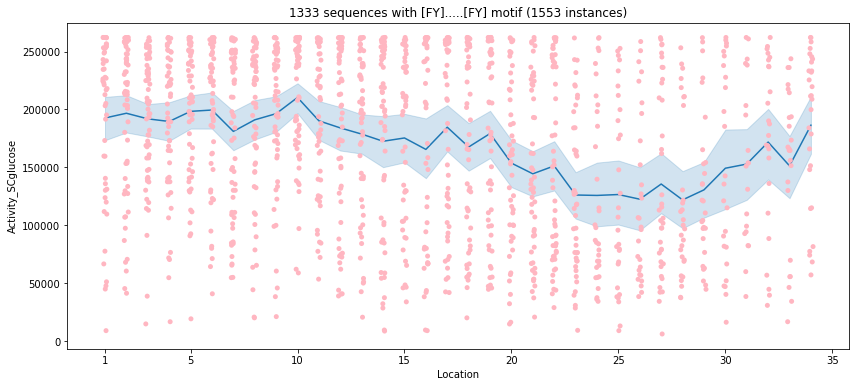

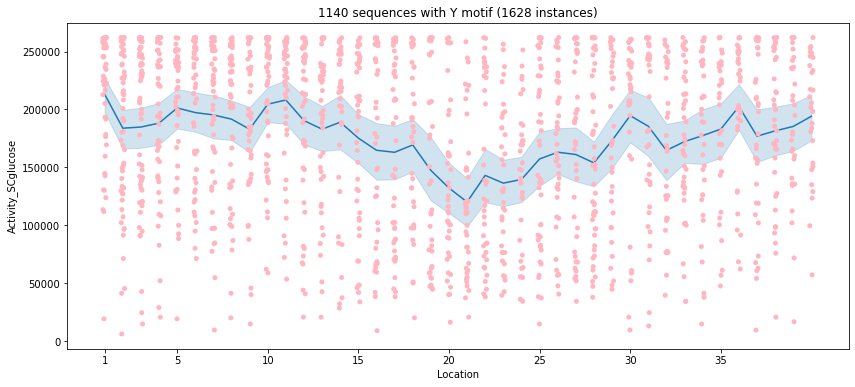

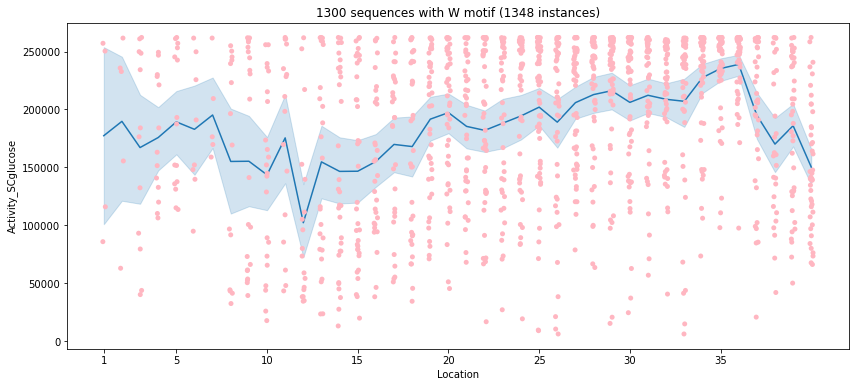

In [70]:
motiflist = ['W..LF', 'MF.Y..L',
#              '[WFYL]..[WFYL][WFYL]', #only adds 2 above below one
#              '[WFL]..[WFL][WFL]',
             '[DE][WFY]',
             '[DE].[WFY]',
             '[DE]..[WFY]',
             'F','FF','F.F','F..F',
            '[FY].....[FY]',
#              '[DE]L[DE][LF]',
             'Y','W',
#              '[WFYL][WFYL]','[WFYL].[WFYL]','[WFYL]..[WFYL]',
#              'DF','D.F','D..F','FD','F.D','F..D',
#               'DL','LD',
#              '[FWYL].[FWYL]..[FWYL]'
            ]
for DF in [AcidBlobs_WFYL,AcidBlobs_Aromatics,AcidBlobs_WF]:
    tempDF = CountMotifs(DF,motiflist,plothist=False,printstats=False)
    for motif in motiflist:
        plotMotifLocation(motif,tempDF,title='AcidBlobs')

                       Kappa     Omega  OmegaWFY_DE  OmegaWFYL_DE  Disorder  \
Kappa               1.000000  0.418196     0.259376      0.070832  0.056202   
Omega               0.418196  1.000000    -0.119702     -0.135809  0.024909   
OmegaWFY_DE         0.259376 -0.119702     1.000000      0.712439  0.011720   
OmegaWFYL_DE        0.070832 -0.135809     0.712439      1.000000  0.043072   
Disorder            0.056202  0.024909     0.011720      0.043072  1.000000   
Activity_SCglucose -0.224649 -0.079352    -0.239727     -0.188727 -0.198631   

                    Activity_SCglucose  
Kappa                        -0.224649  
Omega                        -0.079352  
OmegaWFY_DE                  -0.239727  
OmegaWFYL_DE                 -0.188727  
Disorder                     -0.198631  
Activity_SCglucose            1.000000  


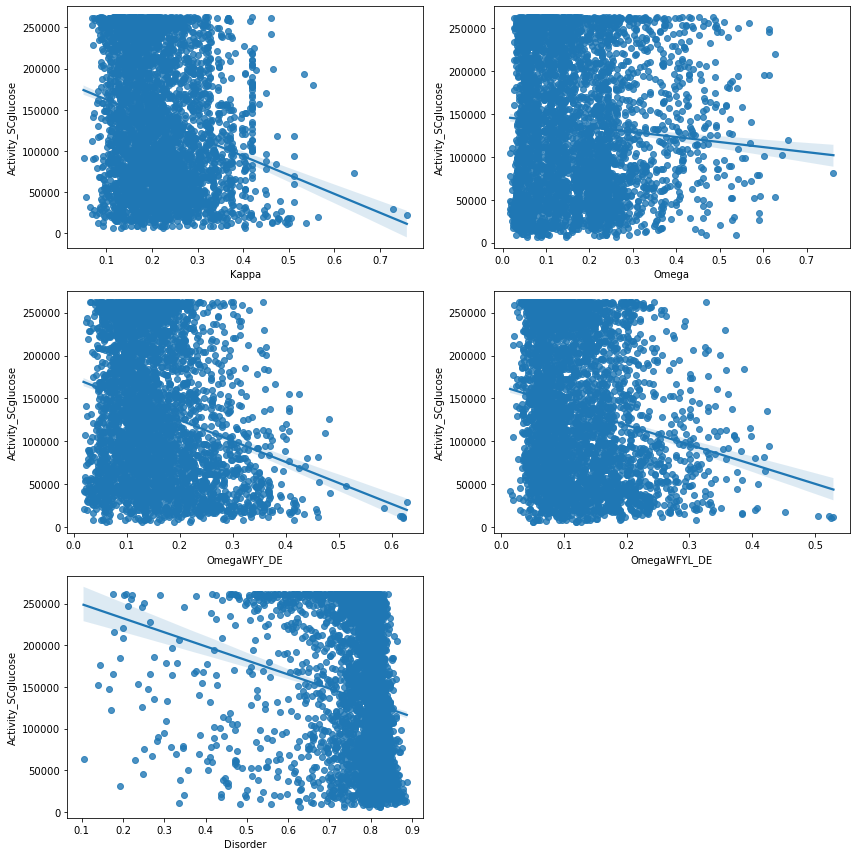

In [71]:
CheckProperties(AcidBlobs_WFYL)

/var/folders/rc/pd8xzhm53gv2fky47bfzkc440000gn/T/ipykernel_13349/6295841.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  currentDF[motif]=tempcol


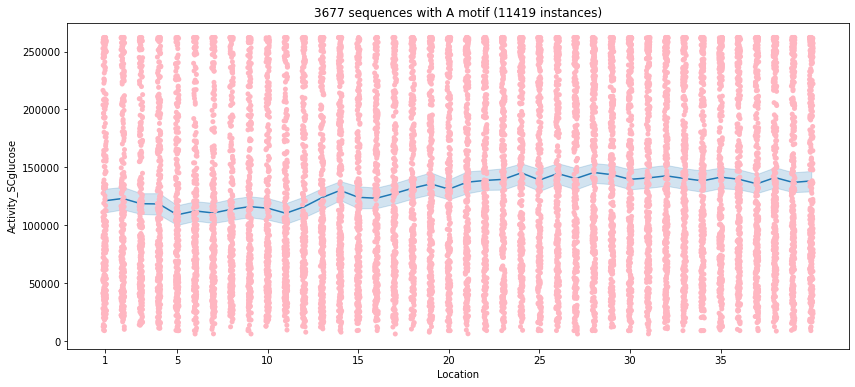

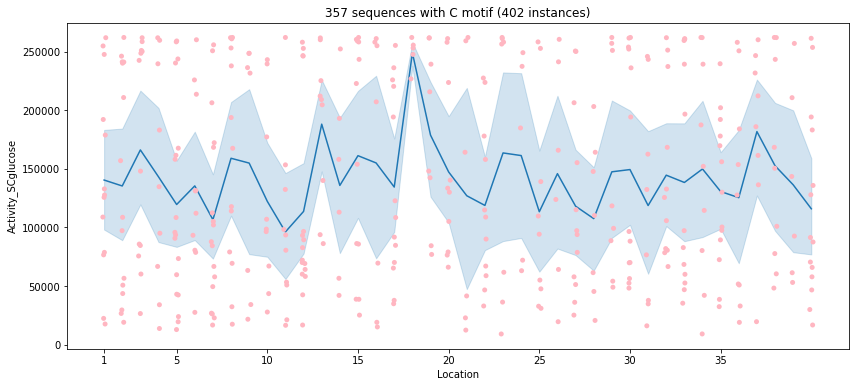

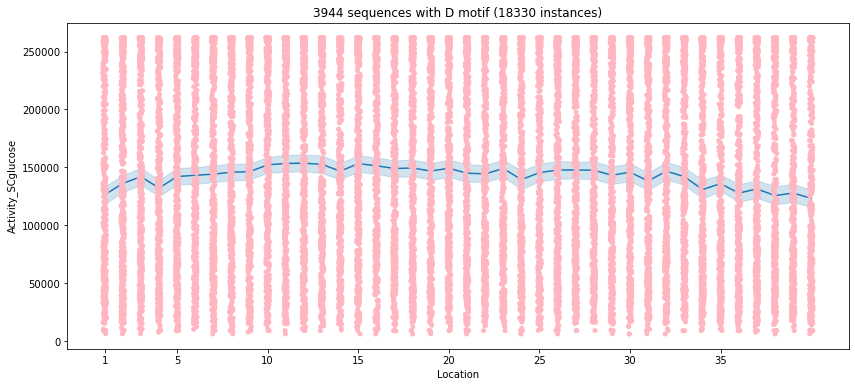

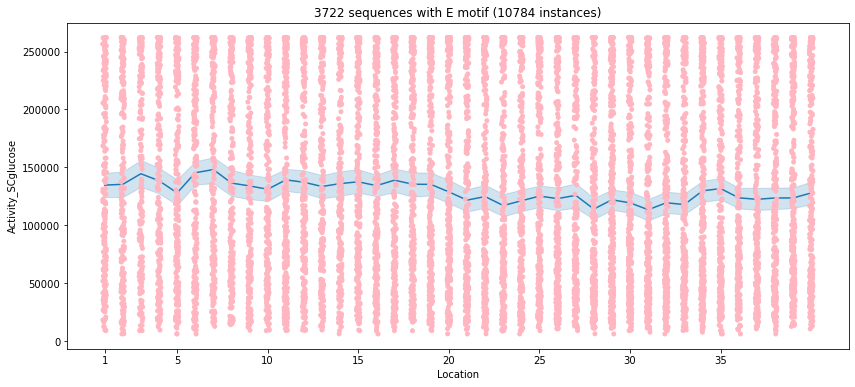

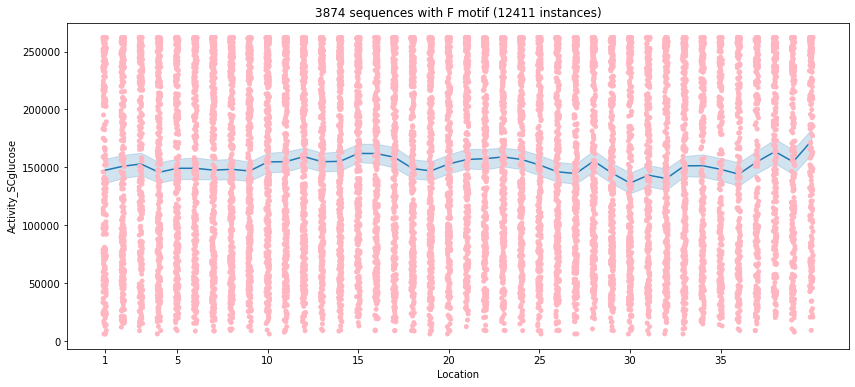

...

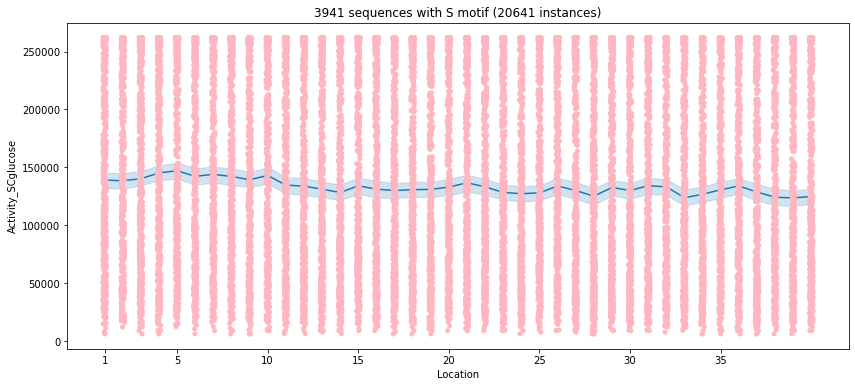

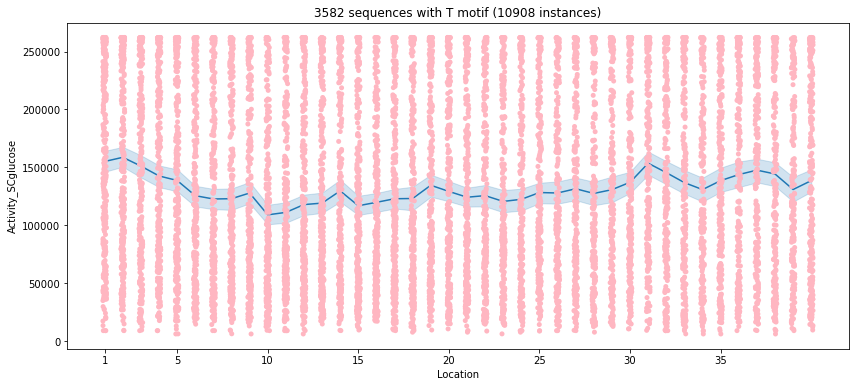

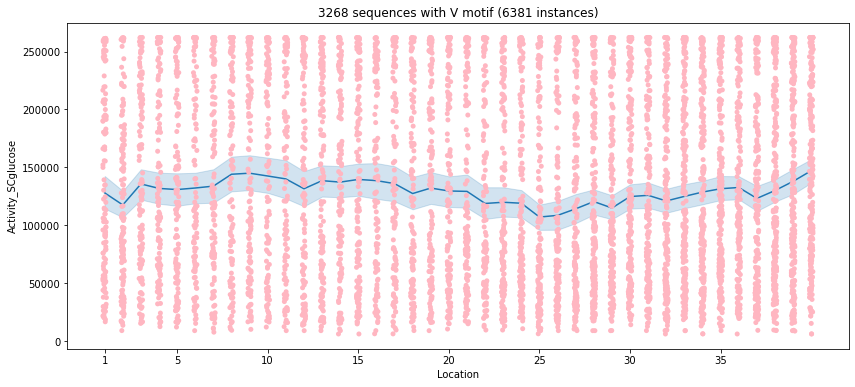

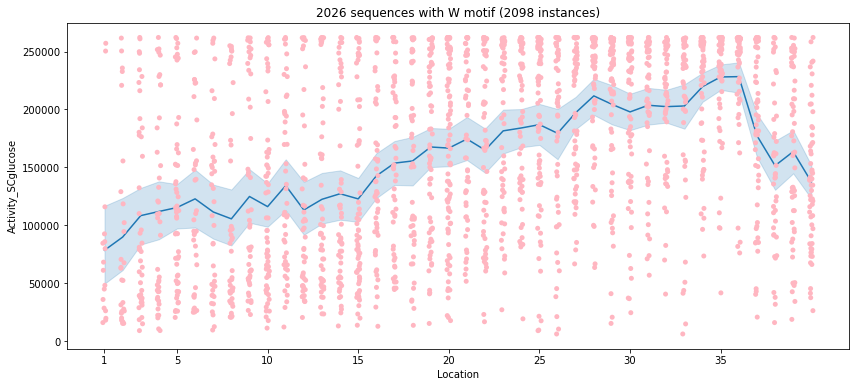

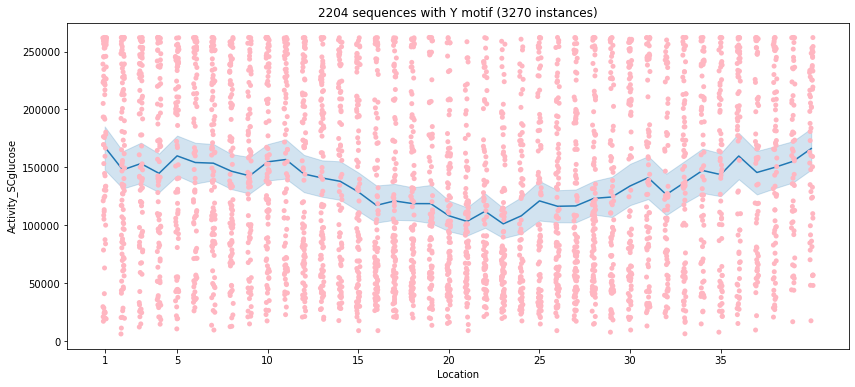

In [72]:
allAAs = ['A', 'C', 'D', 'E', 'F', 'G', 'H','I', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'V', 'W', 'Y']


for DF in [AcidBlobs_WFYL]:
    tempDF = CountMotifs(DF,allAAs,plothist=False,printstats=False)
    for motif in allAAs:
        plotMotifLocation(motif,tempDF,title='AcidBlobs')

In [73]:

def MotifStatsTable(currentDF, motiflist,outputfilename):
    statsDF = pd.DataFrame(columns=['Motif','Activity with Motif','Activity without Motif','Activity Difference','N with Motif','N without Motif','p value'])
    for motif in motiflist:
        tempcol = []
        column ='ADseq'
        for seq in currentDF[column]:
            hits = re.search(motif,seq)
            if hits:
                matches = re.findall(motif,seq)
                tempcol.append(len(matches))
            else:
                tempcol.append(0)
        currentDF[motif]=tempcol
        indx = (currentDF[motif]>0)&(currentDF.Recovered)
        tempDF = currentDF[indx]
        NOTindx = (currentDF[motif]==0)&(currentDF.Recovered)
        notDF = currentDF[NOTindx]
        # stats does not use non detected ADs
        test = stats.ttest_ind(tempDF[Activity],notDF[Activity], equal_var=False)
        activityWithMotif, Nwith       = np.mean(tempDF[Activity]),sum(indx)
        activityWithoutMotif, Nwithout = np.mean(notDF[Activity]) ,sum(NOTindx)
        pVal = test[1]
        statsDF.loc[len(statsDF.index)] = [motif,activityWithMotif,activityWithoutMotif,activityWithMotif-activityWithoutMotif,
                                          Nwith,Nwithout,pVal]

    statsDF.to_csv('Statistics/MotifEnrichment/%s.csv'%outputfilename)
    return statsDF
Stats_allRecovered = MotifStatsTable(masterDF[masterDF.Recovered],motiflist,'All_RecoveredSeqs')
Stats_AcidBlobs_WFYL = MotifStatsTable(AcidBlobs_WFYL,motiflist,'AcidBlobs_WFYL')
Stats_AcidBlobs_Aromatics = MotifStatsTable(AcidBlobs_Aromatics,motiflist,'AcidBlobs_Aromatics')
Stats_AcidBlobs_WF = MotifStatsTable(AcidBlobs_WF,motiflist,'AcidBlobs_WF')


statsDFmerge = Stats_allRecovered.merge(Stats_AcidBlobs_WFYL,how='inner',on='Motif')
statsDFmerge = statsDFmerge.sort_values(by='p value_y',ascending=True)
statsDFmerge
# AcidBlobs_Aromatics

Stats_AcidBlobs_WFYL.sort_values(by='p value',ascending=True)

/var/folders/rc/pd8xzhm53gv2fky47bfzkc440000gn/T/ipykernel_13349/1456742843.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  currentDF[motif]=tempcol
/var/folders/rc/pd8xzhm53gv2fky47bfzkc440000gn/T/ipykernel_13349/1456742843.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  currentDF[motif]=tempcol
/var/folders/rc/pd8xzhm53gv2fky47bfzkc440000gn/T/ipykernel_13349/1456742843.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,co

,Motif,Activity with Motif,Activity without Motif,Activity Difference,N with Motif,N without Motif,p value
11,W,161421.731625,109842.034113,51579.697512,2026,1925,5.570489e-93
0,W..LF,164102.892248,117063.430206,47039.462042,1615,2336,2.956421e-72
2,[DE][WFY],150173.683263,111682.540364,38491.142899,2526,1425,1.847509e-48
4,[DE]..[WFY],152023.044517,116525.211881,35497.832637,2200,1751,5.911263e-44
5,F,138162.741185,42128.371329,96034.369855,3874,77,1.194337e-35
9,[FY].....[FY],149440.874671,124342.057336,25098.817335,1881,2070,1.886597e-22
3,[DE].[WFY],143124.780825,114061.632174,29063.148651,3022,929,2.617057e-21
6,FF,172542.783951,133589.780021,38953.003929,274,3677,1.241217e-13
8,F..F,148939.884718,131683.275402,17256.609316,1055,2896,1.645574e-09
7,F.F,159506.771700,134286.834651,25219.937049,314,3637,1.839493e-07


In [74]:
Stats_AcidBlobs_WFYL.sort_values(by='Activity Difference',ascending=False)
Stats_AcidBlobs_WFYL.sort_values(by='p value',ascending=True)

,Motif,Activity with Motif,Activity without Motif,Activity Difference,N with Motif,N without Motif,p value
11,W,161421.731625,109842.034113,51579.697512,2026,1925,5.570489e-93
0,W..LF,164102.892248,117063.430206,47039.462042,1615,2336,2.956421e-72
2,[DE][WFY],150173.683263,111682.540364,38491.142899,2526,1425,1.847509e-48
4,[DE]..[WFY],152023.044517,116525.211881,35497.832637,2200,1751,5.911263e-44
5,F,138162.741185,42128.371329,96034.369855,3874,77,1.194337e-35
9,[FY].....[FY],149440.874671,124342.057336,25098.817335,1881,2070,1.886597e-22
3,[DE].[WFY],143124.780825,114061.632174,29063.148651,3022,929,2.617057e-21
6,FF,172542.783951,133589.780021,38953.003929,274,3677,1.241217e-13
8,F..F,148939.884718,131683.275402,17256.609316,1055,2896,1.645574e-09
7,F.F,159506.771700,134286.834651,25219.937049,314,3637,1.839493e-07


# Acid Blobs without the WxxLF motif


In [75]:
N = 500

AcidBlobs_WFYL_withoutWxxLFmotif =  AcidBlobs_WFYL[AcidBlobs_WFYL['W..LF']==0]
AcidBlobs_WFYL_withoutWxxLFmotif = AcidBlobs_WFYL_withoutWxxLFmotif.sort_values(by = Activity,ascending=False,ignore_index=True)
AcidBlobs_WFYL_withoutWxxLFmotif

print('There are %i Acid Blob sequences without a WxxLF motif'%len(AcidBlobs_WFYL_withoutWxxLFmotif))


top =AcidBlobs_WFYL_withoutWxxLFmotif.loc[0:N,:]
exportfilename = 'ExportedSeqLists/AcidBlobs_withoutWxxLFmotif/AcidicWFYL_noWxxLFmotif_top%i.fasta'%N
tempDict = dict(zip(top.Name,top.ADseq))
protfasta.write_fasta(tempDict,exportfilename)

bot = AcidBlobs_WFYL_withoutWxxLFmotif.sort_values(by = Activity,ascending=True,ignore_index=True)
bot =bot.loc[0:N,:]
exportfilename = 'ExportedSeqLists/AcidBlobs_withoutWxxLFmotif/AcidicWFYL_noWxxLFmotif_bot%i.fasta'%N
tempDict = dict(zip(bot.Name,bot.ADseq))
protfasta.write_fasta(tempDict,exportfilename)

# export seqs for legacy Kmer analysis
sortedDF = AcidBlobs_WFYL_withoutWxxLFmotif.sort_values(by=Activity,ascending=False)
outputseqs = sortedDF['ADseq'][:200]
outputfilename = 'ExportedSeqLists/KmerAnalysis/Acid_WFYL_NoMotif_200top.txt'
target = open(outputfilename,'w')
for seq in outputseqs:
    target.write(seq)
    target.write('\n')
target.close()
sortedDF = AcidBlobs_WFYL_withoutWxxLFmotif.sort_values(by=Activity,ascending=True)
outputseqs = sortedDF['ADseq'][:200]
outputfilename = 'ExportedSeqLists/KmerAnalysis/Acid_WFYL_NoMotif_200bottom.txt'
target = open(outputfilename,'w')
for seq in outputseqs:
    target.write(seq)
    target.write('\n')
target.close()
outputfilename = 'ExportedSeqLists/KmerAnalysis/Acid_WFYL_NoMotif_Fullset_Background.txt'
target = open(outputfilename,'w')
outputseqs = sortedDF['ADseq']
for seq in outputseqs:
    target.write(seq)
    target.write('\n')
target.close()

There are 2336 Acid Blob sequences without a WxxLF motif


# Export all Active and inactive sequences for Motif enrichment analysis

In [76]:
indx = masterDF.Recovered &(masterDF[Activity]>=ActivityThresh)
tempDF = masterDF[indx]
exportfilename = 'ExportedSeqLists/SanjanaMotifEnrichment/All_Active_Seqs_vs_others/Active_%i.fasta'%sum(indx)
tempDict = dict(zip(tempDF.Name,tempDF.ADseq))
protfasta.write_fasta(tempDict,exportfilename)

indx = masterDF.Recovered &(masterDF[Activity]<ActivityThresh)
tempDF = masterDF[indx]
exportfilename = 'ExportedSeqLists/SanjanaMotifEnrichment/All_Active_Seqs_vs_others/Inctive_%i.fasta'%sum(indx)
tempDict = dict(zip(tempDF.Name,tempDF.ADseq))
protfasta.write_fasta(tempDict,exportfilename)

indx = masterDF.Recovered 
tempDF = masterDF[indx]
exportfilename = 'ExportedSeqLists/SanjanaMotifEnrichment/All_Active_Seqs_vs_others/All_%i.fasta'%sum(indx)
tempDict = dict(zip(tempDF.Name,tempDF.ADseq))
protfasta.write_fasta(tempDict,exportfilename)

print('Activity Threshold is %f '%ActivityThresh)

Activity Threshold is 94031.000000 


# Tiles with saturated Activity (max activity)

In [77]:
# how many very high activity ADs--saturating activity
indx = (masterDF[Activity] >=( (max(masterDF[Activity]))) )
print('There are %i ADs with saturated max activity'%sum(indx))
indx = (masterDF[Activity] >=( (max(masterDF[Activity]))) )&(masterDF['W..LF']>0)
print('There are %i ADs with saturated max activity and the WxxLF motif'%sum(indx))
tempDF =masterDF[indx]
tempDF

exportfilename = 'ExportedSeqLists/SaturatedMeasurments_WxxLF.fasta'
tempDict = dict(zip(tempDF.Name,tempDF.ADseq))
protfasta.write_fasta(tempDict,exportfilename)

indx = (masterDF[Activity] >=( (max(masterDF[Activity]))) )&(masterDF['W..LF']==0)
print('There are %i ADs with saturated max activity without the WxxLF motif'%sum(indx))
tempDF =masterDF[indx]
exportfilename = 'ExportedSeqLists/SaturatedMeasurments_without_WxxLF.fasta'
tempDict = dict(zip(tempDF.Name,tempDF.ADseq))
protfasta.write_fasta(tempDict,exportfilename)



There are 47 ADs with saturated max activity
There are 28 ADs with saturated max activity and the WxxLF motif
There are 19 ADs with saturated max activity without the WxxLF motif


# Look at highly active tiles that are not acid blobs

There are 1598 active "non WFYL acid blobs"
665 have high activity
1598 have activity
                       Kappa     Omega  OmegaWFY_DE  OmegaWFYL_DE  Disorder  \
Kappa               1.000000  0.361459     0.353483      0.149670  0.063114   
Omega               0.361459  1.000000     0.159372     -0.044289  0.152439   
OmegaWFY_DE         0.353483  0.159372     1.000000      0.541809 -0.063500   
OmegaWFYL_DE        0.149670 -0.044289     0.541809      1.000000 -0.151656   
Disorder            0.063114  0.152439    -0.063500     -0.151656  1.000000   
Activity_SCglucose -0.117405 -0.163403    -0.138917     -0.170181 -0.065729   

                    Activity_SCglucose  
Kappa                        -0.117405  
Omega                        -0.163403  
OmegaWFY_DE                  -0.138917  
OmegaWFYL_DE                 -0.170181  
Disorder                     -0.065729  
Activity_SCglucose            1.000000  
There are 16 active PositiveRegions regions
2 have high activity
16 have 

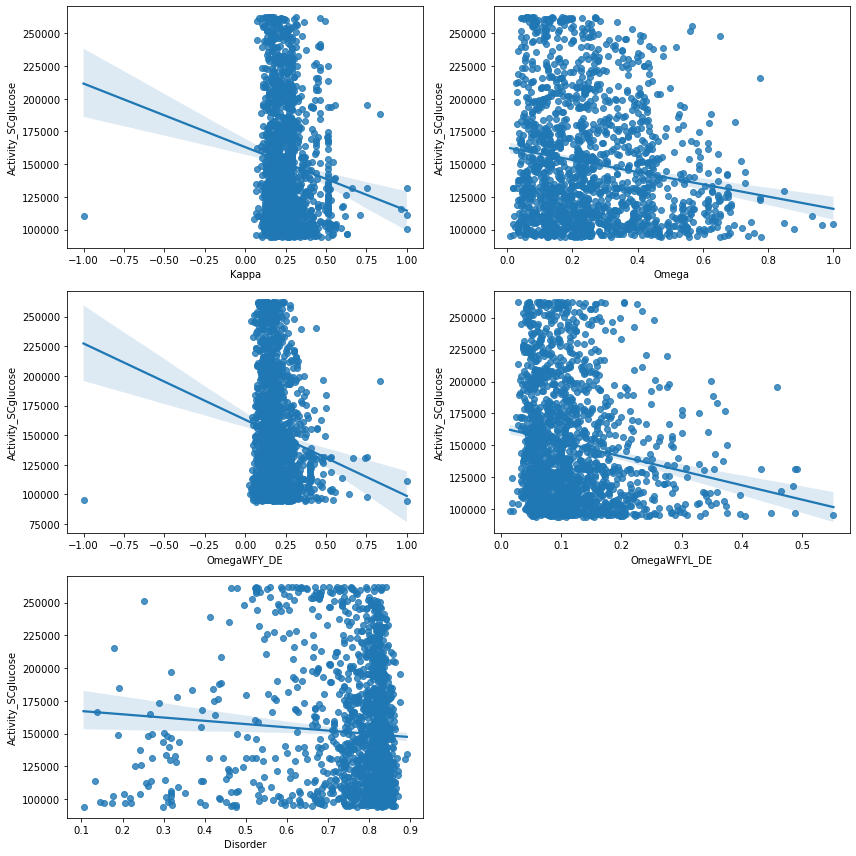

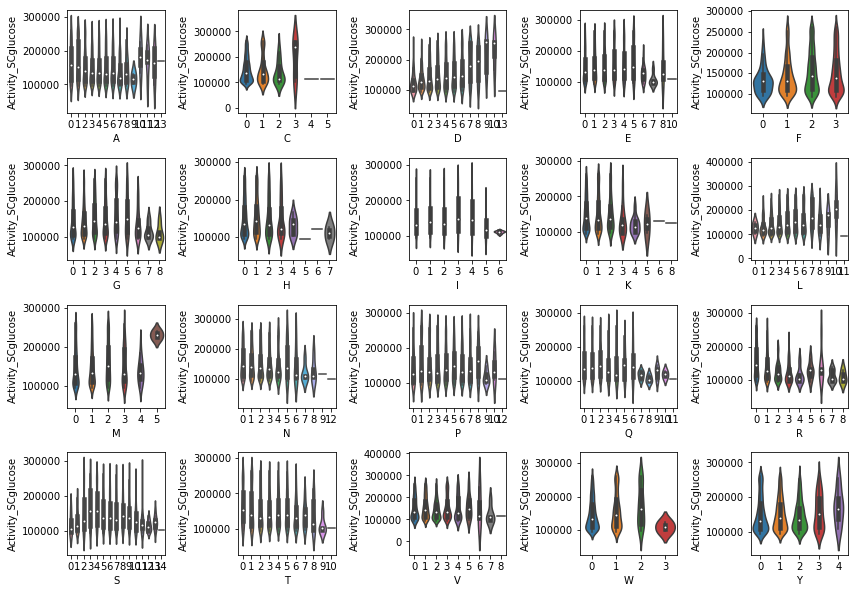

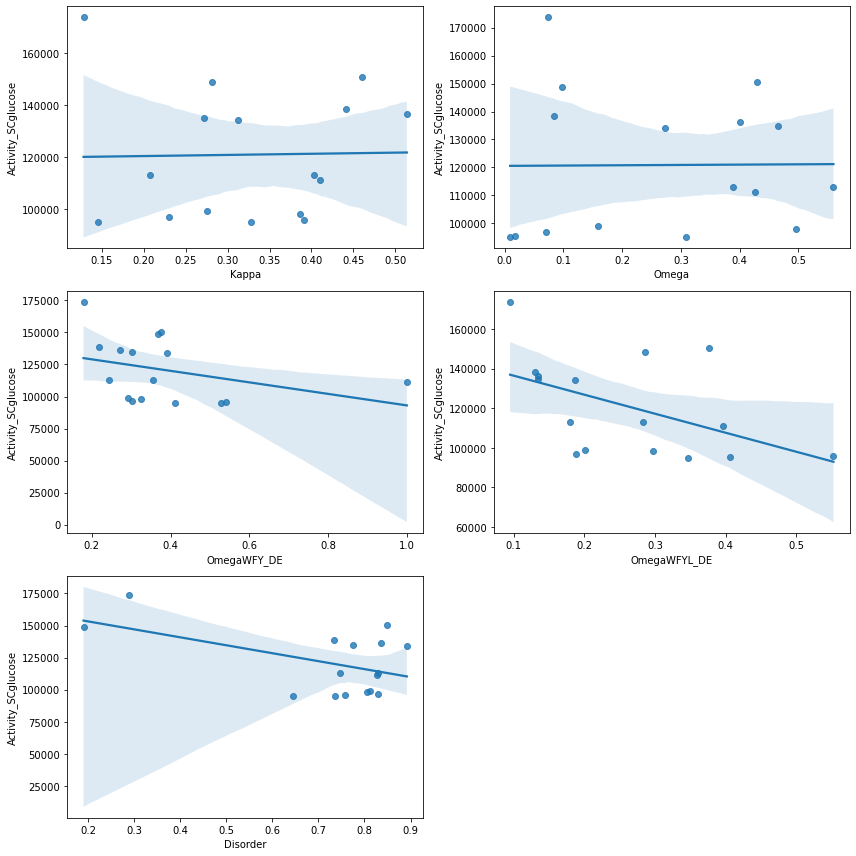

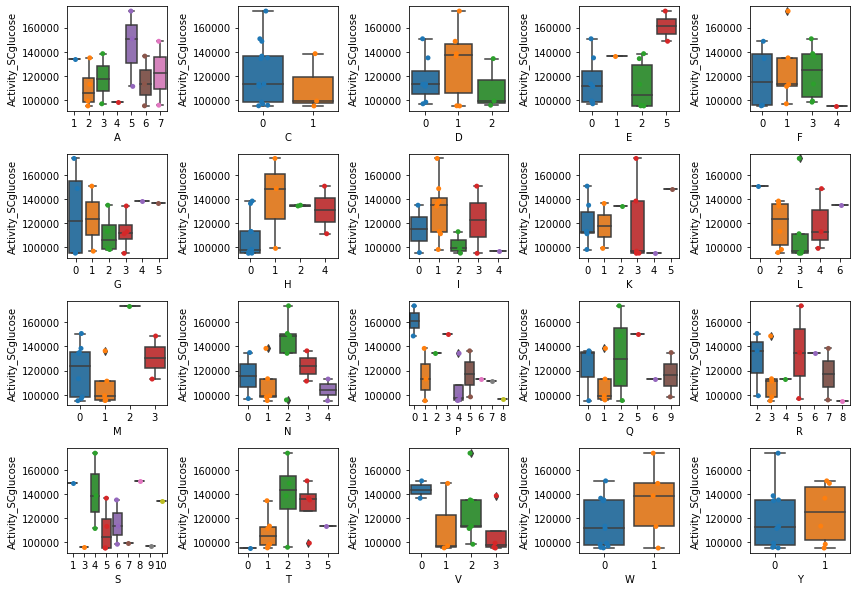

In [78]:
# non acidic ADs
indx = masterDF.Recovered & ~((masterDF.WF >3)&(masterDF.Charge<=-chargethresh)) & (masterDF[Activity]>ActivityThresh)
StrongTiles_notWFYLAcidBlobs = masterDF[indx]
print('There are %i active "non WFYL acid blobs"'%sum(indx))
print('%i have high activity'%sum(indx&(masterDF[Activity]>HighActivityThresh)))
print('%i have activity'%sum(indx&(masterDF[Activity]>ActivityThresh)))
CheckProperties(StrongTiles_notWFYLAcidBlobs)
CheckAAs(StrongTiles_notWFYLAcidBlobs,allAAs)

# non acidic ADs
indx = masterDF.Recovered & (masterDF.Charge>0) & (masterDF[Activity]>ActivityThresh) &(masterDF.TotalReads_SCglucose>200)
StrongTiles_PositiveRegions = masterDF[indx]
print('There are %i active PositiveRegions regions'%sum(indx))
print('%i have high activity'%sum(indx&(masterDF[Activity]>HighActivityThresh)))
print('%i have activity'%sum(indx&(masterDF[Activity]>ActivityThresh)))


CheckProperties(StrongTiles_PositiveRegions)
CheckAAs(StrongTiles_PositiveRegions,allAAs)

# Count combinations of Motifs

In [108]:
import itertools

def findbestmotifset(currentDF,inputmotiflist = ['W..LF', '[DE][WFY]', 'FF']):
    print('Searching in this set of motifs:')
#     print( motiflist)
    def powerset(iterable):
        "powerset([1,2,3]) --> () (1,) (2,) (3,) (1,2) (1,3) (2,3) (1,2,3)"
        s = list(iterable)
        return itertools.chain.from_iterable(itertools.combinations(s, r) for r in range(len(s)+1))

#     motiflist = ['W..LF',
# #              'MF.Y..L', '[WFYL]..[WFYL][WFYL]','[WFL]..[WFL][WFL]','[DE][WFY]',
#              'FF','F.F','F..F',
#              '[FWYL].[FWYL]..[FWYL]']
    tempdict = defaultdict()
    maxPearson = 0
    currentDF = CountMotifs(currentDF,inputmotiflist,printstats=False,plothist=False)
    for tempmotiflist in powerset(inputmotiflist):
    #     print (tempmotiflist)
        if len(tempmotiflist)>1:
            tempDF = currentDF[list(tempmotiflist)]
            currentDF['motif_sum'] = tempDF.sum(axis=1)
            tempDF = currentDF[currentDF.Recovered]
            # sns.regplot(x='motif_sum',y=Activity,data=tempDF, fit_reg=True,)
    #         sns.jointplot(x='motif_sum',y=Activity,data=tempDF, kind='reg')
            corr = scipy.stats.pearsonr(tempDF['motif_sum'],tempDF[Activity])
    #         print('Pearson = %.2f'%corr[0])
            tempdict[corr[0]] = list(tempmotiflist)
            if corr[0]> maxPearson:
                maxPearson = corr[0]
            corr = scipy.stats.spearmanr(tempDF['motif_sum'],tempDF[Activity])
    #         print('Spearman = %.2f'%corr[0])
    #         plt.title('Corr = %.2f'%corr[0])
    #         plt.show()
    print (maxPearson)
    print(tempdict[maxPearson])


    
    tempDF = currentDF[list(inputmotiflist)]
    currentDF['motif_sum_Max'] = tempDF.sum(axis=1)
    tempDF = currentDF[currentDF.Recovered]
    sns.boxplot(x='motif_sum_Max',y=Activity,data=tempDF,color='gray')
    sns.stripplot(x='motif_sum_Max',y=Activity,data=tempDF,color='k',size=1)
    plt.title(inputmotiflist)
# findbestmotifset(masterDF[masterDF.Recovered])
# plt.savefig('Figures/MotifSum_vs_activity_all.pdf')
# plt.show()
# findbestmotifset(AcidBlobs_WFYL,inputmotiflist =['MF','FS','SL','DI','LF','LD'])
# findbestmotifset(AcidBlobs_WFYL,inputmotiflist =['MF','FS','FD','SL','DI','LF','LD'])
# 20230220
# # findbestmotifset(AcidBlobs_WFYL,inputmotiflist =['TQ', 'GL', 'GI', 'HT', 'PT', 'ML', 'IM', 'FD', 'DL', 'DF', 'LF', 'LD', 'LP', 'QQ'])

# plt.savefig('Figures/MotifSum_vs_activity_upperleftCorner_Dipeptides.pdf')
# plt.show()



Searching in this set of motifs:


/var/folders/rc/pd8xzhm53gv2fky47bfzkc440000gn/T/ipykernel_13349/6295841.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  currentDF[motif]=tempcol
/var/folders/rc/pd8xzhm53gv2fky47bfzkc440000gn/T/ipykernel_13349/1494929421.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  currentDF['motif_sum'] = tempDF.sum(axis=1)
/var/folders/rc/pd8xzhm53gv2fky47bfzkc440000gn/T/ipykernel_13349/1494929421.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .lo

0.3645516383372199
['W..LF', '[DE][WFY]', 'FF']


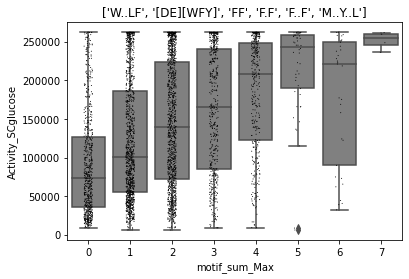

In [109]:
findbestmotifset( AcidBlobs_WFYL,inputmotiflist =['W..LF', '[DE][WFY]', 'FF','F.F','F..F','M..Y..L'])
plt.savefig('Figures/PaperFigs/MotifSum_vs_activity_PublishedMotifs.pdf')


In [47]:
# export data for a supplemental table.
masterDF.to_csv('Figures/PaperFigs/Supp/Table_S5_Tile_Activities_Properties_Dataframe.csv')